#Importing needed libs

In [ ]:
# Import necessary libraries
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, KFold
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import mean_squared_error , accuracy_score
from sklearn.preprocessing import StandardScaler

import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, LeakyReLU, Lambda, Conv2D, MaxPooling2D, UpSampling2D
from tensorflow import keras
from tensorflow.keras import layers

import keras
from keras import ops
from keras import layers


from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Functions

In [ ]:
def plot_samples(images, labels, num_samples=5):

    plt.figure(figsize=(15, num_samples // 2 * 3))  # Adjust the figure size

    for i in range(num_samples):
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(images[i])  # Display the image
        plt.title(f"Label: {labels[i]}")  # Display the numerical label
        plt.axis('off')  # Hide axes for better display

    plt.tight_layout()
    plt.show()


In [ ]:
def scale_image(img):

    # Scale the image to the range [0, 1]
    img_min = img.min()
    img_max = img.max()
    return (img - img_min) / (img_max - img_min)

In [ ]:
# Plot Original vs Reconstructed Images
def plot_reconstruction(original, reconstructed, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        # Original images
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(original[i].reshape(image_shape, image_shape, 3))
        plt.title("Original")
        plt.axis("off")

        # Reconstructed images
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(reconstructed[i].reshape(image_shape, image_shape, 3))
        plt.title("Reconstructed")
        plt.axis("off")
    plt.show()

In [ ]:
def visualize_latent_space(encoder_model, data, labels, method="pca", num_classes=None, sample_fraction=1.0):

    # Encode the data to the latent space
    encoder_output = encoder_model.predict(data)

    if isinstance(encoder_output, (list, tuple)):
        latent_space = encoder_output[2]  # Use z (latent vector)
    else:
        latent_space = encoder_output

    # Optionally sample the data for performance
    if sample_fraction < 1.0:
        indices = np.random.choice(len(data), int(len(data) * sample_fraction), replace=False)
        latent_space = latent_space[indices]
        labels = labels[indices]

    # Reduce dimensions
    if method == "pca":
        reducer = PCA(n_components=2)
    elif method == "tsne":
        reducer = TSNE(n_components=2, perplexity=30, random_state=42)

    reduced_latent = reducer.fit_transform(latent_space)

    # Filter for specific classes if num_classes is specified
    if num_classes:
        class_indices = [i for i, label in enumerate(labels) if label < num_classes]
        reduced_latent = reduced_latent[class_indices]
        labels = labels[class_indices]

    # Scatter plot
    plt.figure(figsize=(12, 10))
    scatter = plt.scatter(
        reduced_latent[:, 0],
        reduced_latent[:, 1],
        c=labels,
        cmap="tab20",
        alpha=0.7,
        s=10
    )
    plt.colorbar(scatter, label="Classes")
    plt.title(f"Latent Space Visualization ({method.upper()}), First {num_classes or 'All'} Classes")
    plt.xlabel("Dimension 1")
    plt.ylabel("Dimension 2")
    plt.show()


# Preparing The Dataset
## WE DON'T NEED TO RUN THE FOLLOWING CELLS


In [ ]:
# Define the path to the dataset
#dataset_path = '/content/drive/My Drive/VisionMilestone2/CasiaFaceDataset/casia dataset/'  ######## PATH OF THE DATASET ON Ziad's DRIVE ###############
#dataset_path = '/content/drive/MyDrive/CI Milestone 2' ##### SHAHD DRIVE PATH FOR DATA SET ####
dataset_path = '/content/drive/My Drive/Machine Vision Project/Milestone 2/casia dataset/'  #### PATH OF THE DATASET ON Lydia's DRIVE ####

# Check if the dataset directory exists
if os.path.exists(dataset_path):
    print("Dataset directory loaded successfully.")
else:
    print("Error: Dataset directory not found!")

# List the folders (subjects) in the dataset
subject_folders = os.listdir(dataset_path)

# Display the total number of subjects and the first few folders
print(f"Total number of subjects: {len(subject_folders)}")
print(f"Example subject folders: {subject_folders[:5]}")

# Verify the images inside one folder
sample_folder = os.path.join(dataset_path, subject_folders[0])
image_files = os.listdir(sample_folder)

print(f"Number of images in {subject_folders[0]}: {len(image_files)}")
print(f"Example image files: {image_files[:5]}")

# Load a sample image to check its dimensions
sample_image_path = os.path.join(sample_folder, image_files[0])
sample_image = cv2.imread(sample_image_path, cv2.IMREAD_COLOR)

if sample_image is not None:
    print(f"Sample image shape: {sample_image.shape}")
else:
    print("Error: Unable to load the sample image!")


Dataset directory loaded successfully.


KeyboardInterrupt: 

In [ ]:
# Set image size
IMG_SIZE = (100, 100)

# Initialize data and labels
images = []
labels = []

# Map each folder (subject) to a numerical label
label_map = {folder: idx for idx, folder in enumerate(subject_folders)}

# Iterate through the dataset folders and preprocess images
print("Loading and preprocessing images...")

for folder in subject_folders:
    folder_path = os.path.join(dataset_path, folder)
    if os.path.isdir(folder_path):
        for img_file in os.listdir(folder_path):
            img_path = os.path.join(folder_path, img_file)
            try:
                # Load the image using OpenCV and resize
                img = cv2.imread(img_path, cv2.IMREAD_COLOR)
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = cv2.resize(img, IMG_SIZE)

                # Append the image and its label
                images.append(img)
                labels.append(label_map[folder])

            except Exception as e:
                print(f"Error processing image {img_path}: {e}")

# Convert to NumPy arrays
images = np.array(images)
labels = np.array(labels)

# Print dataset shapes
print(f"Total images loaded: {len(images)}")
print(f"Image data shape: {images.shape}")
print(f"Labels shape: {labels.shape}")

NameError: name 'subject_folders' is not defined

In [ ]:
print("Before Normalization:")
print(f"Max value: {np.max(images)}")
print(f"Min value: {np.min(images)}")
print(f"Mean: {np.mean(images)}")
print(f"Std: {np.std(images)}")

#"""
print(f"Max value: {np.max(images, axis=(0, 1))}")
print(f"Min value: {np.min(images, axis=(0, 1))}")
print(f"Mean: {np.mean(images, axis=(0, 1))}")
print(f"Std: {np.std(images, axis=(0, 1))}")
#"""

num_to_plot = 5
fig, axes = plt.subplots(1, num_to_plot, figsize=(15, num_to_plot))  # 1 row, 5 columns

for i in range(num_to_plot):
    axes[i].imshow(images[i])  # Display the image
    axes[i].axis('off')  # Turn off axis for a cleaner display
    axes[i].set_title(f"Image {i+1}")  # Optional: add a title to each image

plt.show()  # Show the plot

In [ ]:
# Normalize each image individually
normalized_images = []

for img in images:
    img = img.astype(np.float32)
    # Calculate the mean for each color channel
    mean_per_channel = np.mean(img, axis=(0, 1))
    # Subtract the mean from each pixel value
    img_centered = img - mean_per_channel
    #Calculate Std deviation
    std_per_channel = np.std(img, axis=(0, 1))

    # Normalize the image using the calculated mean and std
    normalized_image = img_centered / (std_per_channel + 1e-7)
    normalized_images.append(normalized_image)

# Convert the list of normalized images to a numpy array
normalized_images = np.array(normalized_images)

# Check the shape of the normalized images
print("Shape of normalized images:", normalized_images.shape)
print("After Normalization:")
print(f"Max value: {np.max(normalized_images)}")
print(f"Min value: {np.min(normalized_images)}")
print(f"Mean: {np.mean(normalized_images)}")
print(f"Std: {np.std(normalized_images)}")

print(f"Max value: {np.max(normalized_images, axis=(0, 1))}")
print(f"Min value: {np.min(normalized_images, axis=(0, 1))}")
print(f"Mean: {np.mean(normalized_images, axis=(0, 1))}")
print(f"Std: {np.std(normalized_images, axis=(0, 1))}")


In [ ]:
to_plot_images = []
to_plot_labels = []
to_plot_norm = []
to_plot_nlabels = []

for i in range(15):
  to_plot_images.append(images[i])
  to_plot_labels.append(labels[i])
  to_plot_norm.append(normalized_images[i])
  to_plot_nlabels.append(labels[i])

plot_images(to_plot_images, to_plot_labels)
plot_images(to_plot_norm, to_plot_nlabels)


In [ ]:
# First, split the data into 70% training and 30% temporary (test + validation)
TrainingImages, TempImages, TrainingLabels, TempLabels = train_test_split(
    normalized_images, labels, test_size=0.3, random_state=42, stratify=labels
)

# Next, split the 30% temporary data equally into 15% testing and 15% validation
TestingImages, ValidationImages, TestingLabels, ValidationLabels = train_test_split(
    TempImages, TempLabels, test_size=0.5, random_state=42, stratify=TempLabels
)

# Print dataset shapes
print(f"Training set size: {len(TrainingImages)}, Shape: {TrainingImages.shape}")
print(f"Validation set size: {len(ValidationImages)}, Shape: {ValidationImages.shape}")
print(f"Testing set size: {len(TestingImages)}, Shape: {TestingImages.shape}")

## Saving Data


In [ ]:
# Save the split datasets into a single file
np.savez_compressed('/content/drive/My Drive/CI Milestone 2/casia_preprocessed_data_100*100.npz',
                    TrainingImages=TrainingImages, TrainingLabels=TrainingLabels,
                    ValidationImages=ValidationImages, ValidationLabels=ValidationLabels,
                    TestingImages=TestingImages, TestingLabels=TestingLabels)

print("Data saved successfully!")


NameError: name 'TrainingImages' is not defined

# Importing Data


In [ ]:
# Load the preprocessed dataset
#data = np.load('/content/drive/My Drive/CI Milestone 2/casia_preprocessed_data_2.npz')
#image_shape = 112
data = np.load('/content/drive/MyDrive/CI Milestone 2/casia_preprocessed_data_64*64.npz')
image_shape = 64
# data = np.load('/content/drive/My Drive/CI Milestone 2/casia_preprocessed_data_100*100.npz')
# image_shape = 100

# Access datasets
TrainingImages = data['TrainingImages']
TrainingLabels = data['TrainingLabels']
ValidationImages = data['ValidationImages']
ValidationLabels = data['ValidationLabels']
TestingImages = data['TestingImages']
TestingLabels = data['TestingLabels']

# Verify shapes
print(f"Training set: {TrainingImages.shape}, Labels: {TrainingLabels.shape}")
print(f"Validation set: {ValidationImages.shape}, Labels: {ValidationLabels.shape}")
print(f"Testing set: {TestingImages.shape}, Labels: {TestingLabels.shape}")

# Flatten the images correctly
TrainingImages_flat = TrainingImages.reshape(TrainingImages.shape[0], -1).astype('float32')
TestingImages_flat = TestingImages.reshape(TestingImages.shape[0], -1).astype('float32')
ValidationImages_flat = ValidationImages.reshape(ValidationImages.shape[0], -1).astype('float32')

# Verify shapes
print(f"Flattened training set: {TrainingImages_flat.shape}, Labels: {TrainingLabels.shape}")
print(f"Flattened validation set: {ValidationImages_flat.shape}, Labels: {ValidationLabels.shape}")
print(f"Flattened testing set: {TestingImages_flat.shape}, Labels: {TestingLabels.shape}")


Training set: (14179, 64, 64, 3), Labels: (14179,)
Validation set: (3039, 64, 64, 3), Labels: (3039,)
Testing set: (3039, 64, 64, 3), Labels: (3039,)
Flattened training set: (14179, 12288), Labels: (14179,)
Flattened validation set: (3039, 12288), Labels: (3039,)
Flattened testing set: (3039, 12288), Labels: (3039,)


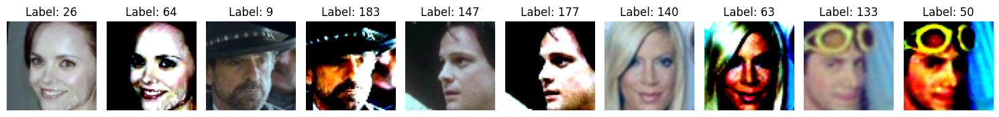

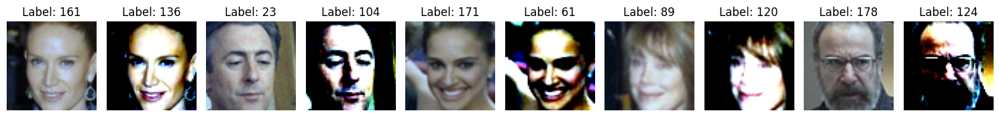

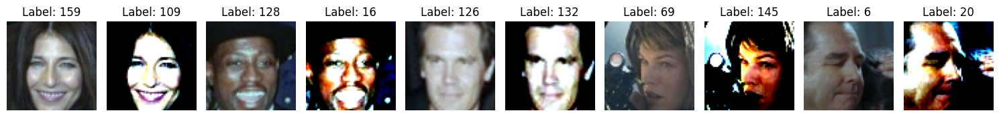

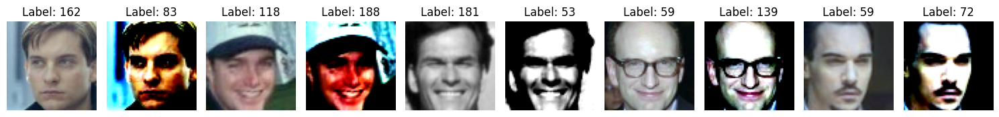

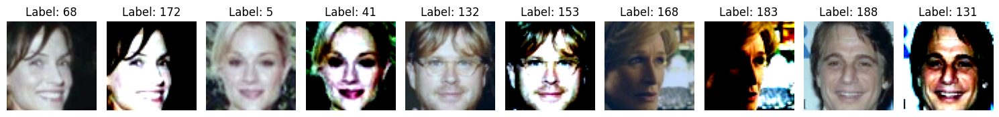

In [ ]:
# Loop over batches of 10 images
for i in range(5):
    # Reset the list for each batch
    images_to_plot = []

    # Loop through 10 images in the current batch
    for j in range(5):
      for k in range(2):
        if k == 0:
          image_to_plot = scale_image(TestingImages[i*10 + j])  # Scale the image
        else:
          image_to_plot = TestingImages[i*10 + j]
        images_to_plot.append(image_to_plot)  # Append the scaled image to the list

    # Plot the batch of images with corresponding labels
    plot_samples(images_to_plot, TestingLabels[i*10 : (i+1)*10], 10)  # Slice labels for current batch


# Building encoder-decoder multilayer neural networks

## Vanilla Autoencoder

### Latent space = 128, layers = 4

In [ ]:
Vanilla_Bottle_Neck = 128  # Example value, you can adjust it as needed
Vanilla_batch_size = 16
Vanilla_epochs = 50

In [ ]:
#The model structure is defines sequentially and TensorFlow automatically keeps track of lyers as we add them
# Input Layer
Vanilla_input_layer = tf.keras.Input(shape=(image_shape * image_shape * 3,))

# Encoder
Vanilla_encoded_1 = tf.keras.layers.Dense(512, activation='linear')(Vanilla_input_layer) #We pass the output of the previous layer an argument
#Vanilla_encoded_1 = LeakyReLU(alpha=0.01)(Vanilla_encoded_1)
Vanilla_encoded_2 = tf.keras.layers.Dense(256, activation='linear')(Vanilla_encoded_1)
#Vanilla_encoded_2 = LeakyReLU(alpha=0.01)(Vanilla_encoded_2)
Vanilla_latent_space = tf.keras.layers.Dense(Vanilla_Bottle_Neck, activation='linear')(Vanilla_encoded_2)  # Latent space
#Vanilla_latent_space = LeakyReLU(alpha=0.01)(Vanilla_latent_space)

# Decoder
Vanilla_decoded_1 = tf.keras.layers.Dense(256, activation='linear')(Vanilla_latent_space)
#Vanilla_decoded_1 = LeakyReLU(alpha=0.01)(Vanilla_decoded_1)
Vanilla_decoded_2 = tf.keras.layers.Dense(512, activation='linear')(Vanilla_decoded_1)
#Vanilla_decoded_2 = LeakyReLU(alpha=0.01)(Vanilla_decoded_2)
Vanilla_output_layer = tf.keras.layers.Dense(image_shape * image_shape * 3, activation='linear')(Vanilla_decoded_2)

#Encoder
Vanilla_encoder = tf.keras.Model(inputs=Vanilla_input_layer, outputs=Vanilla_latent_space)
#Decoder
Vanilla_decoder = tf.keras.Model(inputs=Vanilla_latent_space, outputs=Vanilla_output_layer)

# Autoencoder Model
Vanilla_autoencoder = tf.keras.Model(inputs=Vanilla_input_layer, outputs=Vanilla_output_layer)
Vanilla_autoencoder.compile(optimizer='adam', loss='mse')


Vanilla_encoder.summary()
Vanilla_decoder.summary()
Vanilla_autoencoder.summary()

Model: "functional_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_16 (InputLayer)          │ (None, 12288)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_90 (Dense)                     │ (None, 512)                 │       6,291,968 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_91 (Dense)                     │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_92 (Dense)                     │ (None, 128)                 │          32,896 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,456,192 (24.63 MB)

 Trainable params: 6,456,192 (24.63 MB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ keras_tensor_119CLONE (InputLayer)   │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_93 (Dense)                     │ (None, 256)                 │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_94 (Dense)                     │ (None, 512)                 │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_95 (Dense)                     │ (None, 12288)               │       6,303,744 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,468,352 (24.67 MB)

 Trainable params: 6,468,352 (24.67 MB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_16 (InputLayer)          │ (None, 12288)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_90 (Dense)                     │ (None, 512)                 │       6,291,968 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_91 (Dense)                     │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_92 (Dense)                     │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_93 (Dense)                     │ (None, 256)                 │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_94 (Dense)                     │ (None, 512)                 │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_95 (Dense)                     │ (None, 12288)               │       6,303,744 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,924,544 (49.30 MB)

 Trainable params: 12,924,544 (49.30 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Early Stopping Callback
Vanilla_early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',  # Monitor validation loss
    patience=10,          # Stop after 5 epochs of no improvement
    restore_best_weights=True,  # Restore weights from the best epoch
    verbose=1            # Print early stopping message
)

# Training Vanilla Autoencoder
print("Training Vanilla Autoencoder...")
Vanilla_history = Vanilla_autoencoder.fit(
    TrainingImages_flat,
    TrainingImages_flat,  # Autoencoder tries to reconstruct the input image
    epochs=Vanilla_epochs,
    batch_size=Vanilla_batch_size,
    validation_data=(ValidationImages_flat, ValidationImages_flat),
    callbacks=[Vanilla_early_stopping]  # Add the early stopping callback
)


Training Vanilla Autoencoder...
Epoch 1/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - loss: 0.5017 - val_loss: 0.1601
Epoch 2/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - loss: 0.1560 - val_loss: 0.1606
Epoch 3/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 0.1676 - val_loss: 0.1487
Epoch 4/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - loss: 0.1546 - val_loss: 0.1450
Epoch 5/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 0.1504 - val_loss: 0.1714
Epoch 6/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 0.1572 - val_loss: 0.1569
Epoch 7/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - loss: 0.1597 - val_loss: 0.1488
Epoch 8/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 0.1465 - val_loss: 0.1473
Epoch 9/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 0.1492 - val_loss: 0.1375
Epoch 10/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - loss: 0.1409 - val_loss: 0.1469
Epoch 11/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 0.1430 - val_loss: 0.1416
Epoch 12/50
887/887 

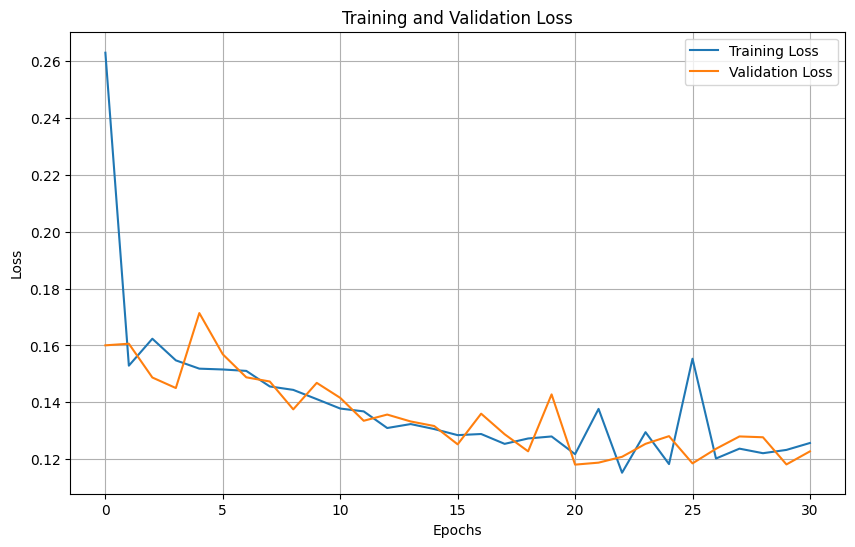

In [ ]:
# Plot the loss after each epoch
plt.figure(figsize=(10, 6))
plt.plot(Vanilla_history.history['loss'], label='Training Loss')
plt.plot(Vanilla_history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


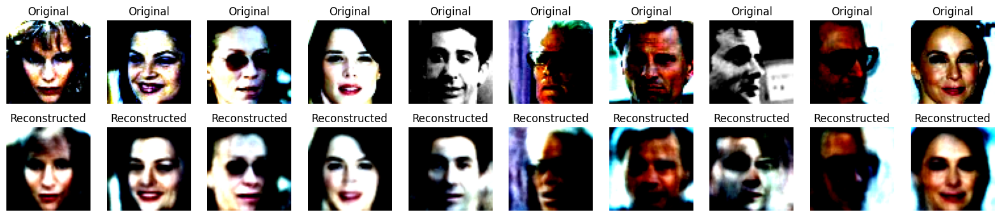

In [ ]:
# Select a few images to visualize
num_images = 10  # Number of images to display
sample_images = ValidationImages_flat[:num_images]  # Take a sample from your validation set

# Get the reconstructed images from the autoencoder
reconstructed_images = Vanilla_autoencoder.predict(sample_images)

# Function to plot original and reconstructed images
def plot_images(original, reconstructed, n=10):
    plt.figure(figsize=(20, 4))

    for i in range(n):
        # Original images
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(original[i].reshape(image_shape, image_shape, 3))  # Reshape according to your image dimensions
        plt.title("Original")
        plt.axis("off")

        # Reconstructed images
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(reconstructed[i].reshape(image_shape, image_shape, 3))  # Reshape according to your image dimensions
        plt.title("Reconstructed")
        plt.axis("off")

    plt.show()

# Call the function to plot the images
plot_images(sample_images, reconstructed_images)

### Latent space = 128, layers = 2

In [ ]:
Vanilla_Bottle_Neck = 128  # Example value, you can adjust it as needed
Vanilla_batch_size = 16
Vanilla_epochs = 50

In [ ]:
# Input Layer
Vanilla_input_layer = tf.keras.Input(shape=(image_shape * image_shape * 3,))

# Encoder
Vanilla_encoded_1 = tf.keras.layers.Dense(Vanilla_Bottle_Neck*2, activation='linear')(Vanilla_input_layer) #We pass the output of the previous layer an argument
#Vanilla_encoded_1 = LeakyReLU(alpha=0.01)(Vanilla_encoded_1)

Vanilla_latent_space = tf.keras.layers.Dense(Vanilla_Bottle_Neck, activation='linear')(Vanilla_encoded_1)  # Latent space
#Vanilla_latent_space = LeakyReLU(alpha=0.01)(Vanilla_latent_space)

# Decoder
Vanilla_decoded_1 = tf.keras.layers.Dense(Vanilla_Bottle_Neck*2, activation='linear')(Vanilla_latent_space)
#Vanilla_decoded_1 = LeakyReLU(alpha=0.01)(Vanilla_decoded_1)

Vanilla_output_layer = tf.keras.layers.Dense(image_shape * image_shape * 3, activation='linear')(Vanilla_decoded_1)

#Encoder
Vanilla_encoder = tf.keras.Model(inputs=Vanilla_input_layer, outputs=Vanilla_latent_space)
#Decoder
Vanilla_decoder = tf.keras.Model(inputs=Vanilla_latent_space, outputs=Vanilla_output_layer)

# Autoencoder Model
Vanilla_autoencoder = tf.keras.Model(inputs=Vanilla_input_layer, outputs=Vanilla_output_layer)
Vanilla_autoencoder.compile(optimizer='adam', loss='mse')


Vanilla_encoder.summary()
Vanilla_decoder.summary()
Vanilla_autoencoder.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 12288)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │       3,145,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 128)                 │          32,896 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,178,880 (12.13 MB)

 Trainable params: 3,178,880 (12.13 MB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ keras_tensor_2CLONE (InputLayer)     │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 12288)               │       3,158,016 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,191,040 (12.17 MB)

 Trainable params: 3,191,040 (12.17 MB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 12288)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │       3,145,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 12288)               │       3,158,016 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,369,920 (24.30 MB)

 Trainable params: 6,369,920 (24.30 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Early Stopping Callback
Vanilla_early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',  # Monitor validation loss
    patience=10,          # Stop after 5 epochs of no improvement
    restore_best_weights=True,  # Restore weights from the best epoch
    verbose=1            # Print early stopping message
)

# Training Vanilla Autoencoder
print("Training Vanilla Autoencoder...")
Vanilla_history = Vanilla_autoencoder.fit(
    TrainingImages_flat,
    TrainingImages_flat,  # Autoencoder tries to reconstruct the input image
    epochs=Vanilla_epochs,
    batch_size=Vanilla_batch_size,
    validation_data=(ValidationImages_flat, ValidationImages_flat),
    callbacks=[Vanilla_early_stopping]  # Add the early stopping callback
)


Training Vanilla Autoencoder...
Epoch 1/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 0.4009 - val_loss: 0.1585
Epoch 2/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 0.1508 - val_loss: 0.1555
Epoch 3/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.1404 - val_loss: 0.1419
Epoch 4/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 0.1413 - val_loss: 0.1383
Epoch 5/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.1372 - val_loss: 0.1428
Epoch 6/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.1339 - val_loss: 0.1378
Epoch 7/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.1319 - val_loss: 0.1338
Epoch 8/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.1289 - val_loss: 0.1310
Epoch 9/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.1278 - val_loss: 0.1298
Epoch 10/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.1271 - val_loss: 0.1257
Epoch 11/50
887/887 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - loss: 0.1259 - val_loss: 0.1264
Epoch 12/50
887/887 

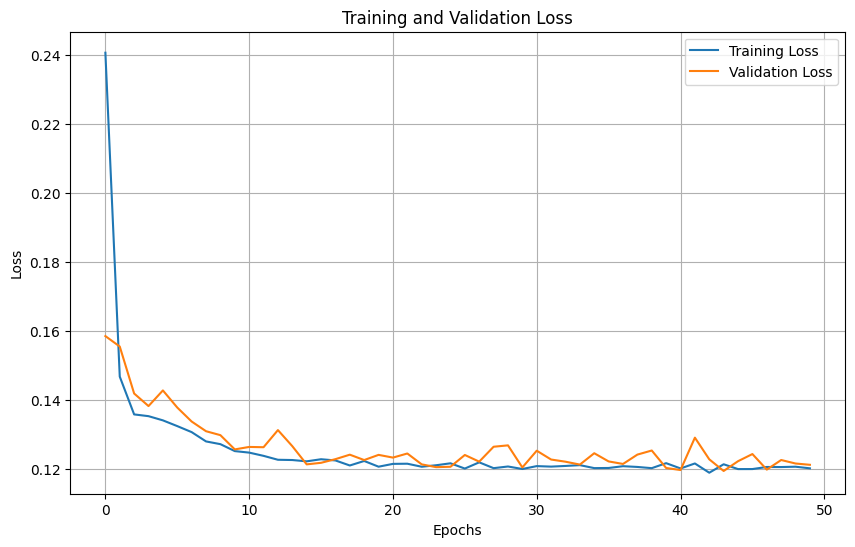

In [ ]:
# Plot the loss after each epoch
plt.figure(figsize=(10, 6))
plt.plot(Vanilla_history.history['loss'], label='Training Loss')
plt.plot(Vanilla_history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


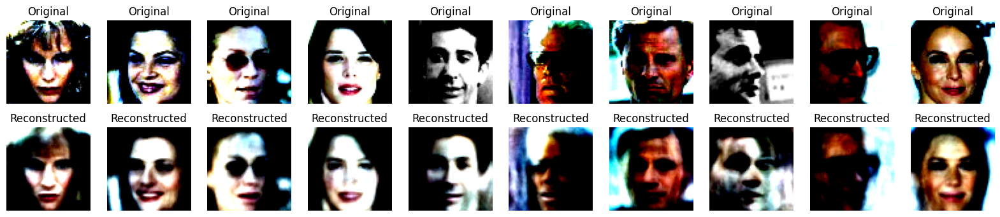

In [ ]:
# Select a few images to visualize
num_images = 10  # Number of images to display
sample_images = ValidationImages_flat[:num_images]  # Take a sample from your validation set

# Get the reconstructed images from the autoencoder
reconstructed_images = Vanilla_autoencoder.predict(sample_images)

# Function to plot original and reconstructed images
def plot_images(original, reconstructed, n=10):
    plt.figure(figsize=(20, 4))

    for i in range(n):
        # Original images
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(original[i].reshape(image_shape, image_shape, 3))  # Reshape according to your image dimensions
        plt.title("Original")
        plt.axis("off")

        # Reconstructed images
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(reconstructed[i].reshape(image_shape, image_shape, 3))  # Reshape according to your image dimensions
        plt.title("Reconstructed")
        plt.axis("off")

    plt.show()

# Call the function to plot the images
plot_images(sample_images, reconstructed_images)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


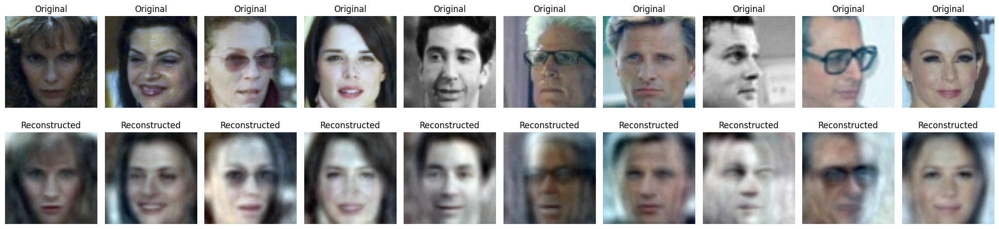

In [ ]:
# Select a few images to visualize
num_images = 10  # Number of images to display
sample_images = ValidationImages_flat[:num_images]  # Take a sample from your validation set

# Get the reconstructed images from the autoencoder
reconstructed_images = Vanilla_autoencoder.predict(sample_images)

# Plot original and reconstructed images
fig, axes = plt.subplots(2, num_images, figsize=(20, 5))

for i in range(num_images):
    # Original images
    original = scale_image(sample_images[i].reshape(image_shape, image_shape, 3))  # Scale the original image
    axes[0, i].imshow(original)
    axes[0, i].axis('off')
    axes[0, i].set_title("Original")

    # Reconstructed images
    reconstructed = scale_image(reconstructed_images[i].reshape(image_shape, image_shape, 3))  # Scale the reconstructed image
    axes[1, i].imshow(reconstructed)
    axes[1, i].axis('off')
    axes[1, i].set_title("Reconstructed")

plt.tight_layout()
plt.show()

## Variational Autoencoder (VAE)

In [ ]:
# Define parameters
latent_dim = 32
layer_nodes = [512, 256, 128, 64]

In [ ]:
# Reparameterization trick
def sampling(args):
    z_mean, z_log_var = args
    epsilon = tf.keras.backend.random_normal(shape=(tf.keras.backend.shape(z_mean)[0], latent_dim), mean=0., stddev=1.0)
    return z_mean + tf.keras.backend.exp(0.5 * z_log_var) * epsilon


class VAELossLayer(tf.keras.layers.Layer):
    def call(self, inputs):
        input_img, decoded, z_mean, z_log_var = inputs
        input_flat = tf.keras.layers.Flatten()(input_img)
        decoded_flat = tf.keras.layers.Flatten()(decoded)
        reconstruction_loss = tf.reduce_mean(tf.square(input_flat - decoded_flat), axis=-1)
        kl_weight = 0.1
        kl_loss = kl_weight * (-0.5 * tf.reduce_mean(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var), axis=-1))
        total_loss = reconstruction_loss + kl_loss
        self.add_loss(total_loss)
        return decoded

# Function to create VAE model
def create_vae_model(latent_dim, layer_nodes):

    # Encoder
    VAE_input_layer = tf.keras.Input(shape=(image_shape, image_shape, 3), name="encoder_input")
    x = tf.keras.layers.Flatten()(VAE_input_layer)
    for nodes in layer_nodes:
      if nodes > 0:
        x = tf.keras.layers.Dense(nodes, activation='relu', kernel_initializer='he_normal')(x)
    z_mean = tf.keras.layers.Dense(latent_dim, name="z_mean")(x)
    z_log_var = tf.keras.layers.Dense(latent_dim, name="z_log_var")(x)
    z = tf.keras.layers.Lambda(sampling, name="z")([z_mean, z_log_var])

    # Decoder
    VAE_latent_inputs = tf.keras.Input(shape=(latent_dim,), name="z_sampling")
    x = tf.keras.layers.Dense(layer_nodes[-1], activation='relu', kernel_initializer='he_normal')(VAE_latent_inputs)
    for nodes in reversed(layer_nodes[:-1]):
        if nodes > 0:
            x = tf.keras.layers.Dense(nodes, activation='relu', kernel_initializer='he_normal')(x)

    x = tf.keras.layers.Dense(image_shape * image_shape * 3, activation='linear')(x)
    decoded = tf.keras.layers.Reshape((image_shape, image_shape, 3))(x)

    # VAE Model
    VAE_encoder = tf.keras.Model(VAE_input_layer, [z_mean, z_log_var, z], name="encoder")
    VAE_decoder = tf.keras.Model(VAE_latent_inputs, decoded, name="decoder")
    VAE_outputs = VAE_decoder(VAE_encoder(VAE_input_layer)[2])  # Use the z (latent space) from encoder
    VAE_outputs = VAELossLayer()([VAE_input_layer, VAE_outputs, z_mean, z_log_var])
    VAE_autoencoder = tf.keras.Model(VAE_input_layer, VAE_outputs, name="vae")
    VAE_autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001, clipvalue=1.0), metrics=[])

    return VAE_autoencoder, VAE_encoder

In [ ]:
# Create the VAE model
VAE_autoencoder, VAE_encoder = create_vae_model(latent_dim, layer_nodes)

# Summary
VAE_autoencoder.summary()

Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ encoder_input             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_22 (Flatten)      │ (None, 12288)          │              0 │ encoder_input[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_18 (Dense)          │ (None, 512)            │      6,291,968 │ flatten_22[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_19 (Dense)          │ (None, 256)            │        131,328 │ dense_18[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_20 (Dense)          │ (None, 128)            │         32,896 │ dense_19[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 32), (None,    │      6,468,608 │ encoder_input[0][0]    │
│                           │ 32), (None, 32)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_21 (Dense)          │ (None, 64)             │          8,256 │ dense_20[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 64, 64, 3)      │      6,478,784 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 32)             │          2,080 │ dense_21[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 32)             │          2,080 │ dense_21[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vae_loss_layer_2          │ (None, 64, 64, 3)      │              0 │ encoder_input[0][0],   │
│ (VAELossLayer)            │                        │                │ decoder[0][0],         │
│                           │                        │                │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 12,947,392 (49.39 MB)

 Trainable params: 12,947,392 (49.39 MB)

 Non-trainable params: 0 (0.00 B)

### Trial 1 "Batch size = 64"


In [ ]:
# Early Stopping Callback
VAE_early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',  # Monitor validation loss
    patience=5,          # Stop after 5 epochs of no improvement
    restore_best_weights=True,  # Restore weights from the best epoch
    verbose=1            # Print early stopping message
)

# Train the VAE
VAE_History = VAE_autoencoder.fit(
                        TrainingImages, TrainingImages,
                        epochs=500,
                        batch_size=64 ,
                        validation_data=(ValidationImages, ValidationImages),
                        callbacks=[VAE_early_stopping],
                        verbose=1
                     )

Epoch 1/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step - loss: 54.1664 - val_loss: 41.5220
Epoch 2/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 41.0137 - val_loss: 36.6717
Epoch 3/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 36.3158 - val_loss: 34.2609
Epoch 4/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 33.8816 - val_loss: 32.9346
Epoch 5/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 32.7526 - val_loss: 32.0612
Epoch 6/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 32.0133 - val_loss: 31.4250
Epoch 7/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 31.3321 - val_loss: 31.0623
Epoch 8/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 30.8333 - val_loss: 30.7409
Epoch 9/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 30.6399 - val_loss: 30.2365
Epoch 10/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 30.2240 - val_loss: 29.8778
Epoch 11/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 29.5022 - val_loss: 29.5281
Epoch 12/500
2

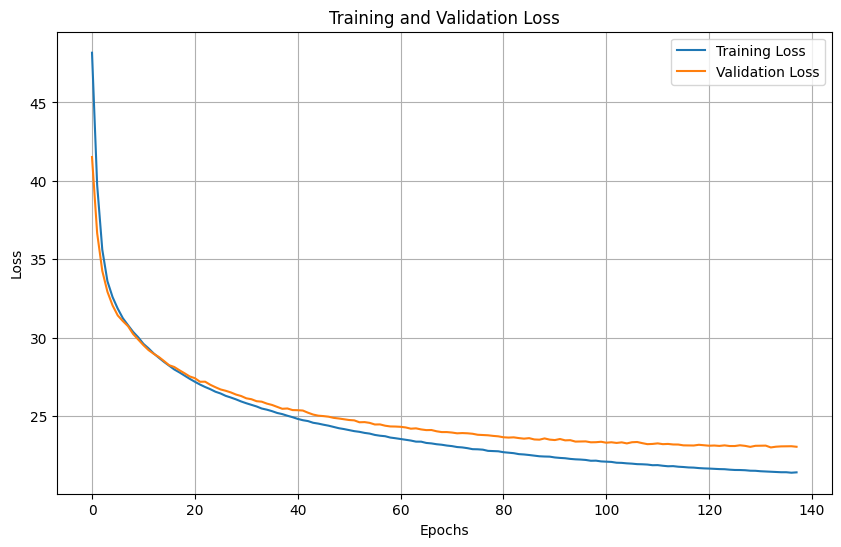

In [ ]:
# Plot the loss after each epoch
plt.figure(figsize=(10, 6))
plt.plot(VAE_History.history['loss'], label='Training Loss')
plt.plot(VAE_History.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


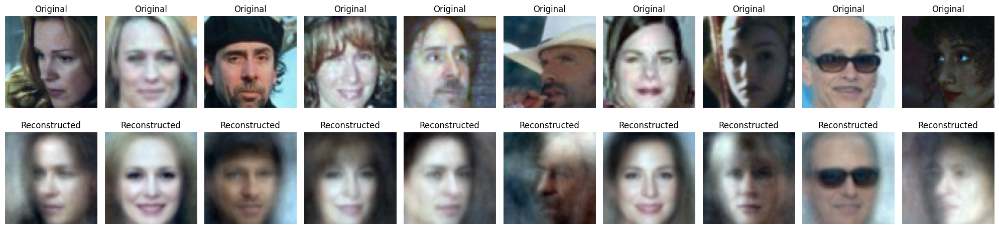

In [ ]:
# Select a few test images
num_images = 10  # Number of images to visualize
test_images = TrainingImages[:num_images]

# Get reconstructed images
reconstructed_images = VAE_autoencoder.predict(test_images)

# Plot original and reconstructed images
fig, axes = plt.subplots(2, num_images, figsize=(20, 5))

for i in range(num_images):
    # Original images
    original = scale_image(test_images[i])  # Scale the original image
    axes[0, i].imshow(original)
    axes[0, i].axis('off')
    axes[0, i].set_title("Original")

    # Reconstructed images
    reconstructed = scale_image(reconstructed_images[i])  # Scale the reconstructed image
    axes[1, i].imshow(reconstructed)
    axes[1, i].axis('off')
    axes[1, i].set_title("Reconstructed")

plt.tight_layout()
plt.show()

### Trial 2 "Batch Size = 32"


In [ ]:
# Early Stopping Callback
VAE_early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',  # Monitor validation loss
    patience=3,          # Stop after 5 epochs of no improvement
    restore_best_weights=True,  # Restore weights from the best epoch
    verbose=1            # Print early stopping message
)

# Train the VAE
VAE_History = VAE_autoencoder.fit(
                        TrainingImages, TrainingImages,
                        epochs=500,
                        batch_size=32 ,
                        validation_data=(ValidationImages, ValidationImages),
                        callbacks=[VAE_early_stopping],
                        verbose=1
                     )

Epoch 1/500
444/444 ━━━━━━━━━━━━━━━━━━━━ 14s 19ms/step - loss: 25.6827 - val_loss: 19.1984
Epoch 2/500
444/444 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 18.5516 - val_loss: 17.2957
Epoch 3/500
444/444 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 17.0832 - val_loss: 16.5500
Epoch 4/500
444/444 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 16.4342 - val_loss: 16.1860
Epoch 5/500
444/444 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 16.0301 - val_loss: 15.8001
Epoch 6/500
444/444 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 15.6892 - val_loss: 15.5880
Epoch 7/500
444/444 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 15.5533 - val_loss: 15.4091
Epoch 8/500
444/444 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 15.2992 - val_loss: 15.2412
Epoch 9/500
444/444 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 15.1166 - val_loss: 15.0374
Epoch 10/500
444/444 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 14.8973 - val_loss: 14.8784
Epoch 11/500
444/444 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 14.7229 - val_loss: 14.7177
Epoch 12/500
444/

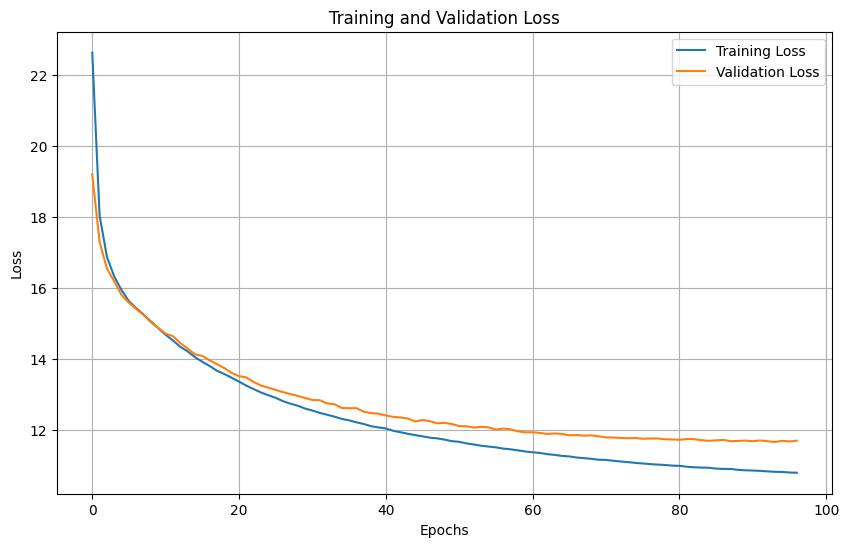

In [ ]:
# Plot the loss after each epoch
plt.figure(figsize=(10, 6))
plt.plot(VAE_History.history['loss'], label='Training Loss')
plt.plot(VAE_History.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


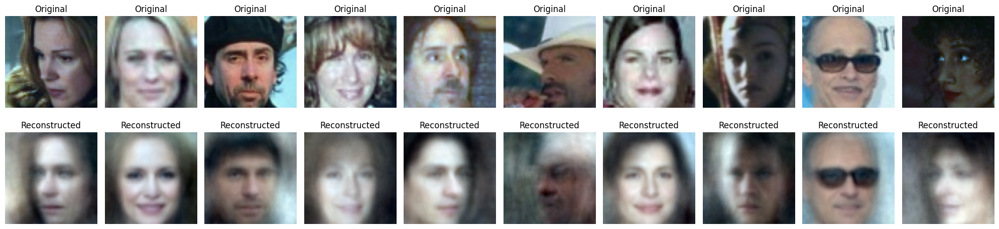

In [ ]:
# Select a few test images
num_images = 10  # Number of images to visualize
test_images = TrainingImages[:num_images]  # Replace with your test data

# Get reconstructed images
reconstructed_images = VAE_autoencoder.predict(test_images)

# Plot original and reconstructed images
fig, axes = plt.subplots(2, num_images, figsize=(20, 5))

for i in range(num_images):
    # Original images
    original = scale_image(test_images[i])  # Scale the original image
    axes[0, i].imshow(original)
    axes[0, i].axis('off')
    axes[0, i].set_title("Original")

    # Reconstructed images
    reconstructed = scale_image(reconstructed_images[i])  # Scale the reconstructed image
    axes[1, i].imshow(reconstructed)
    axes[1, i].axis('off')
    axes[1, i].set_title("Reconstructed")

plt.tight_layout()
plt.show()

### Visualizing Latent Space

95/95 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


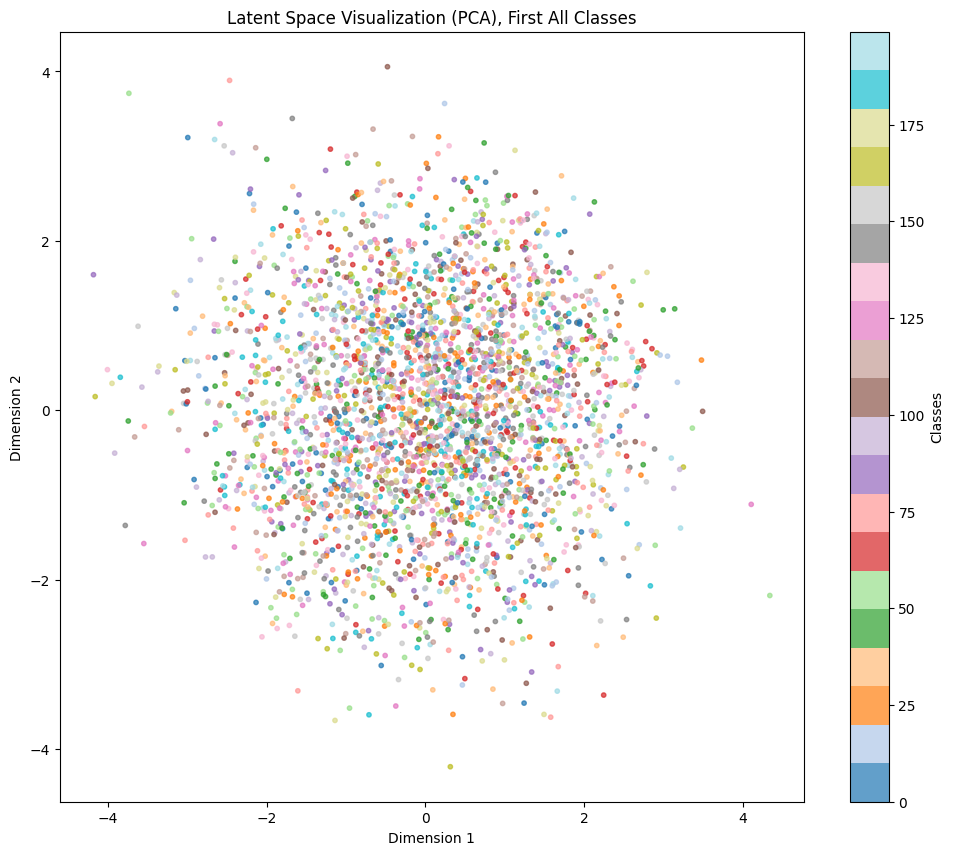

In [ ]:
visualize_latent_space(VAE_encoder, TestingImages, TestingLabels, method="pca", num_classes=None, sample_fraction=1.0)

95/95 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


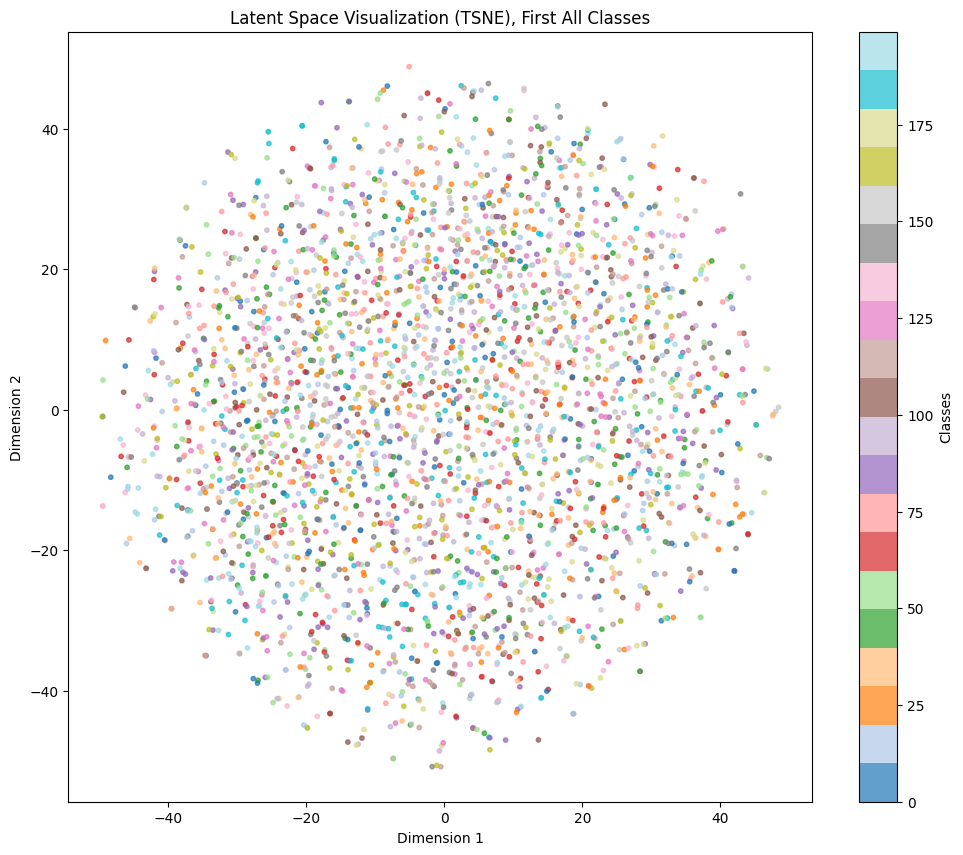

In [ ]:
visualize_latent_space(VAE_encoder, TestingImages, TestingLabels, method="tsne", num_classes=None, sample_fraction=1.0)

## Convolutional Autoencoder (CAE)

In [ ]:
CAE_Bottle_Neck = 64
CAE_batch_size = 64
CAE_epochs = 500

In [ ]:
# Input layer for flattened images with size 64*64*3
CAE_input = tf.keras.Input(shape=(64,64,3))

# Encoder
CAE_encoded_1 = Conv2D(32, (3, 3), activation='elu', padding='same')(CAE_input)
#32: nb of kernels, (3,3): their size, padding (same: value = 0 but preserves dimensions , valid: no padding therefor has a smaller output), strides = (1,1) by default
CAE_encoded_1 = MaxPooling2D((2, 2), padding='same')(CAE_encoded_1)
#(2,2): pooling window size

CAE_encoded_2 = Conv2D(64, (3, 3), activation='elu', padding='same')(CAE_encoded_1)
CAE_encoded_2 = MaxPooling2D((2, 2), padding='same')(CAE_encoded_2)

# Latent space (bottleneck layer)
CAE_latent = Conv2D(16, (3, 3), activation='elu', padding='same')(CAE_encoded_2)  # Adjust latent space size as needed


# Decoder
CAE_decoded_1 = Conv2D(64, (3, 3), activation='elu', padding='same')(CAE_latent)
CAE_decoded_1 = UpSampling2D((2, 2))(CAE_decoded_1)

CAE_decoded_2 = Conv2D(32, (3, 3), activation='elu', padding='same')(CAE_decoded_1)
CAE_decoded_2 = UpSampling2D((2, 2))(CAE_decoded_2)

# Output layer
CAE_output = Conv2D(3, (3, 3), activation='linear', padding='same')(CAE_decoded_2) # Sigmoid for image reconstruction

#Encoder
CAE_encoder= tf.keras.Model(inputs=CAE_input, outputs=CAE_latent)
#Decoder
CAE_decoder = tf.keras.Model(inputs=CAE_latent, outputs=CAE_output)
# Autoencoder
CAE_autoencoder = tf.keras.Model(inputs=CAE_input, outputs=CAE_output)

# Compile the CAE model
CAE_autoencoder.compile(optimizer='adam', loss='mse')  # Binary crossentropy for image reconstruction

CAE_encoder.summary()
CAE_decoder.summary()
CAE_autoencoder.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 64, 64, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 16)          │           9,232 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28,624 (111.81 KB)

 Trainable params: 28,624 (111.81 KB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ keras_tensor_5CLONE (InputLayer)     │ (None, 16, 16, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 16, 16, 64)          │           9,280 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d (UpSampling2D)         │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 32, 32, 32)          │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d_1 (UpSampling2D)       │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 64, 64, 3)           │             867 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28,611 (111.76 KB)

 Trainable params: 28,611 (111.76 KB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 64, 64, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 16)          │           9,232 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 16, 16, 64)          │           9,280 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d (UpSampling2D)         │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 32, 32, 32)          │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d_1 (UpSampling2D)       │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 64, 64, 3)           │             867 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 57,235 (223.57 KB)

 Trainable params: 57,235 (223.57 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
CAE_early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',  # Monitor validation loss
    patience=5,          # Stop after 5 epochs of no improvement
    restore_best_weights=True,  # Restore weights from the best epoch
    verbose=1            # Print early stopping message
)

# Training CAE Autoencoder
print("Training CAE Autoencoder...")
CAE_history = CAE_autoencoder.fit(
    TrainingImages,
    TrainingImages,  # Autoencoder tries to reconstruct the input image
    epochs=CAE_epochs,
    batch_size=CAE_batch_size,
    validation_data=(ValidationImages, ValidationImages),
    callbacks=[CAE_early_stopping],  # Add the early stopping callback
)

# Check weights after training
CAE_autoencoder_inital_weights = CAE_autoencoder.get_weights()
CAE_encoder_initial_weights = CAE_encoder.get_weights()
CAE_decoder_initial_weights = CAE_decoder.get_weights()

Training CAE Autoencoder...
Epoch 1/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.1922 - val_loss: 0.0538
Epoch 2/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 11s 17ms/step - loss: 0.0482 - val_loss: 0.0401
Epoch 3/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.0378 - val_loss: 0.0348
Epoch 4/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - loss: 0.0334 - val_loss: 0.0319
Epoch 5/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 0.0309 - val_loss: 0.0299
Epoch 6/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.0288 - val_loss: 0.0281
Epoch 7/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - loss: 0.0271 - val_loss: 0.0263
Epoch 8/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0259 - val_loss: 0.0265
Epoch 9/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0244 - val_loss: 0.0236
Epoch 10/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - loss: 0.0233 - val_loss: 0.0230
Epoch 11/500
222/222 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.0221 - val_loss: 0.0217


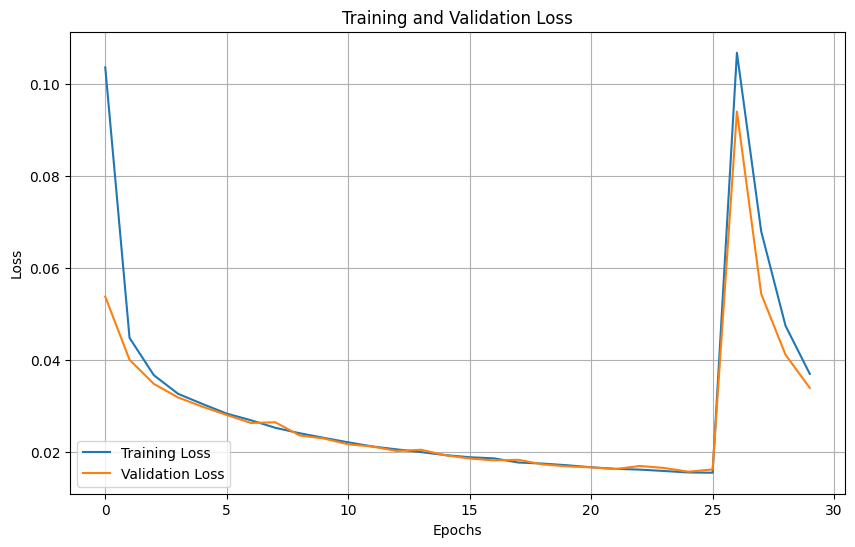

In [ ]:
# Plot the loss after each epoch
plt.figure(figsize=(10, 6))
plt.plot(CAE_history.history['loss'], label='Training Loss')
plt.plot(CAE_history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 668ms/step


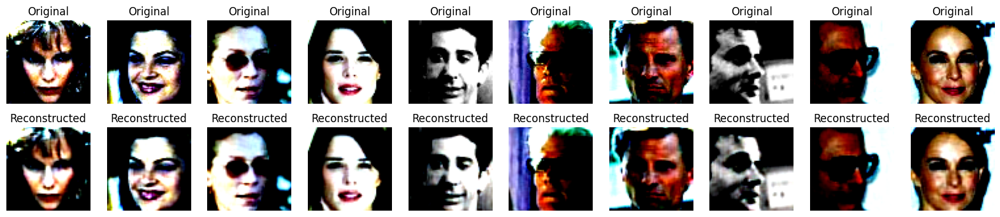

In [ ]:
# Select a few images to visualize
num_images = 10  # Number of images to display
sample_images = ValidationImages[:num_images]  # Take a sample from your validation set

# Get the reconstructed images from the autoencoder
reconstructed_images = CAE_autoencoder.predict(sample_images)

# Function to plot original and reconstructed images
def plot_images(original, reconstructed, n=10):
    plt.figure(figsize=(20, 4))

    for i in range(n):
        # Original images
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(original[i].reshape(image_shape, image_shape, 3))  # Reshape according to your image dimensions
        plt.title("Original")
        plt.axis("off")

        # Reconstructed images
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(reconstructed[i].reshape(image_shape, image_shape, 3))  # Reshape according to your image dimensions
        plt.title("Reconstructed")
        plt.axis("off")

    plt.show()

# Call the function to plot the images
plot_images(sample_images, reconstructed_images)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


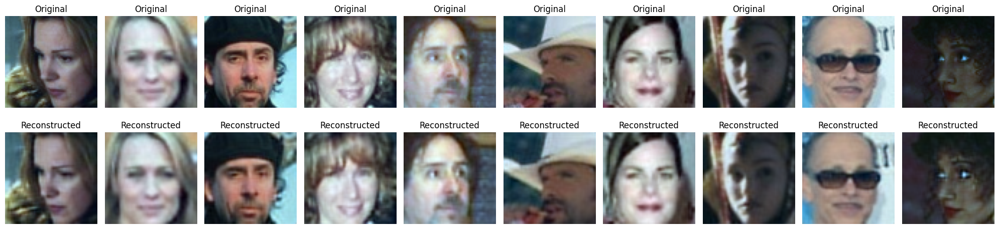

In [ ]:
# Select a few test images
num_images = 10  # Number of images to visualize
test_images = TrainingImages[:num_images]  # Replace with your test data

# Get reconstructed images
reconstructed_images = CAE_autoencoder.predict(test_images)

# Plot original and reconstructed images
fig, axes = plt.subplots(2, num_images, figsize=(20, 5))

for i in range(num_images):
    # Original images
    original = scale_image(test_images[i])  # Scale the original image
    axes[0, i].imshow(original)
    axes[0, i].axis('off')
    axes[0, i].set_title("Original")

    # Reconstructed images
    reconstructed = scale_image(reconstructed_images[i])  # Scale the reconstructed image
    axes[1, i].imshow(reconstructed)
    axes[1, i].axis('off')
    axes[1, i].set_title("Reconstructed")

plt.tight_layout()
plt.show()

# Cross Validation

## Vanilla AutoEncoder Cross Validation


In [ ]:
n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True)
Vanilla_Epochs = 50
Vanilla_Batches = 32
Vanilla_patience = 10


In [ ]:
def Vanilla_create_model(input_shape, latent_space_size, num_layers):
    model = Sequential()

    # Input Layer
    model.add(layers.Input(shape=(input_shape,)))  # Inp

    # Encoder
    for i in range(num_layers // 2, 0, -1):  # Loop from encoder_layers down to 1
        # Decrease neurons based on the BottleNeck
        # model.add(layers.Dense(latent_space_size * (2**i), activation='elu',kernel_regularizer=regularizers.l2(1e-5)))
          model.add(layers.Dense(latent_space_size * (2**i), activation='elu'))

    # Latent space
    # model.add(layers.Dense(latent_space_size, activation='elu',kernel_regularizer=regularizers.l2(1e-5)))  # Latent space layer
    model.add(layers.Dense(latent_space_size, activation='elu'))

    # Decoder
    for i in range(1, num_layers // 2 + 1):  # Loop from 1 to decoder_layers
        # Increase neurons after the bottleneck
        # model.add(layers.Dense(min(latent_space_size * (2**i),input_shape), activation='elu',kernel_regularizer=regularizers.l2(1e-5)))
        model.add(layers.Dense(min(latent_space_size * (2**i),input_shape), activation='elu'))

    # Output layer
    model.add(layers.Dense(input_shape, activation='linear'))  # Output layer, size of the input shape

    # Compile the model
    #Vanilla_optimizer = optimizers.Adam(learning_rate=0.001, clipvalue=1.0)
    model.compile(optimizer='adam', loss='mse')

    return model

In [ ]:
def Vanilla_cross_validate_model(X, latent_space_sizes, num_layers_options, k_folds=5):
    """
        X: Input data for training and validation.
        latent_space_sizes: List of latent space sizes to try.
        num_layers_options: List of numbers of layers to try.
        k_folds: Number of folds for cross-validation.
    Returns:
        dict: Dictionary containing the average validation loss for each hyperparameter combination.
    """
    results = {}
    kfold = KFold(n_splits=k_folds, shuffle=True, random_state=42)

    for latent_space_size in latent_space_sizes:
        for num_layers in num_layers_options:
            fold_losses = []
            all_train_losses = []
            all_val_losses = []

            print(f"Testing configuration: Latent Space = {latent_space_size}, Layers = {num_layers}")

            for fold, (train_index, val_index) in enumerate(kfold.split(X)):
                X_train, X_val = X[train_index], X[val_index]

                # Build the model
                model = Vanilla_create_model(
                    input_shape=X.shape[1],
                    latent_space_size=latent_space_size,
                    num_layers=num_layers
                )

                # Define early stopping callback
                Vanilla_early_stopping = tf.keras.callbacks.EarlyStopping(
                      monitor='val_loss',  # Monitor validation loss
                      patience=Vanilla_patience,          # Stop after specified nb of no improvement
                      restore_best_weights=True,  # Restore weights from the best epoch
                      verbose=1            # Print early stopping message
                  )

                # Train the model
                history = model.fit(
                    X_train, X_train,
                    epochs=Vanilla_Epochs,
                    batch_size=Vanilla_Batches,
                    validation_data=(X_val, X_val),
                    callbacks=[Vanilla_early_stopping],
                    verbose=1
                )

                # Record the validation loss for the last epoch
                fold_losses.append(history.history['val_loss'][-1])
                # Accumulate the training and validation losses
                all_train_losses.append(history.history['loss'])
                all_val_losses.append(history.history['val_loss'])


                # Plot training and validation loss for this fold
                plt.figure(figsize=(8, 5))
                plt.plot(history.history['loss'], label='Training Loss')
                plt.plot(history.history['val_loss'], label='Validation Loss')
                plt.title(f'Model Training - Fold {fold + 1}\nLatent Space = {latent_space_size}, Layers = {num_layers}')
                plt.xlabel('Epochs')
                plt.ylabel('Loss')
                plt.legend()
                plt.show()

            # Average the losses across folds
            avg_loss = np.nanmean(fold_losses)
            results[(latent_space_size, num_layers)] = avg_loss

            # Plot training and validation loss for all folds on the same graph
            plt.figure(figsize=(10, 6))
            for fold_idx in range(k_folds):
                plt.plot(all_train_losses[fold_idx], label=f'Fold {fold_idx + 1} - Training Loss', linestyle='--')
                plt.plot(all_val_losses[fold_idx], label=f'Fold {fold_idx + 1} - Validation Loss')
            plt.title(f'Model Training - Latent Space = {latent_space_size}, Layers = {num_layers}')
            plt.xlabel('Epochs')
            plt.ylabel('Loss')
            plt.legend()
            plt.show()

            print(f"Average Validation Loss: {avg_loss}")

    return results


Flattened training set: (14179, 12288), Labels: (14179,)
Testing configuration: Latent Space = 256, Layers = 8
Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step - loss: 1.1698 - val_loss: 0.3735
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.3592 - val_loss: 0.3142
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2992 - val_loss: 0.2947
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2743 - val_loss: 0.2736
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2640 - val_loss: 0.2691
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - loss: 0.2589 - val_loss: 0.2554
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2467 - val_loss: 0.2579
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2486 - val_loss: 0.2643
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2534 - val_loss: 0.2558
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2464 - val_loss: 0.2544
Epoch 11/50
2

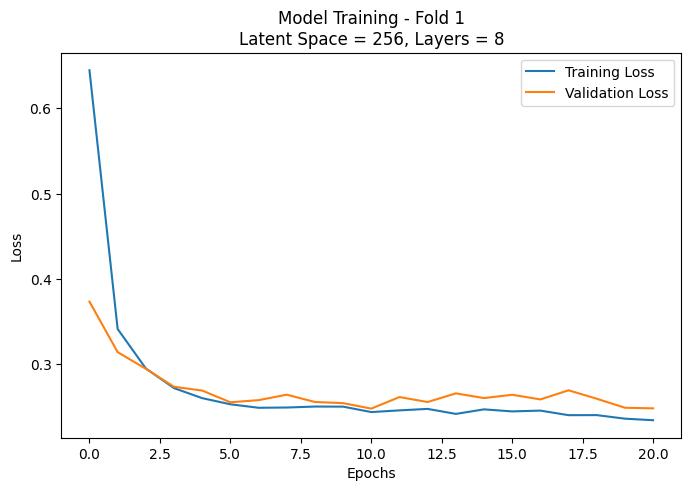

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 18s 51ms/step - loss: 1.0825 - val_loss: 0.4317
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.3761 - val_loss: 0.3273
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.3140 - val_loss: 0.3021
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2902 - val_loss: 0.2939
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2748 - val_loss: 0.2697
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2663 - val_loss: 0.2800
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2695 - val_loss: 0.2677
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2573 - val_loss: 0.2647
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2606 - val_loss: 0.2642
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2551 - val_loss: 0.2740
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2567 - val_loss: 0.2633
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━

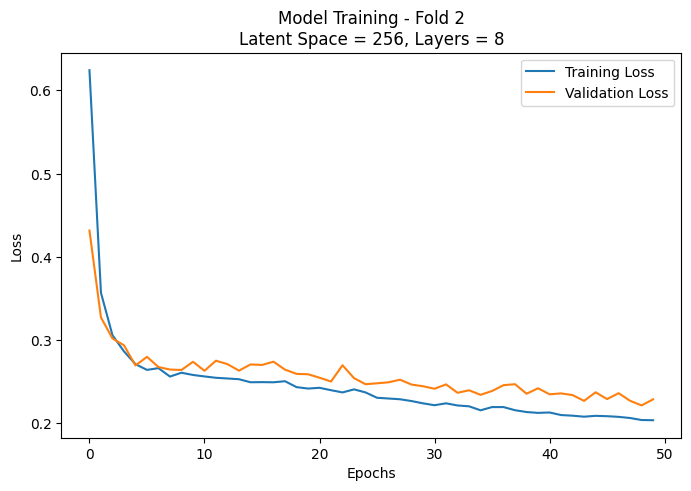

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.9958 - val_loss: 0.4040
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.3634 - val_loss: 0.3325
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.3104 - val_loss: 0.2985
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2887 - val_loss: 0.2838
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2700 - val_loss: 0.2817
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2662 - val_loss: 0.2723
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2685 - val_loss: 0.2750
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2615 - val_loss: 0.2719
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2597 - val_loss: 0.2716
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2599 - val_loss: 0.2718
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2534 - val_loss: 0.2789
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━

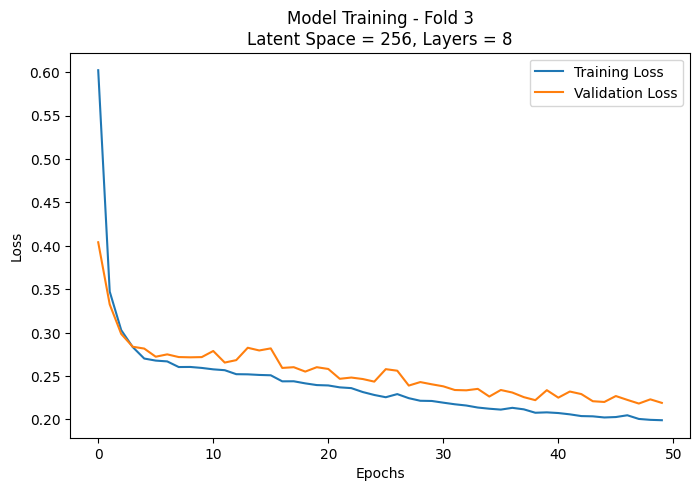

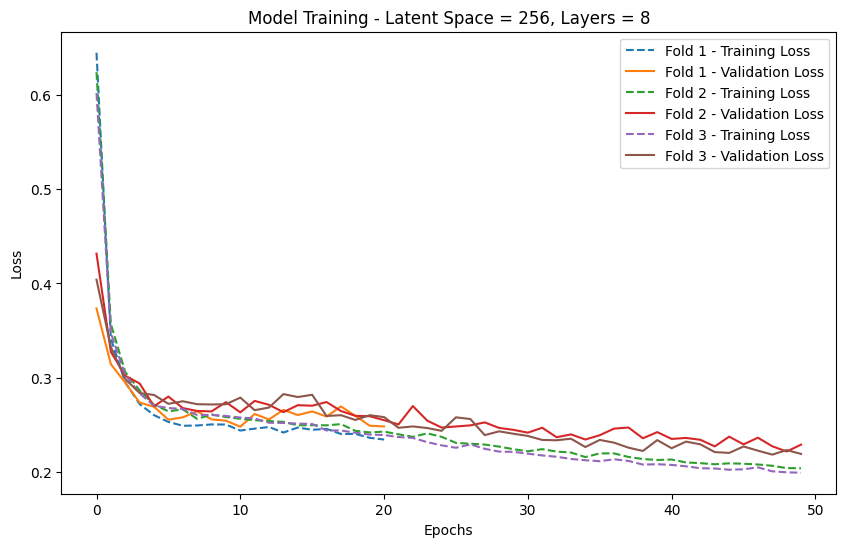

Average Validation Loss: 0.23211457828680673
Testing configuration: Latent Space = 256, Layers = 6
Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.5455 - val_loss: 0.3184
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - loss: 0.3041 - val_loss: 0.2897
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.2729 - val_loss: 0.2746
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.2609 - val_loss: 0.2858
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - loss: 0.2563 - val_loss: 0.2564
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.2383 - val_loss: 0.2450
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.2310 - val_loss: 0.2449
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - loss: 0.2246 - val_loss: 0.2353
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 16ms/step - loss: 0.2176 - val_loss: 0.2445
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.2196 - val_loss: 0.2337
Epoch 11/50
296/296 ━━━━━━━━

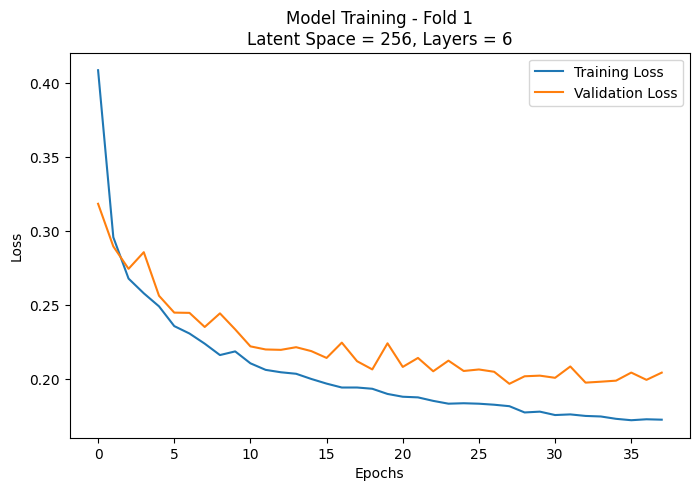

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.5335 - val_loss: 0.3304
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.3141 - val_loss: 0.2818
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 0.2753 - val_loss: 0.2703
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.2595 - val_loss: 0.2564
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - loss: 0.2504 - val_loss: 0.2565
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.2433 - val_loss: 0.2364
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.2266 - val_loss: 0.2414
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.2249 - val_loss: 0.2321
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.2191 - val_loss: 0.2313
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.2144 - val_loss: 0.2263
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.2133 - val_loss: 0.2259
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━

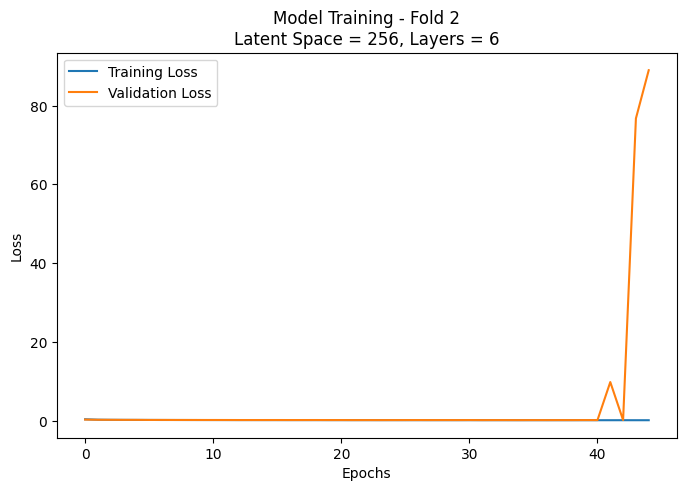

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.5247 - val_loss: 0.3323
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.3099 - val_loss: 0.2952
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.2787 - val_loss: 0.2744
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.2600 - val_loss: 0.2600
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.2467 - val_loss: 0.2551
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.2395 - val_loss: 0.2435
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.2342 - val_loss: 0.2505
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - loss: 0.2259 - val_loss: 0.2347
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.2166 - val_loss: 0.2315
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.2151 - val_loss: 0.2230
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.2102 - val_loss: 0.2274
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 

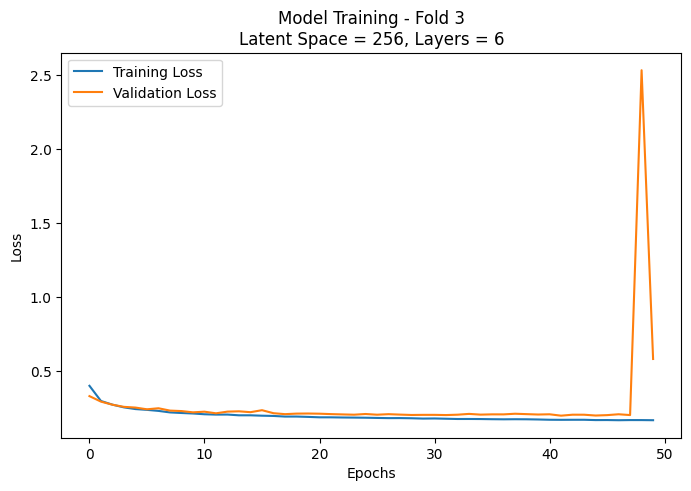

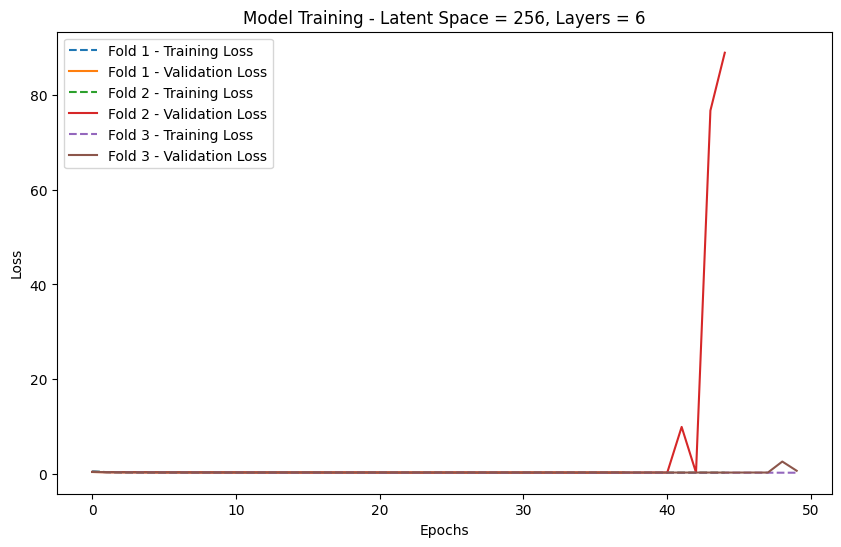

Average Validation Loss: 29.929143607616425
Testing configuration: Latent Space = 256, Layers = 4
Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 18ms/step - loss: 0.4587 - val_loss: 0.2851
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - loss: 0.2607 - val_loss: 0.2433
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 0.2289 - val_loss: 0.2318
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.2130 - val_loss: 0.2158
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.2033 - val_loss: 0.2109
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.1951 - val_loss: 0.2099
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.1920 - val_loss: 0.2032
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.1845 - val_loss: 0.2099
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.1862 - val_loss: 0.1967
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.1774 - val_loss: 0.1987
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━

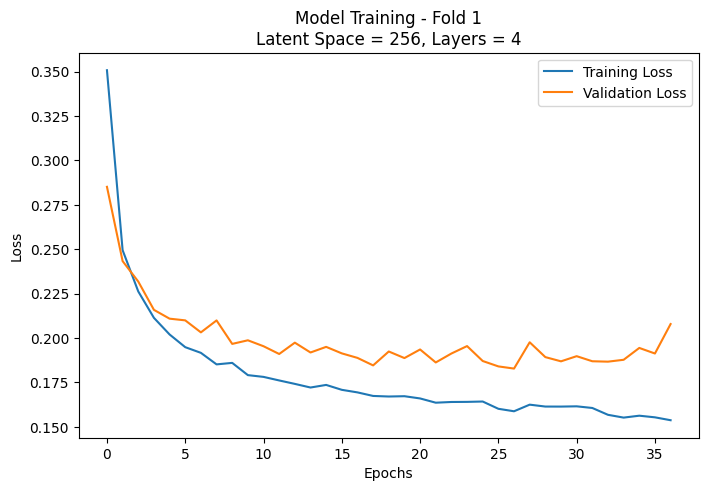

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.4599 - val_loss: 0.2875
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - loss: 0.2671 - val_loss: 0.2415
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.2339 - val_loss: 0.2324
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.2135 - val_loss: 0.2138
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.2032 - val_loss: 0.2187
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.1973 - val_loss: 0.2060
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.1902 - val_loss: 0.2021
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.1854 - val_loss: 0.1966
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.1795 - val_loss: 0.1979
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.1767 - val_loss: 0.1976
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.1775 - val_loss: 0.1877
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 9

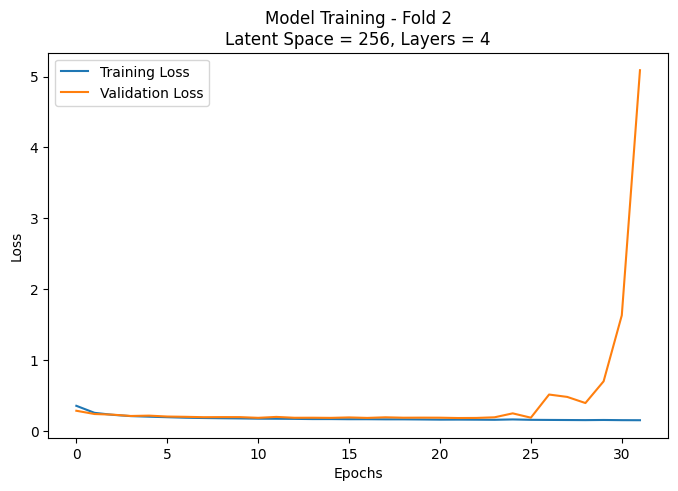

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - loss: 0.4603 - val_loss: 0.2779
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - loss: 0.2632 - val_loss: 0.2447
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.2306 - val_loss: 0.2335
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.2126 - val_loss: 0.2225
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.2040 - val_loss: 0.2071
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.1933 - val_loss: 0.2046
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.1890 - val_loss: 0.1960
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.1841 - val_loss: 0.1929
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.1786 - val_loss: 0.1892
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.1788 - val_loss: 0.1879
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.1717 - val_loss: 0.1860
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s

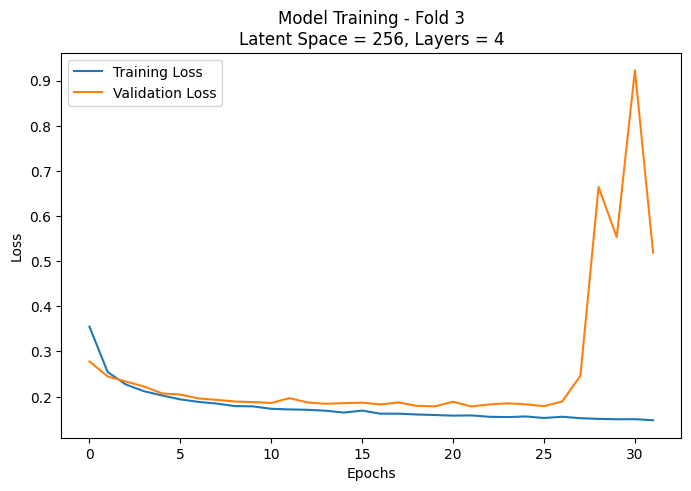

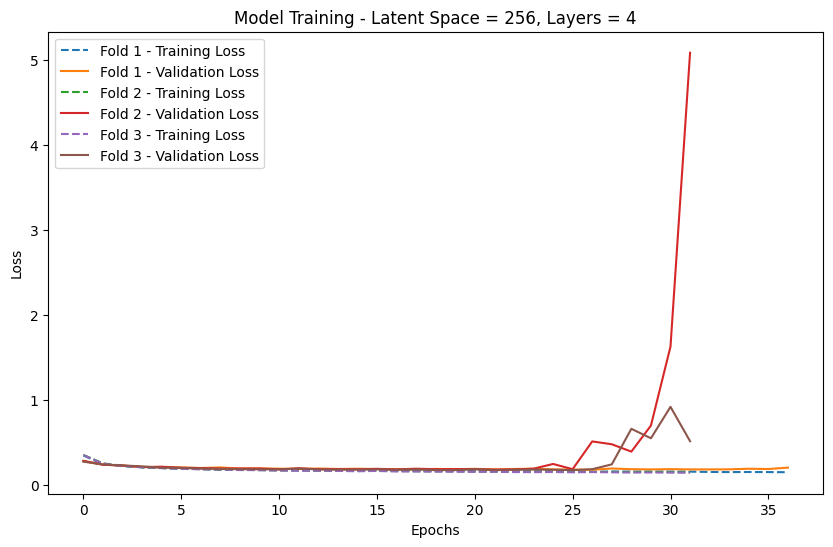

Average Validation Loss: 1.938335085908572
Testing configuration: Latent Space = 256, Layers = 2
Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - loss: 0.4427 - val_loss: 0.2615
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2353 - val_loss: 0.2195
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.2018 - val_loss: 0.1955
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.1833 - val_loss: 0.1874
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1764 - val_loss: 0.1854
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.1707 - val_loss: 0.1861
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.1692 - val_loss: 0.1792
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.1610 - val_loss: 0.1748
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.1595 - val_loss: 0.1710
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.1584 - val_loss: 0.1713
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 

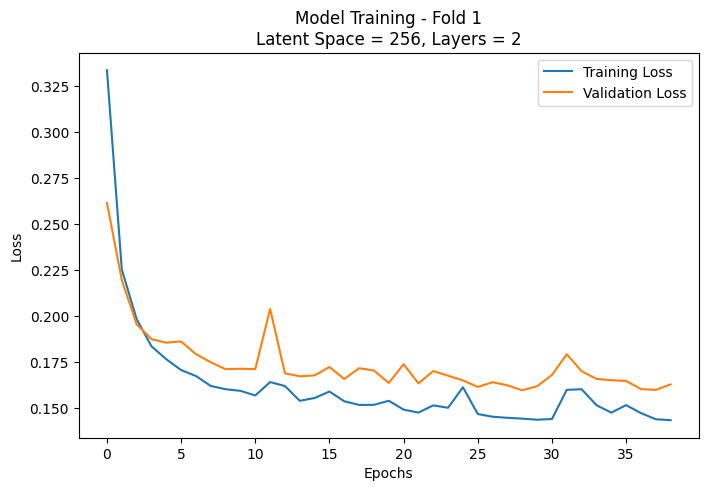

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - loss: 0.4487 - val_loss: 0.2477
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2381 - val_loss: 0.2134
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2024 - val_loss: 0.1996
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1869 - val_loss: 0.2014
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.1798 - val_loss: 0.1810
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.1717 - val_loss: 0.1768
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.1658 - val_loss: 0.1812
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.1677 - val_loss: 0.1756
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1609 - val_loss: 0.1706
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.1592 - val_loss: 0.1729
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.1582 - val_loss: 0.1774
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/ste

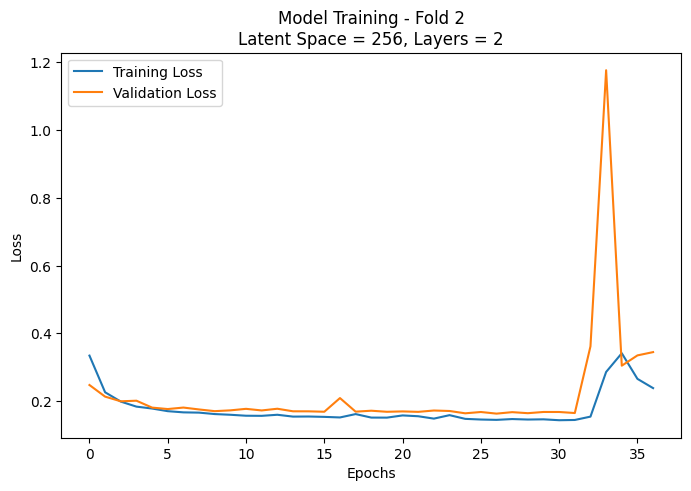

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - loss: 0.4448 - val_loss: 0.2527
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2312 - val_loss: 0.2159
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2039 - val_loss: 0.1960
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1849 - val_loss: 0.1860
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.1765 - val_loss: 0.1850
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.1744 - val_loss: 0.1870
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.1685 - val_loss: 0.1796
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1688 - val_loss: 0.1823
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.1649 - val_loss: 0.1786
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.1625 - val_loss: 0.1783
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.1606 - val_loss: 0.1797
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/ste

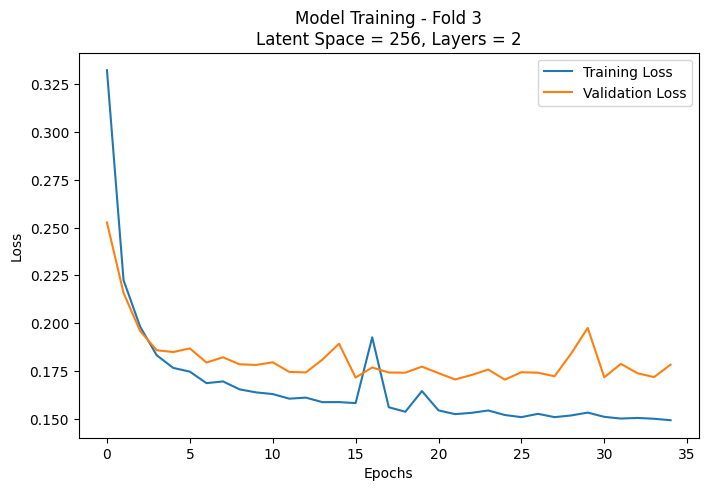

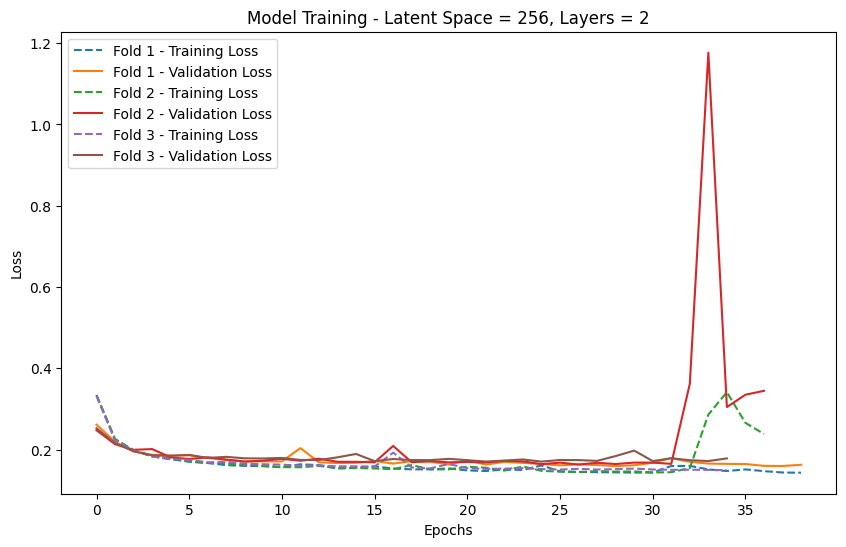

Average Validation Loss: 0.2286478728055954
Testing configuration: Latent Space = 128, Layers = 8
Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.5391 - val_loss: 0.3548
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - loss: 0.3433 - val_loss: 0.3301
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.3135 - val_loss: 0.2962
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - loss: 0.2922 - val_loss: 0.2849
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 0.2815 - val_loss: 0.2757
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - loss: 0.2687 - val_loss: 0.2750
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 16ms/step - loss: 0.2591 - val_loss: 0.2687
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - loss: 0.2531 - val_loss: 0.2643
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 0.2548 - val_loss: 0.2627
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - loss: 0.2454 - val_loss: 0.2505
Epoch 11/50
296/296 ━━━━━━━

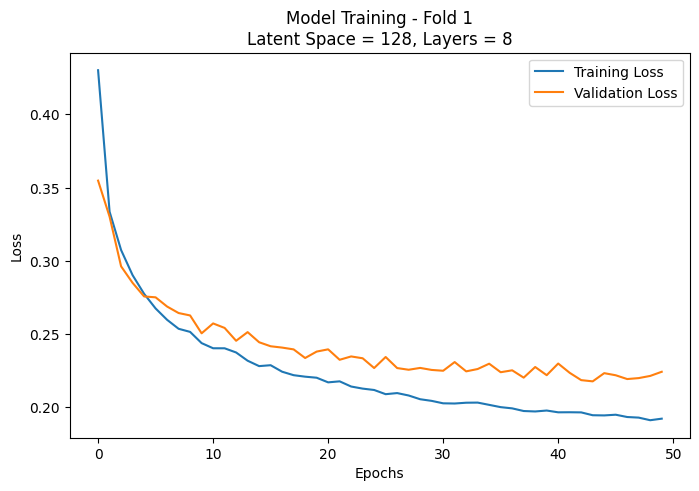

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.5415 - val_loss: 0.3567
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - loss: 0.3394 - val_loss: 0.3193
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.3126 - val_loss: 0.2967
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.2874 - val_loss: 0.2765
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - loss: 0.2721 - val_loss: 0.2648
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.2637 - val_loss: 0.2656
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - loss: 0.2551 - val_loss: 0.2517
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.2455 - val_loss: 0.2613
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 0.2454 - val_loss: 0.2512
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.2382 - val_loss: 0.2589
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.2366 - val_loss: 0.2468
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━

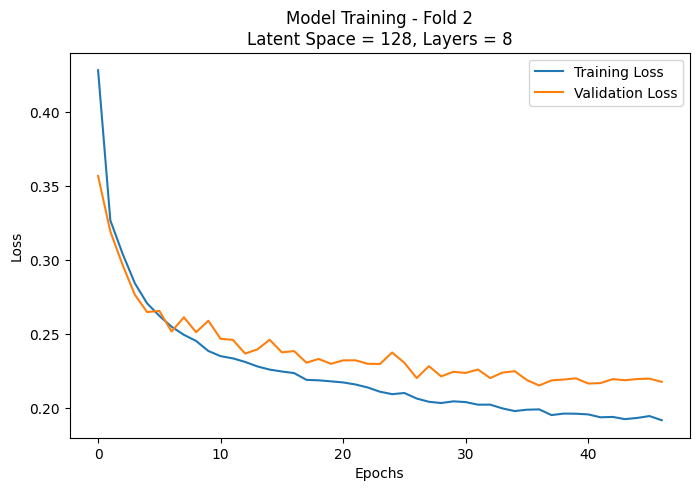

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.5386 - val_loss: 0.3658
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - loss: 0.3425 - val_loss: 0.3206
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.3094 - val_loss: 0.3021
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.2903 - val_loss: 0.2855
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.2787 - val_loss: 0.2746
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - loss: 0.2657 - val_loss: 0.2715
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 18ms/step - loss: 0.2597 - val_loss: 0.2599
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 16ms/step - loss: 0.2527 - val_loss: 0.2715
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.2479 - val_loss: 0.2697
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.2470 - val_loss: 0.2479
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.2354 - val_loss: 0.2467
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━

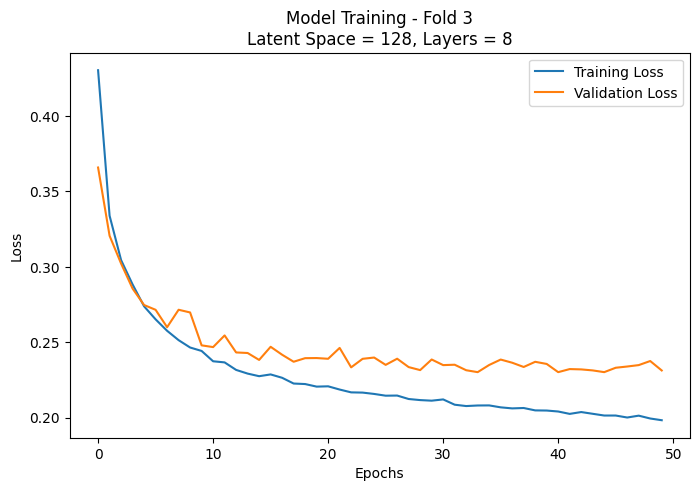

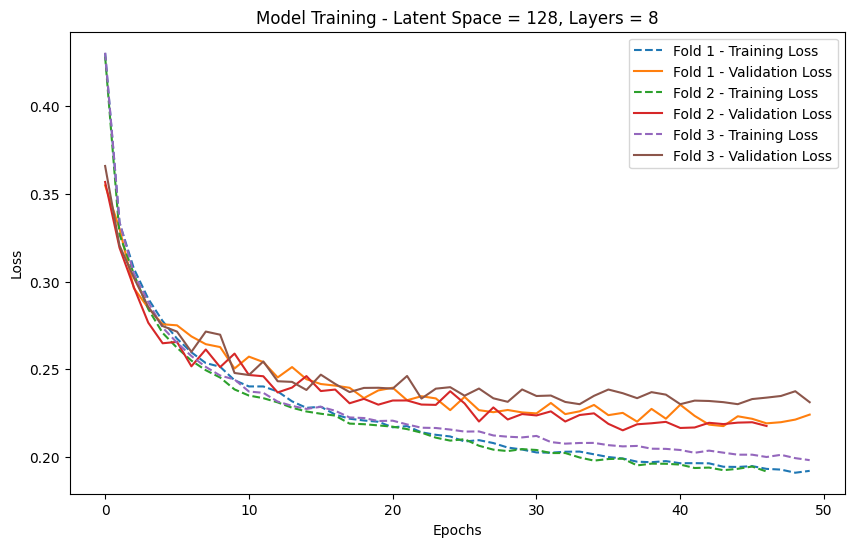

Average Validation Loss: 0.2243794103463491
Testing configuration: Latent Space = 128, Layers = 6
Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 18ms/step - loss: 0.4814 - val_loss: 0.3187
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 7s 11ms/step - loss: 0.2971 - val_loss: 0.2682
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 0.2582 - val_loss: 0.2521
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.2412 - val_loss: 0.2716
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - loss: 0.2337 - val_loss: 0.2366
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.2232 - val_loss: 0.2357
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.2177 - val_loss: 0.2279
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.2140 - val_loss: 0.2228
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.2108 - val_loss: 0.2203
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.2075 - val_loss: 0.2234
Epoch 11/50
296/296 ━━━━━━━━━━━

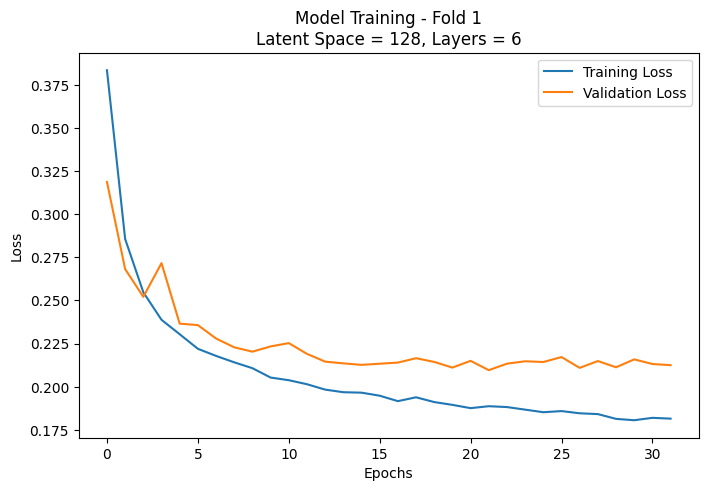

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.4855 - val_loss: 0.3182
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.2973 - val_loss: 0.2741
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.2608 - val_loss: 0.2545
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.2430 - val_loss: 0.2432
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.2300 - val_loss: 0.2381
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.2270 - val_loss: 0.2375
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.2204 - val_loss: 0.2281
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.2123 - val_loss: 0.2317
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - loss: 0.2123 - val_loss: 0.2190
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.2037 - val_loss: 0.2175
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - loss: 0.2033 - val_loss: 0.2145
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 

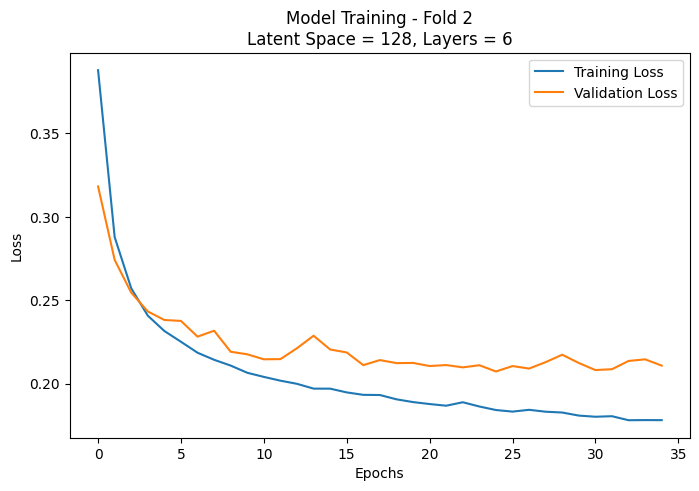

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.4791 - val_loss: 0.3137
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.2895 - val_loss: 0.2804
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 0.2587 - val_loss: 0.2485
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.2401 - val_loss: 0.2445
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.2318 - val_loss: 0.2353
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.2230 - val_loss: 0.2365
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.2188 - val_loss: 0.2351
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.2163 - val_loss: 0.2326
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.2121 - val_loss: 0.2344
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.2105 - val_loss: 0.2299
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.2083 - val_loss: 0.2240
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3

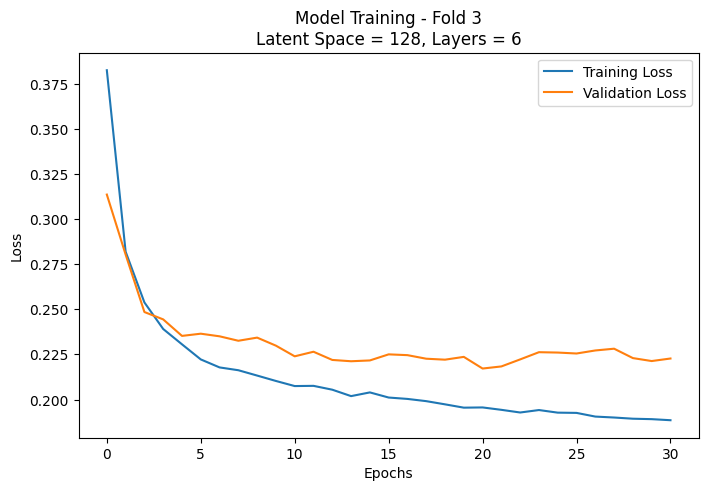

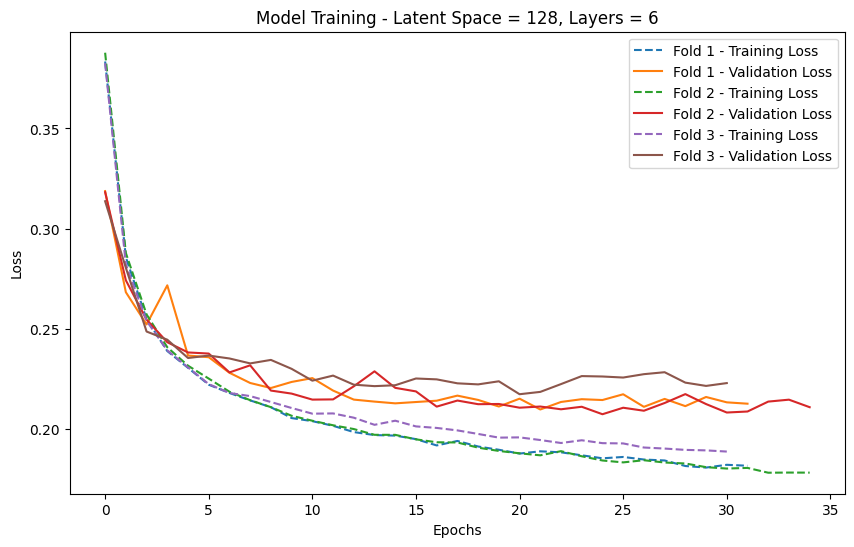

Average Validation Loss: 0.2153279980023702
Testing configuration: Latent Space = 128, Layers = 4
Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - loss: 0.4564 - val_loss: 0.2828
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2603 - val_loss: 0.2406
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.2293 - val_loss: 0.2247
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2113 - val_loss: 0.2146
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2008 - val_loss: 0.2068
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.1919 - val_loss: 0.2016
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 0.1888 - val_loss: 0.2055
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.1850 - val_loss: 0.1977
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.1816 - val_loss: 0.1995
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1793 - val_loss: 0.1932
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━

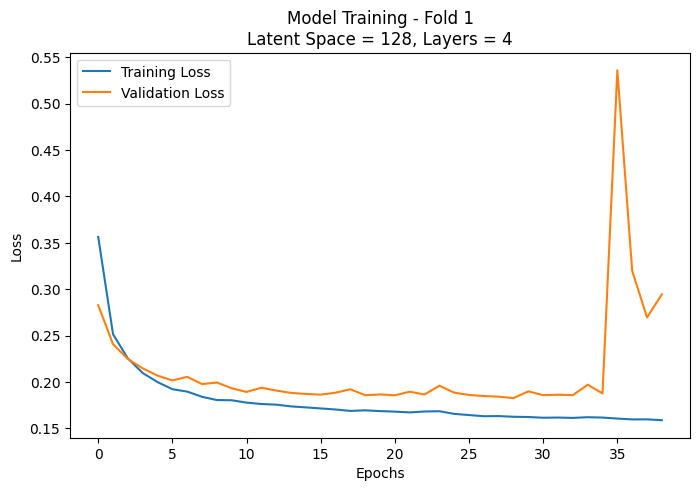

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - loss: 0.4561 - val_loss: 0.2769
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2612 - val_loss: 0.2343
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2254 - val_loss: 0.2185
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.2082 - val_loss: 0.2103
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2002 - val_loss: 0.2014
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.1908 - val_loss: 0.1985
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1883 - val_loss: 0.1939
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.1824 - val_loss: 0.1953
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1805 - val_loss: 0.1955
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.1777 - val_loss: 0.1882
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.1739 - val_loss: 0.1881
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/ste

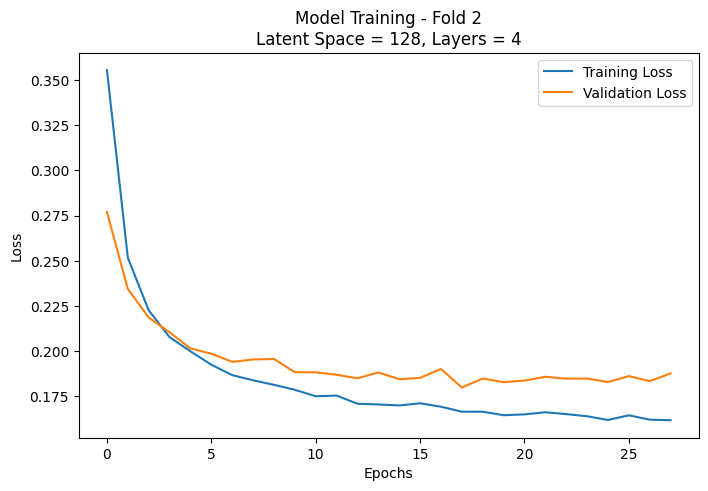

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - loss: 0.4598 - val_loss: 0.2780
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.2631 - val_loss: 0.2378
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2289 - val_loss: 0.2231
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2105 - val_loss: 0.2159
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2008 - val_loss: 0.2085
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.1936 - val_loss: 0.2131
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.1942 - val_loss: 0.2023
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.1888 - val_loss: 0.1995
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 0.1834 - val_loss: 0.1981
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.1821 - val_loss: 0.1993
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.1811 - val_loss: 0.2032
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/ste

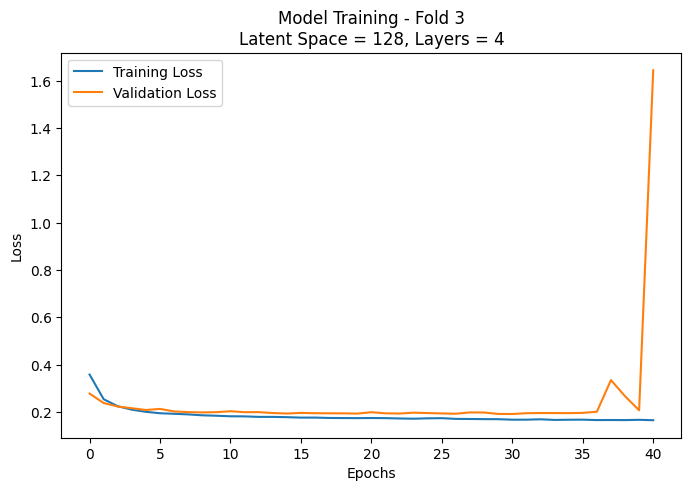

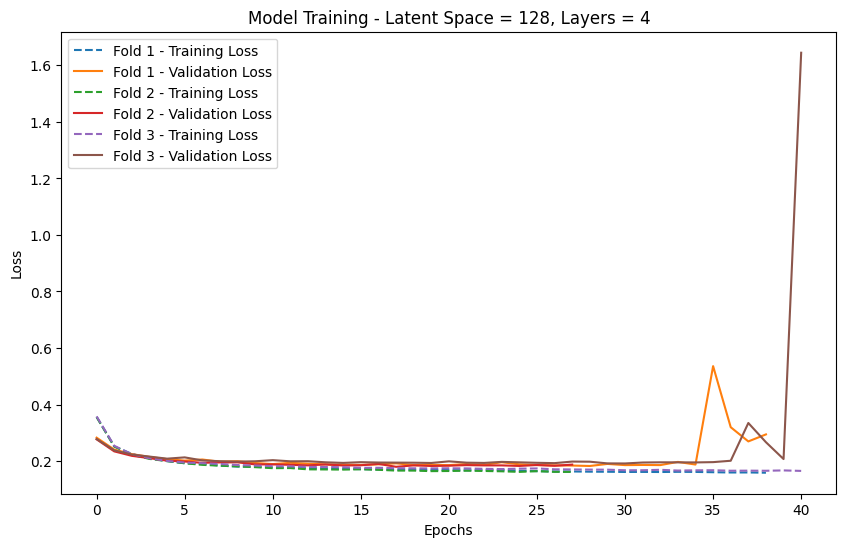

Average Validation Loss: 0.7088254789511362
Testing configuration: Latent Space = 128, Layers = 2
Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - loss: 0.4599 - val_loss: 0.2679
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2483 - val_loss: 0.2270
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2173 - val_loss: 0.2150
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.2060 - val_loss: 0.2040
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.1947 - val_loss: 0.2006
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.1900 - val_loss: 0.1979
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.1880 - val_loss: 0.1924
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.1846 - val_loss: 0.1916
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.1813 - val_loss: 0.1909
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.1824 - val_loss: 0.1926
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━

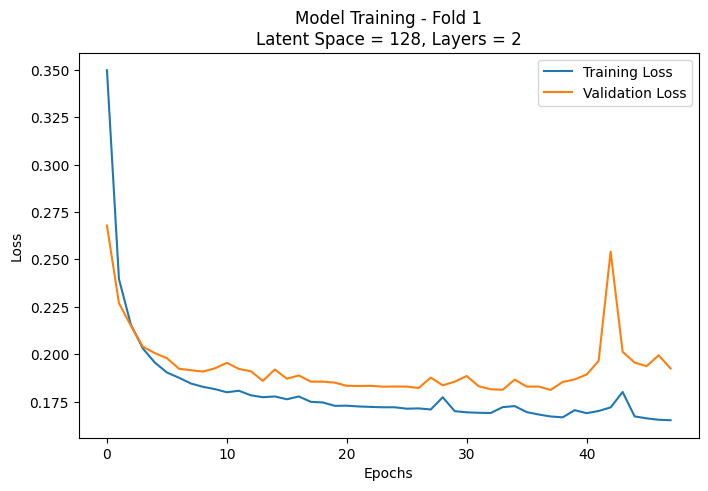

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - loss: 0.4637 - val_loss: 0.2658
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.2541 - val_loss: 0.2348
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.2209 - val_loss: 0.2193
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2106 - val_loss: 0.2150
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.2046 - val_loss: 0.2102
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.2010 - val_loss: 0.2034
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.1957 - val_loss: 0.2057
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.1932 - val_loss: 0.2028
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.1930 - val_loss: 0.2048
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.1925 - val_loss: 0.2027
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.1887 - val_loss: 0.1993
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/ste

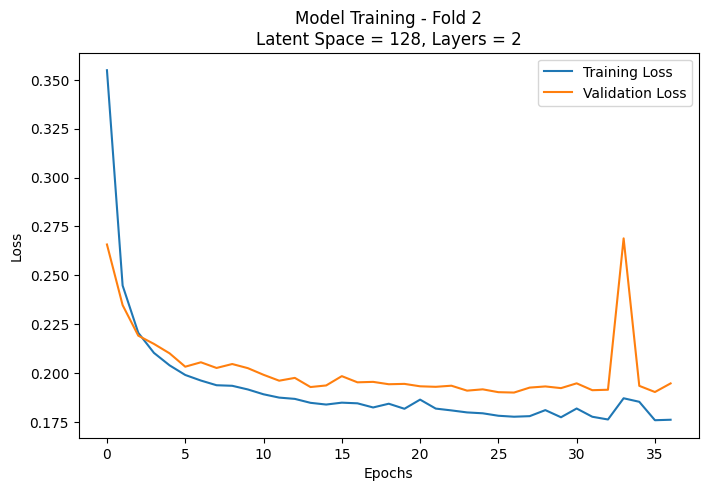

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - loss: 0.4600 - val_loss: 0.2640
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2519 - val_loss: 0.2295
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2164 - val_loss: 0.2163
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2022 - val_loss: 0.2074
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.1974 - val_loss: 0.1956
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.1889 - val_loss: 0.1960
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.1852 - val_loss: 0.2012
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.1852 - val_loss: 0.1917
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.1807 - val_loss: 0.1899
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.1783 - val_loss: 0.1919
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.1789 - val_loss: 0.1870
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/ste

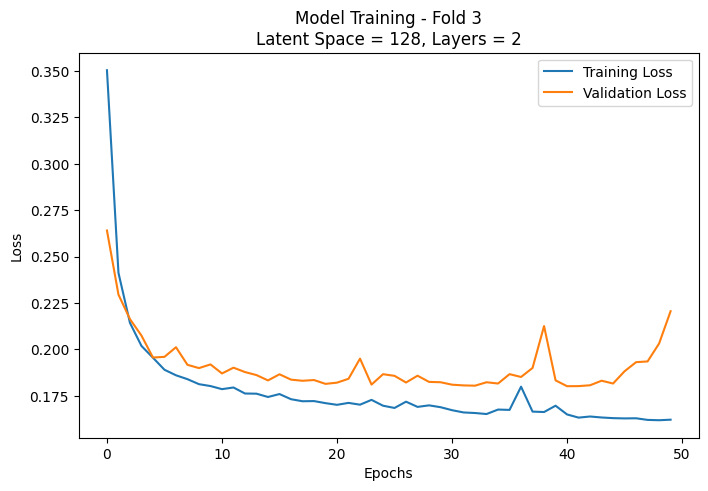

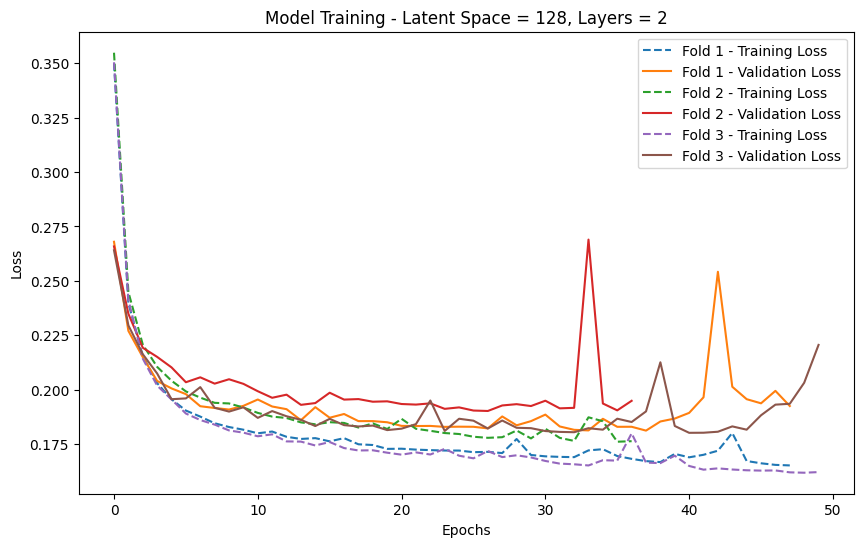

Average Validation Loss: 0.2026366045077642


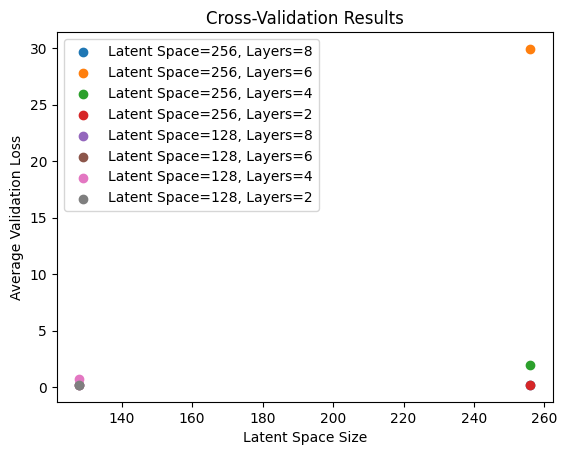

In [ ]:
latent_space_sizes = [256,128]
num_layers_options = [8, 6, 4, 2]
k_folds = 3

# Ensuring it's a numpy array and properly shaped
TrainingImages_flat = np.array(TrainingImages_flat)
print(f"Flattened training set: {TrainingImages_flat.shape}, Labels: {TrainingLabels.shape}")

results = Vanilla_cross_validate_model(
    TrainingImages_flat,
    latent_space_sizes=latent_space_sizes,
    num_layers_options=num_layers_options,
    k_folds=k_folds
)

for config, loss in results.items():
    plt.scatter(config[0], loss, label=f"Latent Space={config[0]}, Layers={config[1]}")
plt.xlabel("Latent Space Size")
plt.ylabel("Average Validation Loss")
plt.legend()
plt.title("Cross-Validation Results")
plt.show()

In [ ]:
# Print the results for each configuration
for config, loss in results.items():
    print(f"Configuration: Latent Space={config[0]}, Layers={config[1]}")
    print(f"  Average Validation Loss: {loss:.4f}")

Configuration: Latent Space=256, Layers=8
  Average Validation Loss: 0.2321
Configuration: Latent Space=256, Layers=6
  Average Validation Loss: 29.9291
Configuration: Latent Space=256, Layers=4
  Average Validation Loss: 1.9383
Configuration: Latent Space=256, Layers=2
  Average Validation Loss: 0.2286
Configuration: Latent Space=128, Layers=8
  Average Validation Loss: 0.2244
Configuration: Latent Space=128, Layers=6
  Average Validation Loss: 0.2153
Configuration: Latent Space=128, Layers=4
  Average Validation Loss: 0.7088
Configuration: Latent Space=128, Layers=2
  Average Validation Loss: 0.2026


Flattened training set: (14179, 12288), Labels: (14179,)
Testing configuration: Latent Space = 64, Layers = 8
Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.5156 - val_loss: 0.3411
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.3270 - val_loss: 0.3048
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - loss: 0.2936 - val_loss: 0.2889
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.2822 - val_loss: 0.2804
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.2656 - val_loss: 0.2665
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.2566 - val_loss: 0.2646
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.2520 - val_loss: 0.2603
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.2437 - val_loss: 0.2613
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.2397 - val_loss: 0.2582
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.2371 - val_loss: 0.2604
Epoch 11/50
296/296 ━

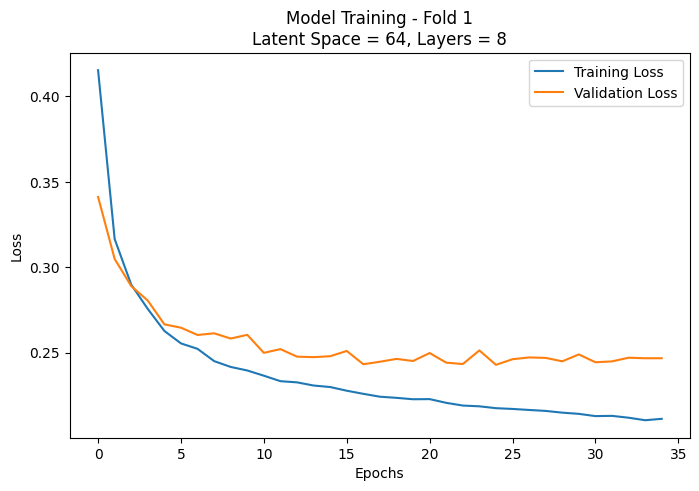

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.5002 - val_loss: 0.3375
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - loss: 0.3240 - val_loss: 0.3013
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.2959 - val_loss: 0.2894
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - loss: 0.2780 - val_loss: 0.2700
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.2608 - val_loss: 0.2664
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - loss: 0.2518 - val_loss: 0.2538
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.2465 - val_loss: 0.2469
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.2401 - val_loss: 0.2502
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.2330 - val_loss: 0.2505
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.2336 - val_loss: 0.2415
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.2271 - val_loss: 0.2392
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 

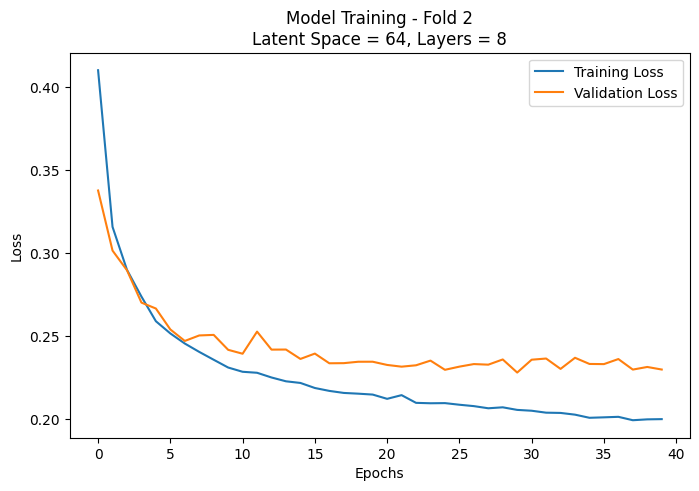

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.5069 - val_loss: 0.3607
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.3302 - val_loss: 0.3156
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - loss: 0.2951 - val_loss: 0.2854
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.2757 - val_loss: 0.2757
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.2585 - val_loss: 0.2674
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.2520 - val_loss: 0.2593
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.2434 - val_loss: 0.2490
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.2376 - val_loss: 0.2496
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.2362 - val_loss: 0.2537
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.2329 - val_loss: 0.2473
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.2309 - val_loss: 0.2378
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 

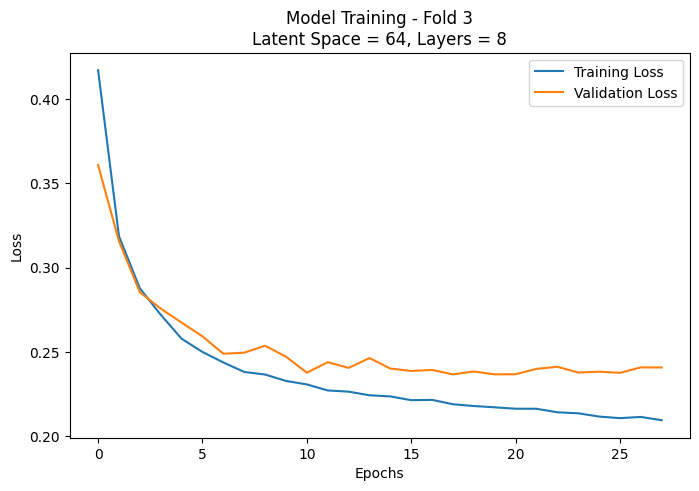

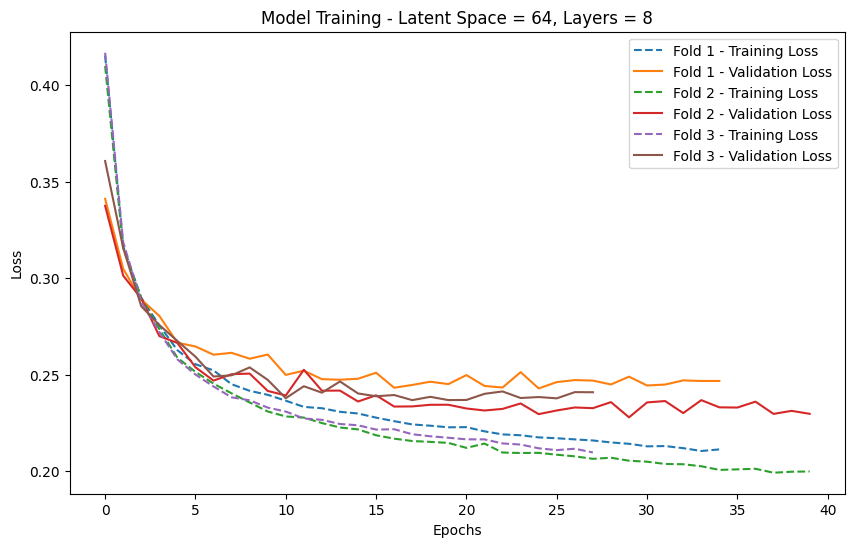

Average Validation Loss: 0.23906085391839346
Testing configuration: Latent Space = 64, Layers = 6
Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - loss: 0.4807 - val_loss: 0.3127
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 0.2956 - val_loss: 0.2732
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.2624 - val_loss: 0.2565
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2461 - val_loss: 0.2500
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.2384 - val_loss: 0.2422
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.2309 - val_loss: 0.2439
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.2268 - val_loss: 0.2379
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.2254 - val_loss: 0.2358
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.2203 - val_loss: 0.2324
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.2195 - val_loss: 0.2384
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━

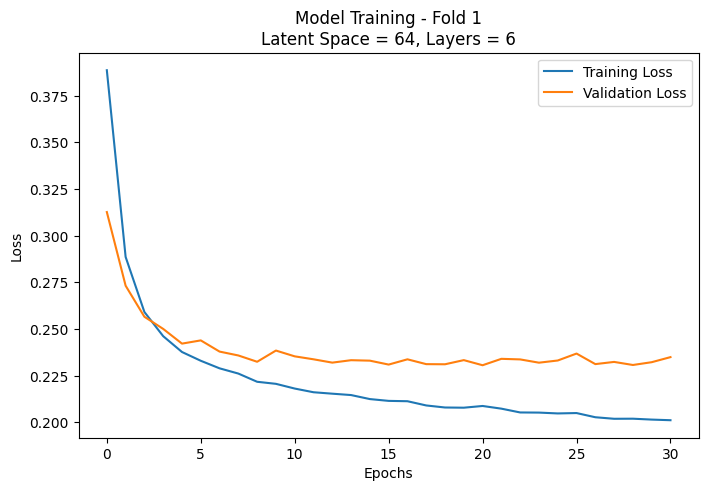

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - loss: 0.4838 - val_loss: 0.3151
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.2996 - val_loss: 0.2727
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2624 - val_loss: 0.2553
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.2453 - val_loss: 0.2473
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2344 - val_loss: 0.2382
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2269 - val_loss: 0.2334
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.2221 - val_loss: 0.2268
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.2175 - val_loss: 0.2289
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2156 - val_loss: 0.2242
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2130 - val_loss: 0.2256
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2091 - val_loss: 0.2263
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/ste

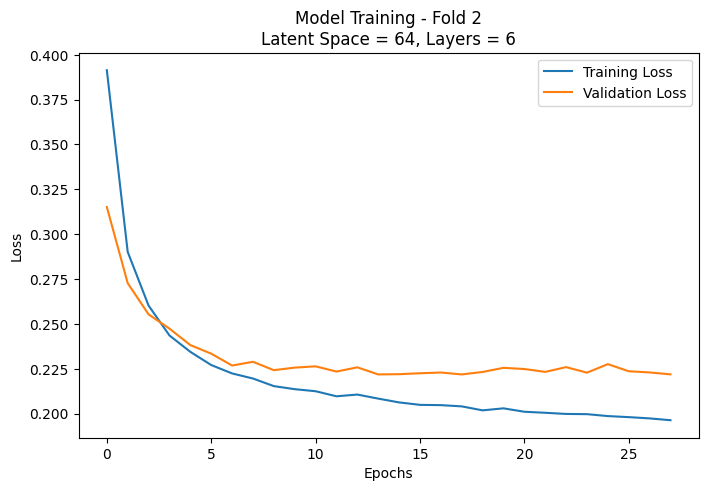

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - loss: 0.4865 - val_loss: 0.3196
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.3025 - val_loss: 0.2764
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2689 - val_loss: 0.2596
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.2498 - val_loss: 0.2558
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2456 - val_loss: 0.2488
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2351 - val_loss: 0.2470
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2336 - val_loss: 0.2502
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2293 - val_loss: 0.2444
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2284 - val_loss: 0.2401
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.2242 - val_loss: 0.2401
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.2211 - val_loss: 0.2405
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/ste

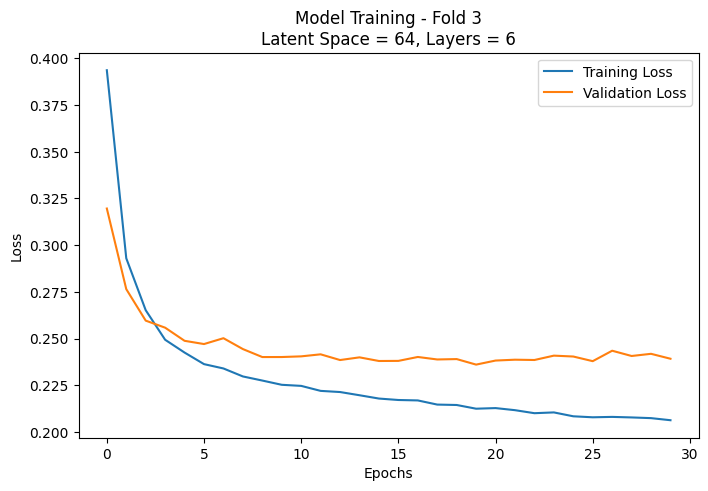

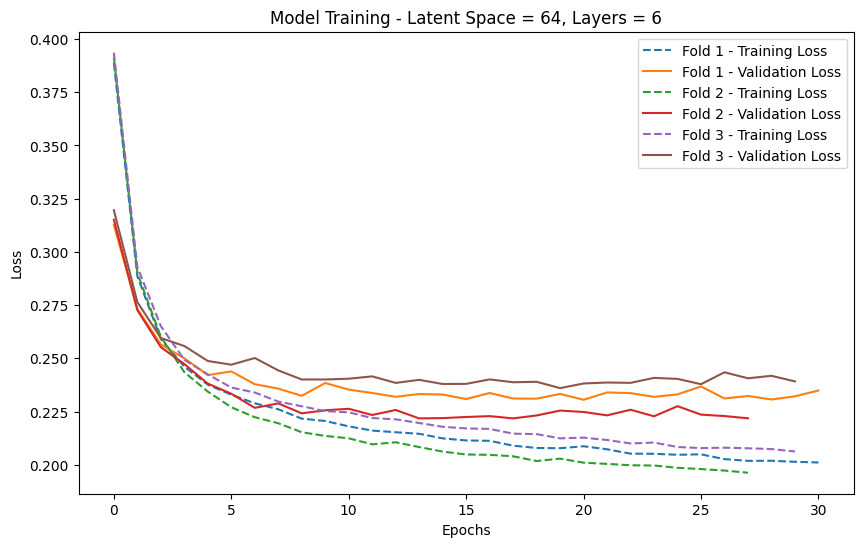

Average Validation Loss: 0.2319775472084681
Testing configuration: Latent Space = 64, Layers = 4
Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - loss: 0.4835 - val_loss: 0.3057
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2856 - val_loss: 0.2622
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2483 - val_loss: 0.2437
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2320 - val_loss: 0.2365
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2266 - val_loss: 0.2320
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.2200 - val_loss: 0.2259
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.2180 - val_loss: 0.2258
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.2126 - val_loss: 0.2270
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.2116 - val_loss: 0.2241
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.2090 - val_loss: 0.2266
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 

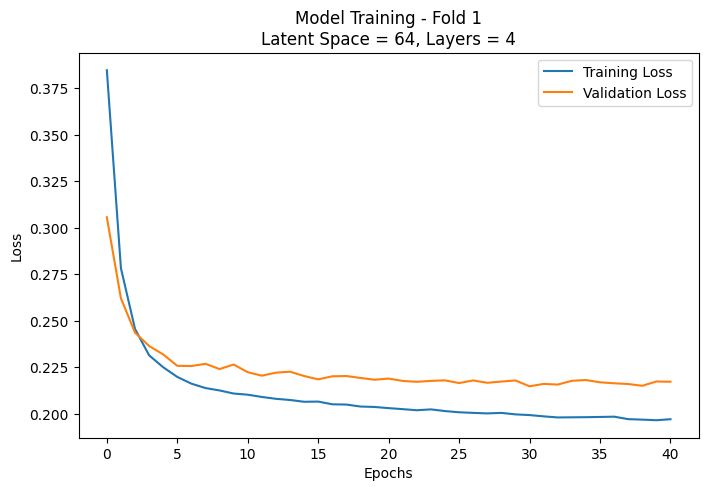

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - loss: 0.4804 - val_loss: 0.3039
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.2915 - val_loss: 0.2670
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.2571 - val_loss: 0.2456
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2392 - val_loss: 0.2392
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2303 - val_loss: 0.2291
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2215 - val_loss: 0.2271
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.2143 - val_loss: 0.2235
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.2137 - val_loss: 0.2235
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.2126 - val_loss: 0.2212
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2109 - val_loss: 0.2232
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2115 - val_loss: 0.2185
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/ste

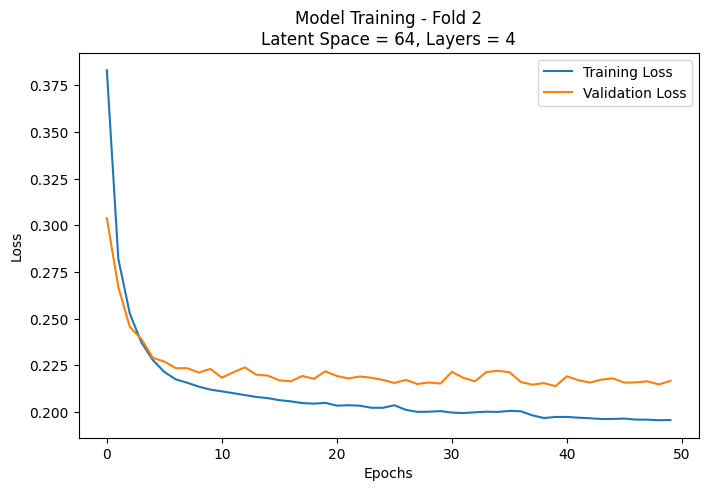

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - loss: 0.4887 - val_loss: 0.3054
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 0.2868 - val_loss: 0.2706
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2584 - val_loss: 0.2461
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2395 - val_loss: 0.2437
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.2304 - val_loss: 0.2369
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2262 - val_loss: 0.2345
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2226 - val_loss: 0.2309
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.2189 - val_loss: 0.2266
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2157 - val_loss: 0.2246
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2145 - val_loss: 0.2237
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.2104 - val_loss: 0.2224
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/ste

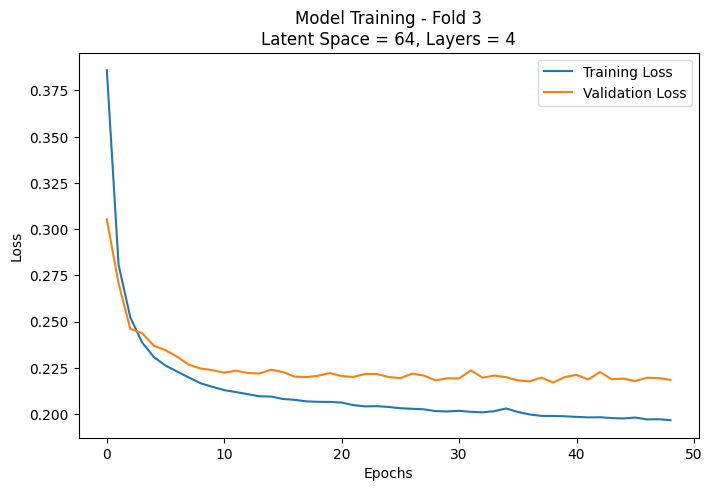

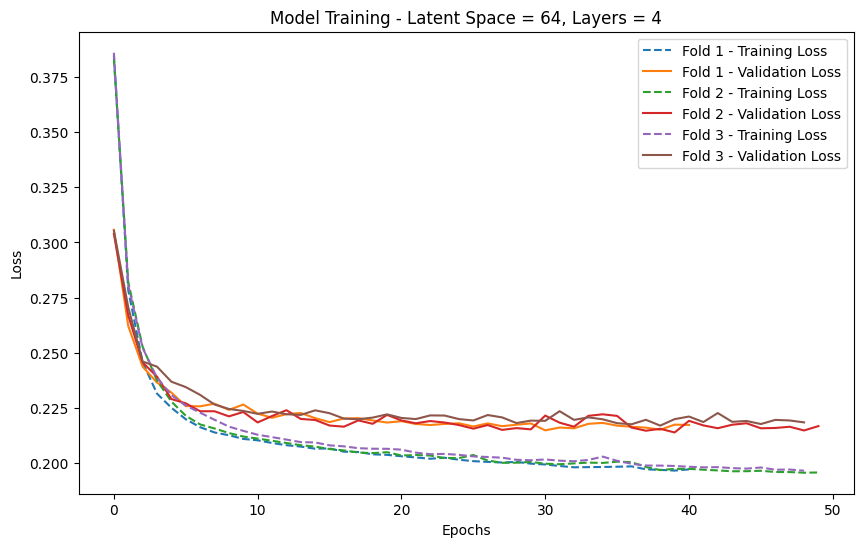

Average Validation Loss: 0.21754535039265951
Testing configuration: Latent Space = 64, Layers = 2
Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - loss: 0.4940 - val_loss: 0.2955
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.2806 - val_loss: 0.2596
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.2482 - val_loss: 0.2478
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.2389 - val_loss: 0.2389
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.2335 - val_loss: 0.2372
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2295 - val_loss: 0.2335
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2247 - val_loss: 0.2310
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2222 - val_loss: 0.2306
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2235 - val_loss: 0.2275
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.2178 - val_loss: 0.2264
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━

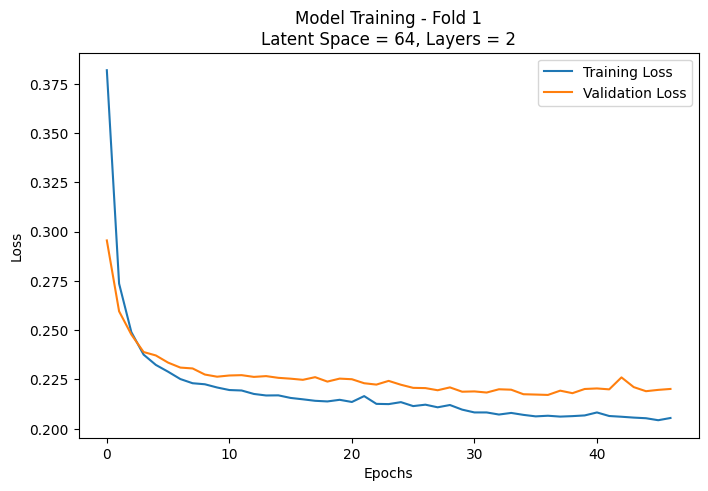

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - loss: 0.4913 - val_loss: 0.2942
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.2810 - val_loss: 0.2623
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2540 - val_loss: 0.2482
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2447 - val_loss: 0.2435
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.2400 - val_loss: 0.2381
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2348 - val_loss: 0.2377
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.2317 - val_loss: 0.2371
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2281 - val_loss: 0.2325
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.2254 - val_loss: 0.2322
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.2245 - val_loss: 0.2293
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.2256 - val_loss: 0.2276
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/ste

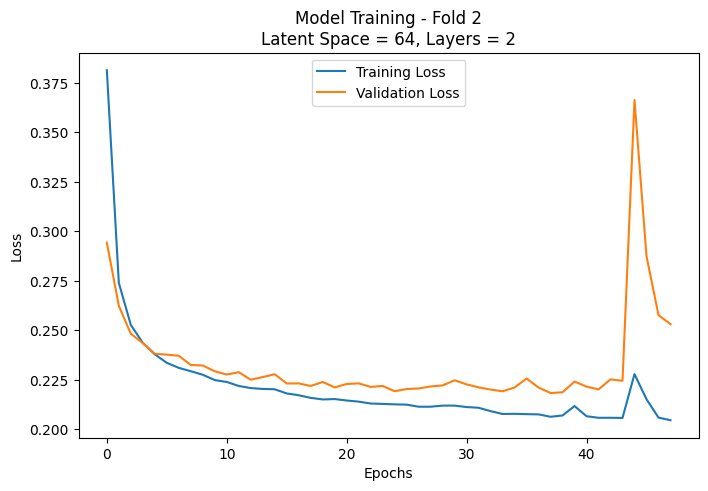

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 0.4904 - val_loss: 0.3045
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2816 - val_loss: 0.2691
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2565 - val_loss: 0.2563
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.2443 - val_loss: 0.2454
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2389 - val_loss: 0.2401
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.2335 - val_loss: 0.2366
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.2291 - val_loss: 0.2340
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.2269 - val_loss: 0.2337
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2246 - val_loss: 0.2320
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2233 - val_loss: 0.2345
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2244 - val_loss: 0.2302
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step

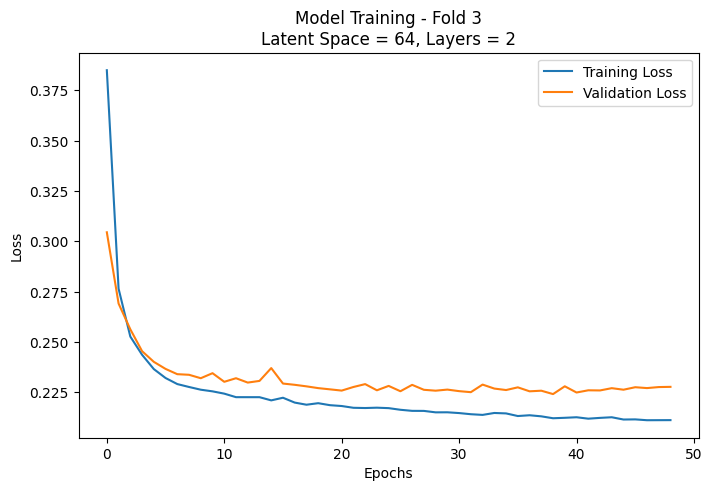

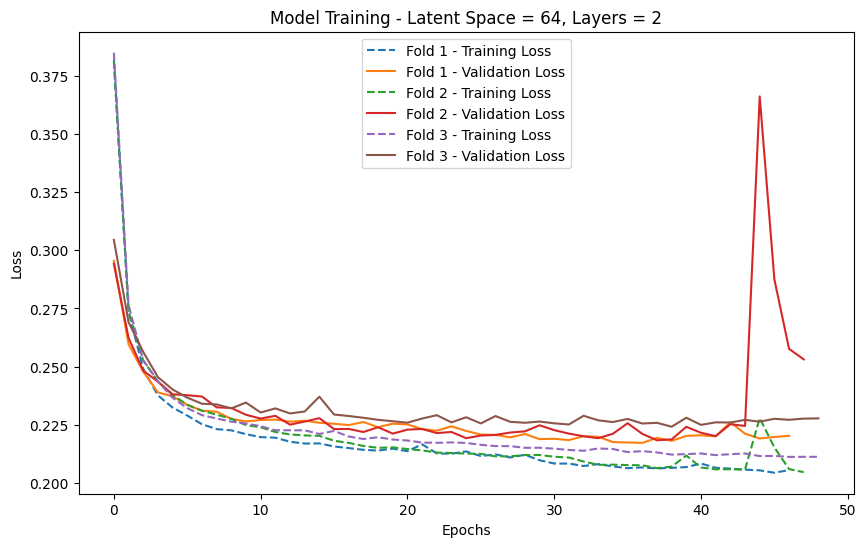

Average Validation Loss: 0.23365737994511923
Testing configuration: Latent Space = 32, Layers = 8
Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.5068 - val_loss: 0.3558
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.3418 - val_loss: 0.3154
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.3048 - val_loss: 0.3039
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2873 - val_loss: 0.2837
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.2745 - val_loss: 0.2774
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.2670 - val_loss: 0.2804
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2636 - val_loss: 0.2765
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2626 - val_loss: 0.2771
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.2601 - val_loss: 0.2718
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.2572 - val_loss: 0.2695
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━

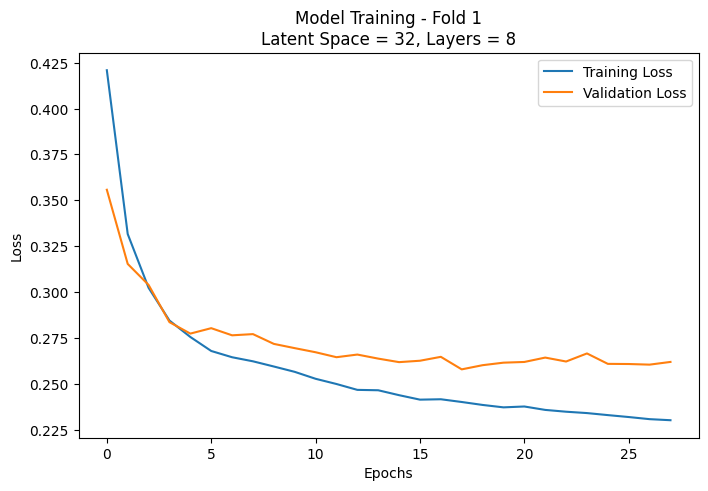

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.5155 - val_loss: 0.3524
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.3408 - val_loss: 0.3272
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.3166 - val_loss: 0.3081
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.2989 - val_loss: 0.3069
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2948 - val_loss: 0.2974
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.2903 - val_loss: 0.2946
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.2837 - val_loss: 0.2900
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.2784 - val_loss: 0.2855
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.2777 - val_loss: 0.2862
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2747 - val_loss: 0.2840
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.2702 - val_loss: 0.2840
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/ste

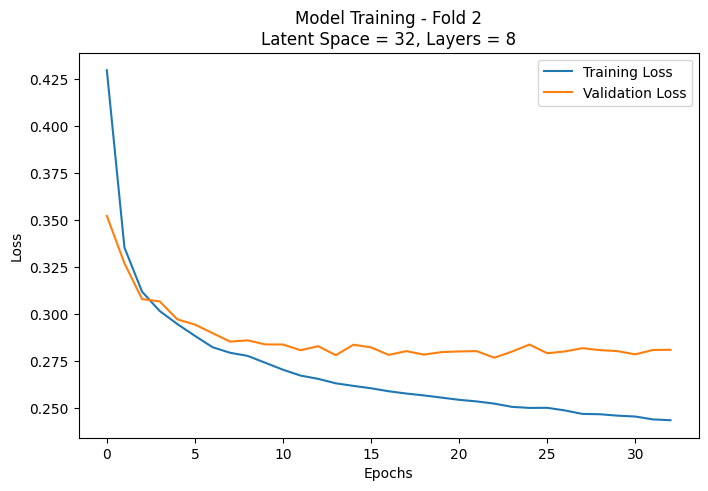

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - loss: 0.5120 - val_loss: 0.3576
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.3449 - val_loss: 0.3138
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.3071 - val_loss: 0.2959
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.2875 - val_loss: 0.2884
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 0.2791 - val_loss: 0.2785
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2710 - val_loss: 0.2764
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.2693 - val_loss: 0.2726
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.2558 - val_loss: 0.2765
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.2555 - val_loss: 0.2684
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.2537 - val_loss: 0.2688
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2499 - val_loss: 0.2657
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/ste

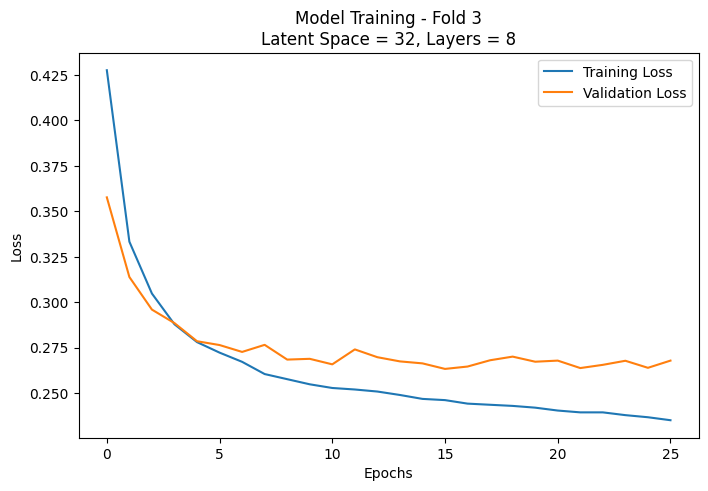

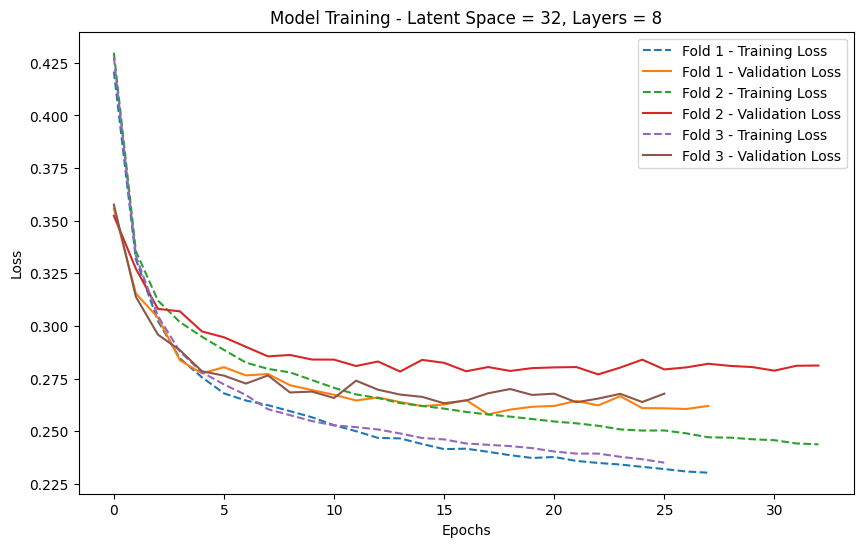

Average Validation Loss: 0.27031416694323224
Testing configuration: Latent Space = 32, Layers = 6
Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.5080 - val_loss: 0.3454
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - loss: 0.3282 - val_loss: 0.3106
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2971 - val_loss: 0.2932
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2826 - val_loss: 0.2848
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.2742 - val_loss: 0.2799
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2672 - val_loss: 0.2779
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.2663 - val_loss: 0.2729
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2595 - val_loss: 0.2734
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.2581 - val_loss: 0.2733
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.2576 - val_loss: 0.2713
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━

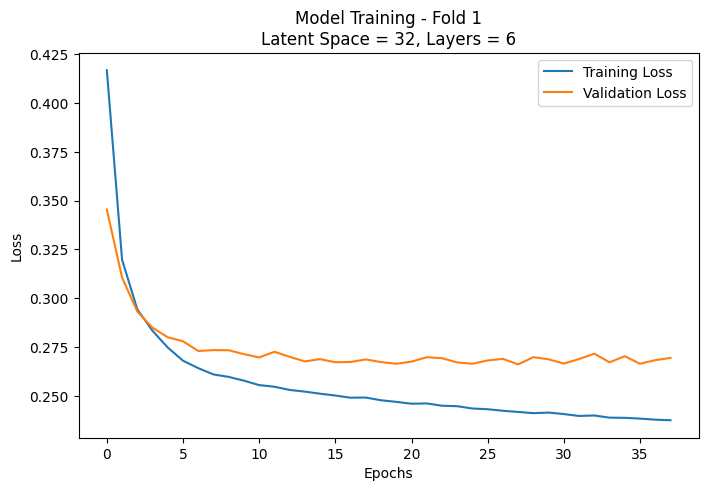

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - loss: 0.5083 - val_loss: 0.3532
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.3418 - val_loss: 0.3213
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.3138 - val_loss: 0.3045
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.2960 - val_loss: 0.2997
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2878 - val_loss: 0.2896
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2813 - val_loss: 0.2879
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2812 - val_loss: 0.2858
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2767 - val_loss: 0.2863
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2735 - val_loss: 0.2864
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.2746 - val_loss: 0.2848
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2701 - val_loss: 0.2853
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/ste

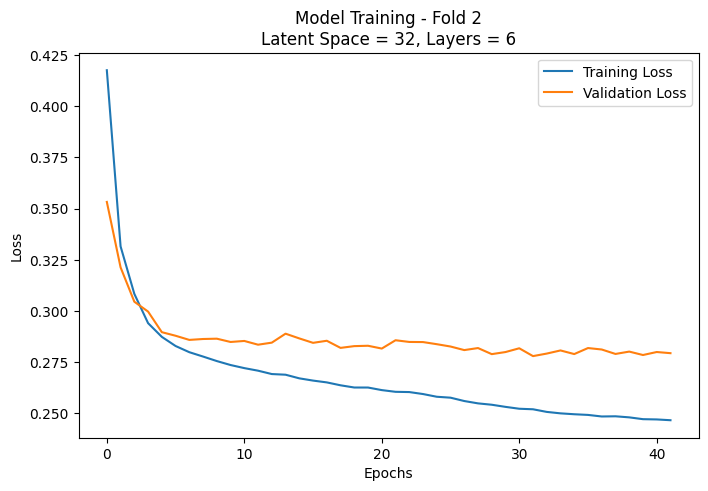

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - loss: 0.5183 - val_loss: 0.3455
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.3303 - val_loss: 0.3060
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.2941 - val_loss: 0.2849
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2779 - val_loss: 0.2756
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.2655 - val_loss: 0.2723
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2596 - val_loss: 0.2662
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2534 - val_loss: 0.2632
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2513 - val_loss: 0.2609
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.2477 - val_loss: 0.2559
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2451 - val_loss: 0.2629
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2448 - val_loss: 0.2577
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/ste

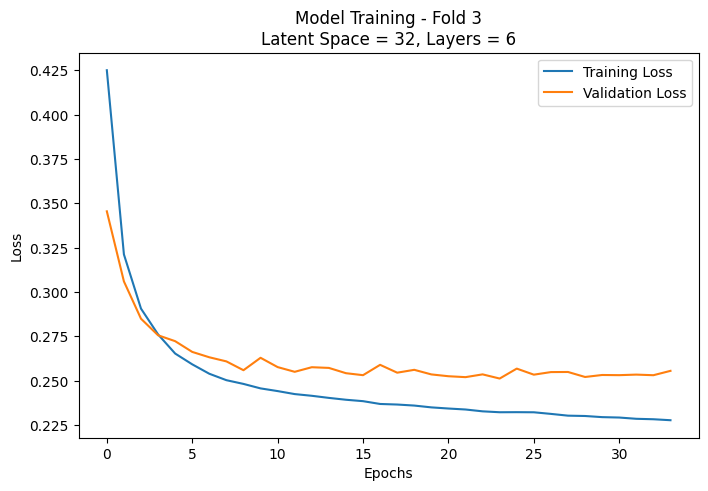

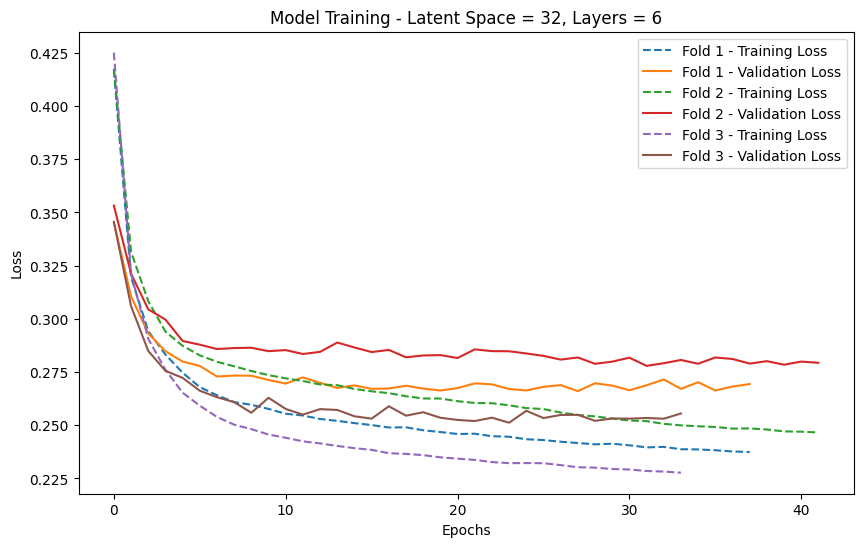

Average Validation Loss: 0.268086055914561
Testing configuration: Latent Space = 32, Layers = 4
Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - loss: 0.5283 - val_loss: 0.3552
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.3396 - val_loss: 0.3206
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.3077 - val_loss: 0.3006
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.2896 - val_loss: 0.2928
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.2853 - val_loss: 0.2881
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.2794 - val_loss: 0.2884
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2765 - val_loss: 0.2826
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2736 - val_loss: 0.2803
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.2703 - val_loss: 0.2758
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.2676 - val_loss: 0.2748
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3

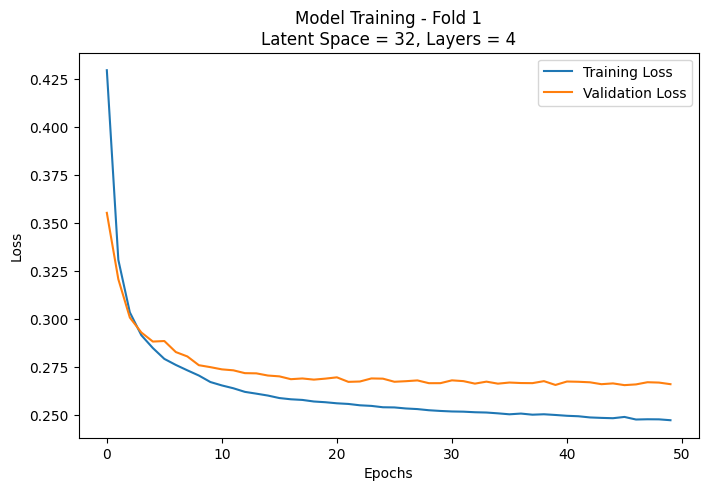

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - loss: 0.5216 - val_loss: 0.3544
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.3363 - val_loss: 0.3106
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.3013 - val_loss: 0.2924
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2845 - val_loss: 0.2798
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.2754 - val_loss: 0.2782
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2720 - val_loss: 0.2740
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.2679 - val_loss: 0.2738
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2656 - val_loss: 0.2725
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2652 - val_loss: 0.2700
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.2630 - val_loss: 0.2694
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2616 - val_loss: 0.2697
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/ste

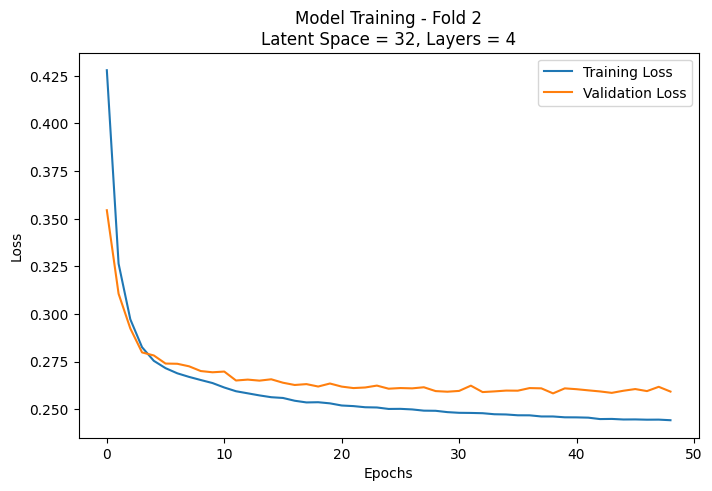

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - loss: 0.5214 - val_loss: 0.3450
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.3348 - val_loss: 0.3137
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.3084 - val_loss: 0.3020
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.2975 - val_loss: 0.2966
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2878 - val_loss: 0.2920
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2830 - val_loss: 0.2857
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2775 - val_loss: 0.2831
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.2736 - val_loss: 0.2789
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2712 - val_loss: 0.2741
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.2657 - val_loss: 0.2712
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.2617 - val_loss: 0.2702
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/ste

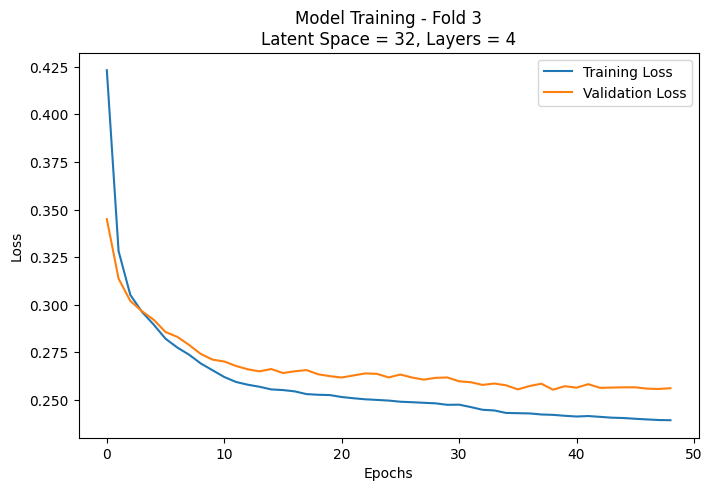

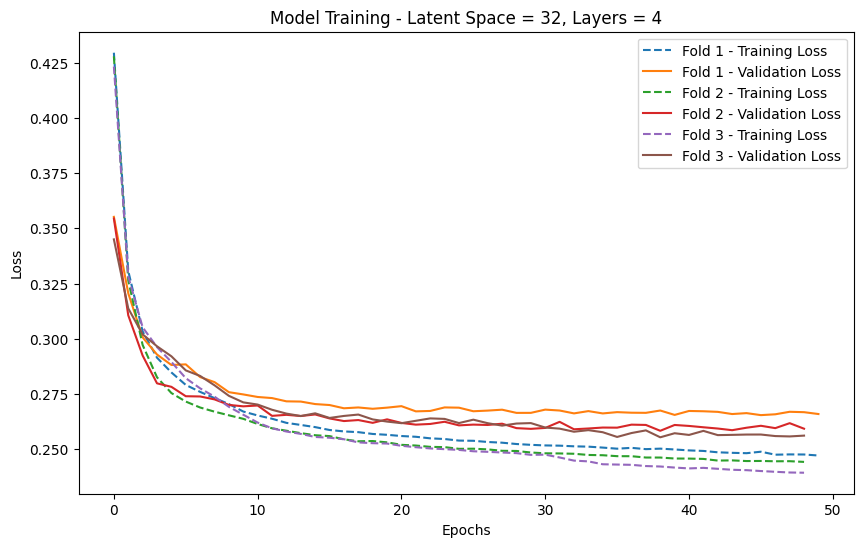

Average Validation Loss: 0.26041383544603985
Testing configuration: Latent Space = 32, Layers = 2
Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - loss: 0.5276 - val_loss: 0.3481
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3314 - val_loss: 0.3059
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.2986 - val_loss: 0.2948
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2865 - val_loss: 0.2909
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.2814 - val_loss: 0.2833
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.2788 - val_loss: 0.2812
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.2776 - val_loss: 0.2789
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.2748 - val_loss: 0.2782
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2697 - val_loss: 0.2739
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2687 - val_loss: 0.2725
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━

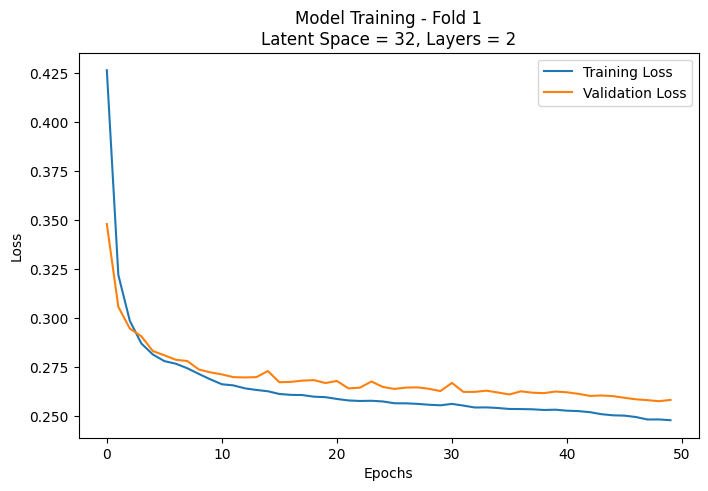

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - loss: 0.5343 - val_loss: 0.3524
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3332 - val_loss: 0.3057
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3029 - val_loss: 0.2938
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2896 - val_loss: 0.2923
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2860 - val_loss: 0.2863
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.2844 - val_loss: 0.2852
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2823 - val_loss: 0.2827
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2791 - val_loss: 0.2827
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2783 - val_loss: 0.2808
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.2762 - val_loss: 0.2820
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2777 - val_loss: 0.2811
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/ste

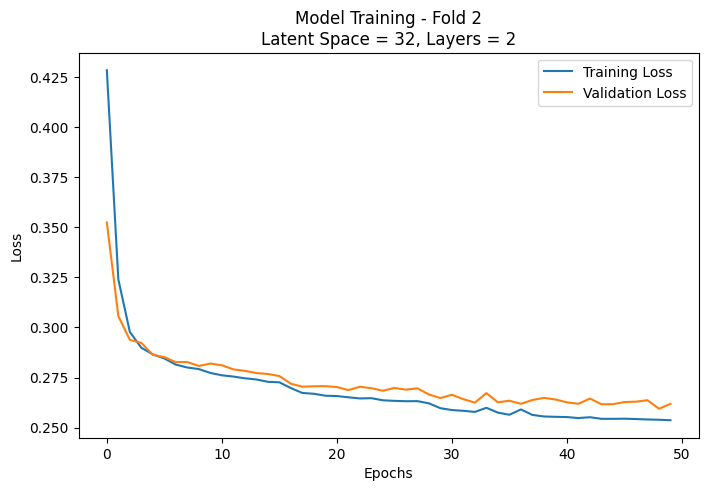

Epoch 1/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - loss: 0.5290 - val_loss: 0.3487
Epoch 2/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3351 - val_loss: 0.3215
Epoch 3/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.3183 - val_loss: 0.3168
Epoch 4/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.3117 - val_loss: 0.3131
Epoch 5/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3057 - val_loss: 0.3114
Epoch 6/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3019 - val_loss: 0.3002
Epoch 7/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.2921 - val_loss: 0.2960
Epoch 8/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.2884 - val_loss: 0.2935
Epoch 9/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2878 - val_loss: 0.2920
Epoch 10/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.2868 - val_loss: 0.2912
Epoch 11/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2864 - val_loss: 0.2910
Epoch 12/50
296/296 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/ste

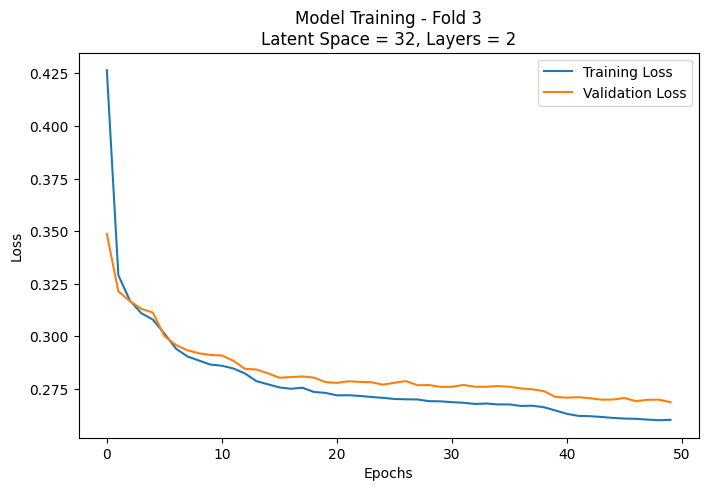

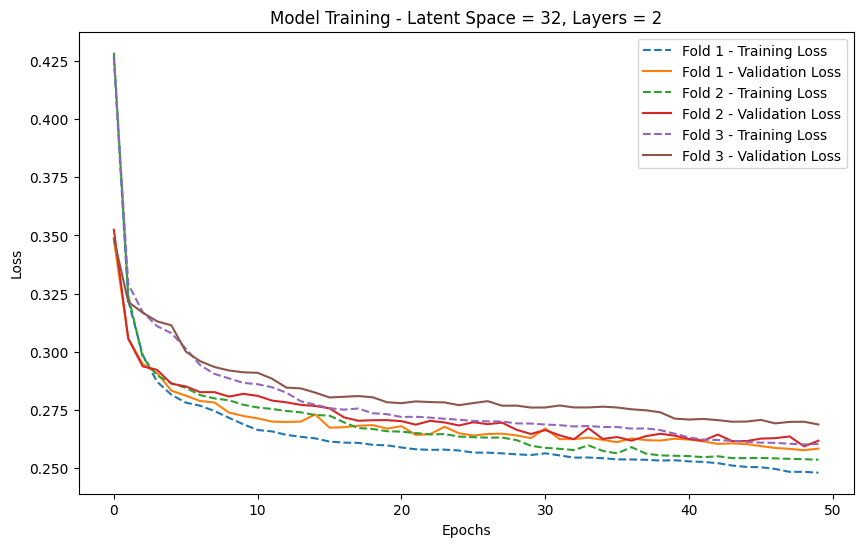

Average Validation Loss: 0.2630169590314229


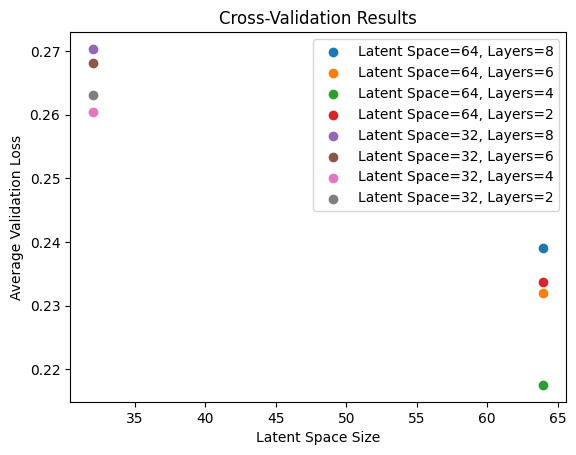

In [ ]:
latent_space_sizes = [64,32]
num_layers_options = [8, 6, 4, 2]
k_folds = 3

# Ensure it's a numpy array and properly shaped
TrainingImages_flat = np.array(TrainingImages_flat)
print(f"Flattened training set: {TrainingImages_flat.shape}, Labels: {TrainingLabels.shape}")

results_2 = Vanilla_cross_validate_model(
    TrainingImages_flat,
    latent_space_sizes=latent_space_sizes,
    num_layers_options=num_layers_options,
    k_folds=k_folds
)

for config, loss in results_2.items():
    plt.scatter(config[0], loss, label=f"Latent Space={config[0]}, Layers={config[1]}")
plt.xlabel("Latent Space Size")
plt.ylabel("Average Validation Loss")
plt.legend()
plt.title("Cross-Validation Results")
plt.show()

In [ ]:
# Print the results for each configuration
for config, loss in results_2.items():
    print(f"Configuration: Latent Space={config[0]}, Layers={config[1]}")
    print(f"  Average Validation Loss: {loss:.4f}")

Configuration: Latent Space=64, Layers=8
  Average Validation Loss: 0.2391
Configuration: Latent Space=64, Layers=6
  Average Validation Loss: 0.2320
Configuration: Latent Space=64, Layers=4
  Average Validation Loss: 0.2175
Configuration: Latent Space=64, Layers=2
  Average Validation Loss: 0.2337
Configuration: Latent Space=32, Layers=8
  Average Validation Loss: 0.2703
Configuration: Latent Space=32, Layers=6
  Average Validation Loss: 0.2681
Configuration: Latent Space=32, Layers=4
  Average Validation Loss: 0.2604
Configuration: Latent Space=32, Layers=2
  Average Validation Loss: 0.2630


## VAE AutoEncoder Cross Validation






In [ ]:
def VAE_cross_validate_model(X, latent_dim_options, layer_nodes_options, k_folds=5, epochs=500, batch_size=32):

    results = {}
    kfold = KFold(n_splits=k_folds, shuffle=True, random_state=42)

    for latent_dim in latent_dim_options:
        for layer_nodes in layer_nodes_options:
            fold_losses = []
            all_train_losses = []
            all_val_losses = []

            print(f"Testing configuration: Latent Space = {latent_dim}, Layers = {layer_nodes}")

            for fold, (train_index, val_index) in enumerate(kfold.split(X)):
                X_train, X_val = X[train_index], X[val_index]

                # Build the VAE model
                vae, encoder = create_vae_model(latent_dim, layer_nodes)

                # Compile the VAE model
                vae.compile(optimizer='adam', loss='mse')
                vae.summary()
                VAE_early_stopping = tf.keras.callbacks.EarlyStopping(
                  monitor='val_loss',  # Monitor validation loss
                  patience=5,          # Stop after 5 epochs of no improvement
                  restore_best_weights=True,  # Restore weights from the best epoch
                  verbose=1            # Print early stopping message
                  )

                # Train the model
                history = vae.fit(
                    X_train, X_train,
                    epochs=epochs,
                    batch_size=batch_size,
                    validation_data=(X_val, X_val),
                    callbacks = [VAE_early_stopping],
                    verbose=1
                )

                # Record the validation loss for the last epoch
                fold_losses.append(history.history['val_loss'][-1])
                # Accumulate the training and validation losses
                all_train_losses.append(history.history['loss'])
                all_val_losses.append(history.history['val_loss'])



                # Plot training and validation loss for this fold
                plt.figure(figsize=(8, 5))
                plt.plot(history.history['loss'], label='Training Loss')
                plt.plot(history.history['val_loss'], label='Validation Loss')
                plt.title(f'VAE Model Training - Fold {fold + 1}\nLatent Space = {latent_dim}, Layers = {layer_nodes}')
                plt.xlabel('Epochs')
                plt.ylabel('Loss')
                plt.legend()
                plt.show()

            # Average the losses across folds
            avg_loss = np.nanmean(fold_losses)
            results[(latent_dim, tuple(layer_nodes))] = avg_loss

            # Plot training and validation loss for all folds on the same graph
            plt.figure(figsize=(10, 6))
            for fold_idx in range(k_folds):
                plt.plot(all_train_losses[fold_idx], label=f'Fold {fold_idx + 1} - Training Loss', linestyle='--')
                plt.plot(all_val_losses[fold_idx], label=f'Fold {fold_idx + 1} - Validation Loss')
            plt.title(f'Model Training - Latent Space = {latent_dim}, Layers = {layer_nodes}')
            plt.xlabel('Epochs')
            plt.ylabel('Loss')
            plt.legend()
            plt.show()


            print(f"Average Validation Loss: {avg_loss}")

    return results


Testing configuration: Latent Space = 32, Layers = [512, 256, 128, 64]


Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ encoder_input             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_17 (Flatten)      │ (None, 12288)          │              0 │ encoder_input[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_23 (Dense)          │ (None, 512)            │      6,291,968 │ flatten_17[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_24 (Dense)          │ (None, 256)            │        131,328 │ dense_23[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_25 (Dense)          │ (None, 128)            │         32,896 │ dense_24[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 32), (None,    │      6,468,608 │ encoder_input[0][0]    │
│                           │ 32), (None, 32)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_26 (Dense)          │ (None, 64)             │          8,256 │ dense_25[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 64, 64, 3)      │      6,478,784 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 32)             │          2,080 │ dense_26[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 32)             │          2,080 │ dense_26[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vae_loss_layer_3          │ (None, 64, 64, 3)      │              0 │ encoder_input[0][0],   │
│ (VAELossLayer)            │                        │                │ decoder[0][0],         │
│                           │                        │                │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 12,947,392 (49.39 MB)

 Trainable params: 12,947,392 (49.39 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 27.0635 - val_loss: 20.5456
Epoch 2/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - loss: 20.2601 - val_loss: 19.1093
Epoch 3/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 19.0148 - val_loss: 18.4870
Epoch 4/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 18.5352 - val_loss: 18.0816
Epoch 5/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 18.0416 - val_loss: 17.7027
Epoch 6/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 17.8872 - val_loss: 17.4195
Epoch 7/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 17.5673 - val_loss: 17.3489
Epoch 8/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 17.2020 - val_loss: 17.1924
Epoch 9/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 17.1449 - val_loss: 16.6047
Epoch 10/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 16.6186 - val_loss: 16.3524
Epoch 11/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 16.4156 - val_loss: 16.3806
Epoch 12/500
355

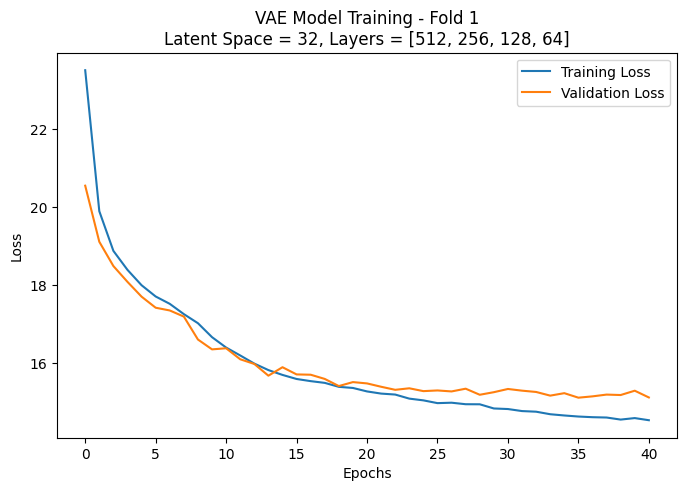

Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ encoder_input             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_26 (Flatten)      │ (None, 12288)          │              0 │ encoder_input[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_32 (Dense)          │ (None, 512)            │      6,291,968 │ flatten_26[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_33 (Dense)          │ (None, 256)            │        131,328 │ dense_32[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_34 (Dense)          │ (None, 128)            │         32,896 │ dense_33[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 32), (None,    │      6,468,608 │ encoder_input[0][0]    │
│                           │ 32), (None, 32)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_35 (Dense)          │ (None, 64)             │          8,256 │ dense_34[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 64, 64, 3)      │      6,478,784 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 32)             │          2,080 │ dense_35[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 32)             │          2,080 │ dense_35[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vae_loss_layer_4          │ (None, 64, 64, 3)      │              0 │ encoder_input[0][0],   │
│ (VAELossLayer)            │                        │                │ decoder[0][0],         │
│                           │                        │                │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 12,947,392 (49.39 MB)

 Trainable params: 12,947,392 (49.39 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 31.6117 - val_loss: 19.8291
Epoch 2/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - loss: 18.9460 - val_loss: 17.7641
Epoch 3/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 17.4331 - val_loss: 16.6923
Epoch 4/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 16.3987 - val_loss: 16.0973
Epoch 5/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 15.7442 - val_loss: 15.5751
Epoch 6/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 15.3638 - val_loss: 15.0636
Epoch 7/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 14.8448 - val_loss: 14.6212
Epoch 8/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 14.4506 - val_loss: 14.4358
Epoch 9/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 14.1918 - val_loss: 14.1698
Epoch 10/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 14.0074 - val_loss: 14.1537
Epoch 11/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 13.7912 - val_loss: 13.9597
Epoch 12/500
355/

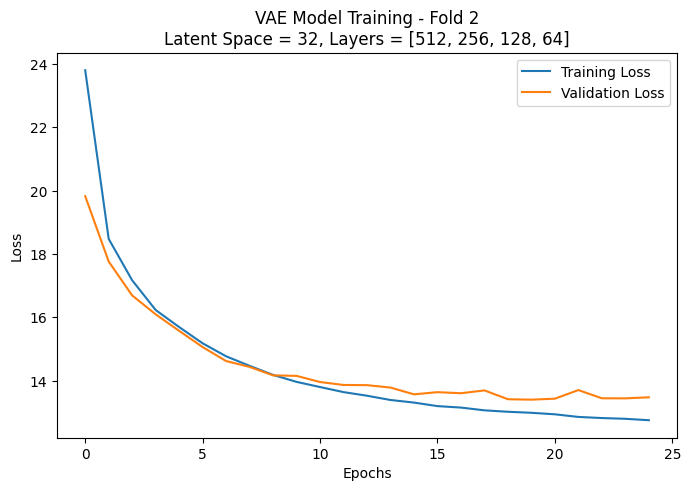

Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ encoder_input             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_35 (Flatten)      │ (None, 12288)          │              0 │ encoder_input[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_41 (Dense)          │ (None, 512)            │      6,291,968 │ flatten_35[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_42 (Dense)          │ (None, 256)            │        131,328 │ dense_41[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_43 (Dense)          │ (None, 128)            │         32,896 │ dense_42[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 32), (None,    │      6,468,608 │ encoder_input[0][0]    │
│                           │ 32), (None, 32)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_44 (Dense)          │ (None, 64)             │          8,256 │ dense_43[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 64, 64, 3)      │      6,478,784 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 32)             │          2,080 │ dense_44[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 32)             │          2,080 │ dense_44[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vae_loss_layer_5          │ (None, 64, 64, 3)      │              0 │ encoder_input[0][0],   │
│ (VAELossLayer)            │                        │                │ decoder[0][0],         │
│                           │                        │                │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 12,947,392 (49.39 MB)

 Trainable params: 12,947,392 (49.39 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 63.3246 - val_loss: 20.3464
Epoch 2/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 19.6665 - val_loss: 18.4795
Epoch 3/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 18.3188 - val_loss: 17.6249
Epoch 4/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 17.5081 - val_loss: 16.9442
Epoch 5/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 16.8792 - val_loss: 16.4714
Epoch 6/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 16.3171 - val_loss: 16.2239
Epoch 7/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 15.8762 - val_loss: 15.6342
Epoch 8/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 15.4701 - val_loss: 15.2945
Epoch 9/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 15.1262 - val_loss: 15.2396
Epoch 10/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 14.9743 - val_loss: 14.9108
Epoch 11/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 14.7084 - val_loss: 14.6928
Epoch 12/500
355

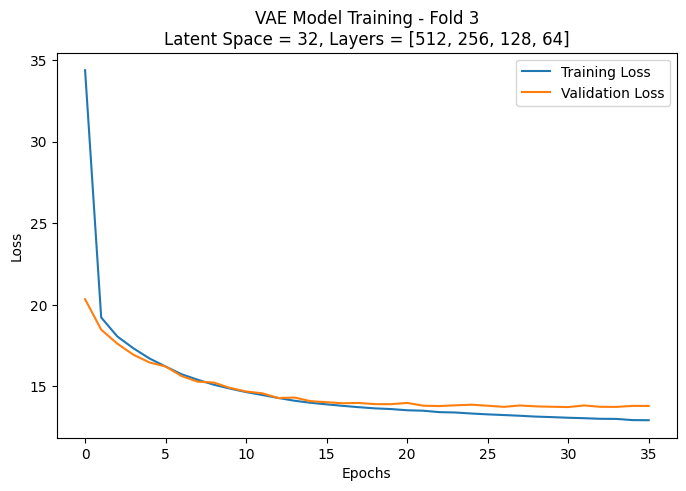

Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ encoder_input             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_44 (Flatten)      │ (None, 12288)          │              0 │ encoder_input[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_50 (Dense)          │ (None, 512)            │      6,291,968 │ flatten_44[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_51 (Dense)          │ (None, 256)            │        131,328 │ dense_50[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_52 (Dense)          │ (None, 128)            │         32,896 │ dense_51[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 32), (None,    │      6,468,608 │ encoder_input[0][0]    │
│                           │ 32), (None, 32)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_53 (Dense)          │ (None, 64)             │          8,256 │ dense_52[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 64, 64, 3)      │      6,478,784 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 32)             │          2,080 │ dense_53[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 32)             │          2,080 │ dense_53[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vae_loss_layer_6          │ (None, 64, 64, 3)      │              0 │ encoder_input[0][0],   │
│ (VAELossLayer)            │                        │                │ decoder[0][0],         │
│                           │                        │                │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 12,947,392 (49.39 MB)

 Trainable params: 12,947,392 (49.39 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 962.4167 - val_loss: 21.5839
Epoch 2/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 20.8920 - val_loss: 19.7029
Epoch 3/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 19.2819 - val_loss: 18.3155
Epoch 4/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 18.1436 - val_loss: 18.0421
Epoch 5/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 17.6924 - val_loss: 17.4400
Epoch 6/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 17.2189 - val_loss: 17.1091
Epoch 7/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 16.8404 - val_loss: 16.6460
Epoch 8/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 16.4240 - val_loss: 16.3477
Epoch 9/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 16.0877 - val_loss: 16.1563
Epoch 10/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 15.8771 - val_loss: 15.8158
Epoch 11/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 15.5879 - val_loss: 15.6224
Epoch 12/500
355

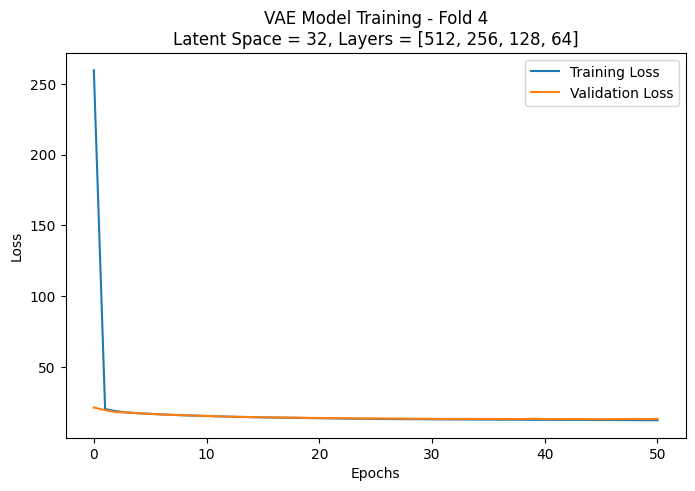

Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ encoder_input             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_53 (Flatten)      │ (None, 12288)          │              0 │ encoder_input[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_59 (Dense)          │ (None, 512)            │      6,291,968 │ flatten_53[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_60 (Dense)          │ (None, 256)            │        131,328 │ dense_59[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_61 (Dense)          │ (None, 128)            │         32,896 │ dense_60[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 32), (None,    │      6,468,608 │ encoder_input[0][0]    │
│                           │ 32), (None, 32)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_62 (Dense)          │ (None, 64)             │          8,256 │ dense_61[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 64, 64, 3)      │      6,478,784 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 32)             │          2,080 │ dense_62[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 32)             │          2,080 │ dense_62[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vae_loss_layer_7          │ (None, 64, 64, 3)      │              0 │ encoder_input[0][0],   │
│ (VAELossLayer)            │                        │                │ decoder[0][0],         │
│                           │                        │                │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 12,947,392 (49.39 MB)

 Trainable params: 12,947,392 (49.39 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 79.2291 - val_loss: 21.4090
Epoch 2/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 20.9365 - val_loss: 19.3212
Epoch 3/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 19.0421 - val_loss: 18.3052
Epoch 4/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 18.0633 - val_loss: 17.6217
Epoch 5/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 17.4346 - val_loss: 17.0925
Epoch 6/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 16.8144 - val_loss: 16.4882
Epoch 7/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 16.3893 - val_loss: 16.0132
Epoch 8/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 15.8018 - val_loss: 15.6128
Epoch 9/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 15.4330 - val_loss: 15.3033
Epoch 10/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 15.1611 - val_loss: 14.9902
Epoch 11/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 14.7956 - val_loss: 15.0387
Epoch 12/500
355/

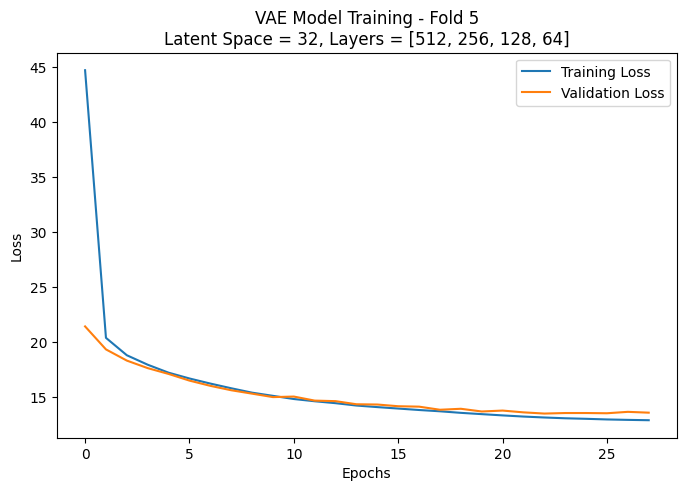

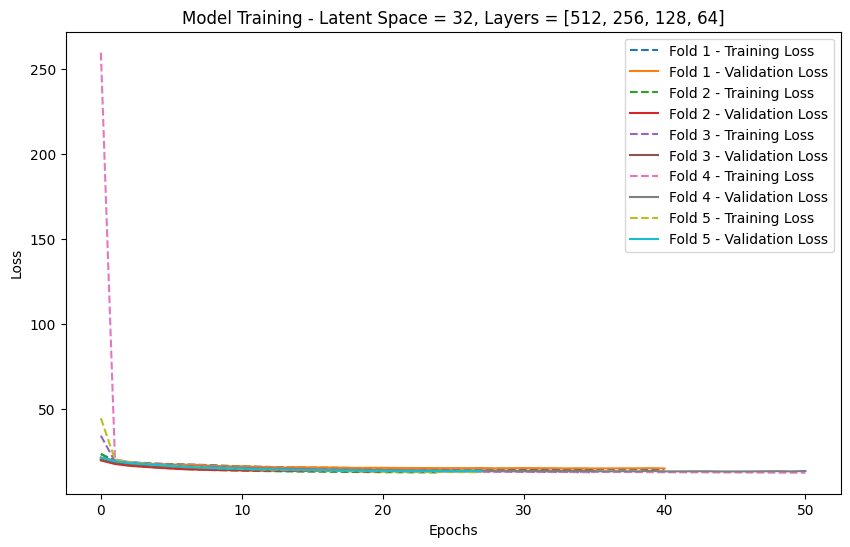

Average Validation Loss: 13.920614624023438
Testing configuration: Latent Space = 32, Layers = [256, 128, 64, 0]


Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ encoder_input             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_62 (Flatten)      │ (None, 12288)          │              0 │ encoder_input[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_68 (Dense)          │ (None, 256)            │      3,145,984 │ flatten_62[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_69 (Dense)          │ (None, 128)            │         32,896 │ dense_68[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 32), (None,    │      3,191,296 │ encoder_input[0][0]    │
│                           │ 32), (None, 32)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_70 (Dense)          │ (None, 64)             │          8,256 │ dense_69[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 64, 64, 3)      │      3,199,424 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 32)             │          2,080 │ dense_70[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 32)             │          2,080 │ dense_70[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vae_loss_layer_8          │ (None, 64, 64, 3)      │              0 │ encoder_input[0][0],   │
│ (VAELossLayer)            │                        │                │ decoder[0][0],         │
│                           │                        │                │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 6,390,720 (24.38 MB)

 Trainable params: 6,390,720 (24.38 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 296.5738 - val_loss: 28.6789
Epoch 2/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 28.3414 - val_loss: 26.8993
Epoch 3/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 26.9414 - val_loss: 26.5249
Epoch 4/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 26.6497 - val_loss: 26.4380
Epoch 5/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 26.5152 - val_loss: 26.4209
Epoch 6/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 26.7724 - val_loss: 26.4113
Epoch 7/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 26.6771 - val_loss: 26.4102
Epoch 8/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 26.5440 - val_loss: 26.4132
Epoch 9/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 26.7637 - val_loss: 26.4096
Epoch 10/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 26.7595 - val_loss: 26.4107
Epoch 11/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 26.6863 - val_loss: 26.4107
Epoch 12/500
355

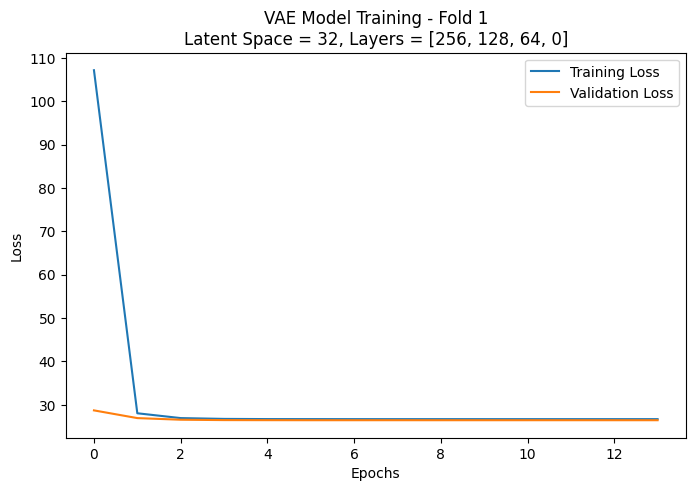

Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ encoder_input             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_71 (Flatten)      │ (None, 12288)          │              0 │ encoder_input[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_76 (Dense)          │ (None, 256)            │      3,145,984 │ flatten_71[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_77 (Dense)          │ (None, 128)            │         32,896 │ dense_76[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 32), (None,    │      3,191,296 │ encoder_input[0][0]    │
│                           │ 32), (None, 32)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_78 (Dense)          │ (None, 64)             │          8,256 │ dense_77[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 64, 64, 3)      │      3,199,424 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 32)             │          2,080 │ dense_78[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 32)             │          2,080 │ dense_78[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vae_loss_layer_9          │ (None, 64, 64, 3)      │              0 │ encoder_input[0][0],   │
│ (VAELossLayer)            │                        │                │ decoder[0][0],         │
│                           │                        │                │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 6,390,720 (24.38 MB)

 Trainable params: 6,390,720 (24.38 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 12s 15ms/step - loss: 947339648.0000 - val_loss: 44.6064
Epoch 2/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 44.7878 - val_loss: 34.4009
Epoch 3/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 33.0650 - val_loss: 30.4721
Epoch 4/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 29.4026 - val_loss: 27.8317
Epoch 5/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 27.1742 - val_loss: 26.7610
Epoch 6/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 26.5559 - val_loss: 26.7575
Epoch 7/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 26.6462 - val_loss: 26.7571
Epoch 8/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 26.5134 - val_loss: 26.7553
Epoch 9/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 26.5798 - val_loss: 26.7549
Epoch 10/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 26.5501 - val_loss: 26.7556
Epoch 11/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 26.4867 - val_loss: 26.7546
Epoch 12/5

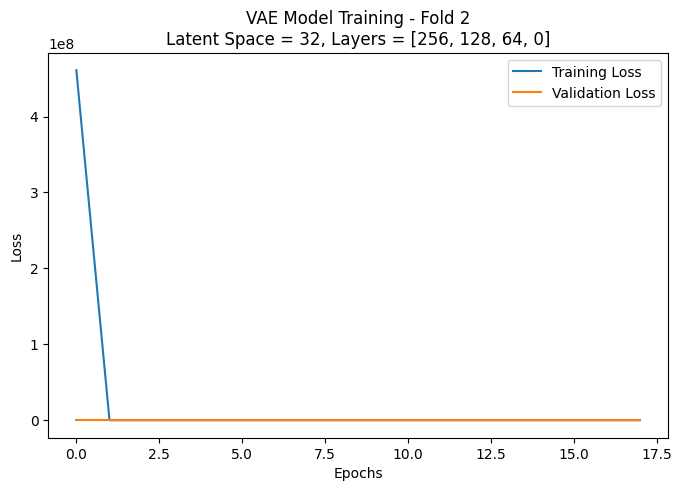

Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ encoder_input             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_80 (Flatten)      │ (None, 12288)          │              0 │ encoder_input[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_84 (Dense)          │ (None, 256)            │      3,145,984 │ flatten_80[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_85 (Dense)          │ (None, 128)            │         32,896 │ dense_84[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 32), (None,    │      3,191,296 │ encoder_input[0][0]    │
│                           │ 32), (None, 32)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_86 (Dense)          │ (None, 64)             │          8,256 │ dense_85[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 64, 64, 3)      │      3,199,424 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 32)             │          2,080 │ dense_86[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 32)             │          2,080 │ dense_86[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vae_loss_layer_10         │ (None, 64, 64, 3)      │              0 │ encoder_input[0][0],   │
│ (VAELossLayer)            │                        │                │ decoder[0][0],         │
│                           │                        │                │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 6,390,720 (24.38 MB)

 Trainable params: 6,390,720 (24.38 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 11s 19ms/step - loss: 869.4481 - val_loss: 28.7353
Epoch 2/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 27.9318 - val_loss: 26.9403
Epoch 3/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 26.9718 - val_loss: 26.6400
Epoch 4/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 26.6839 - val_loss: 26.5788
Epoch 5/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 26.6963 - val_loss: 26.5678
Epoch 6/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 26.6837 - val_loss: 26.5659
Epoch 7/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 26.5866 - val_loss: 26.5677
Epoch 8/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 26.5621 - val_loss: 26.5662
Epoch 9/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 26.6346 - val_loss: 26.5689
Epoch 10/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 26.5154 - val_loss: 26.5659
Epoch 11/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 26.7375 - val_loss: 26.5670
Epoch 11: early 

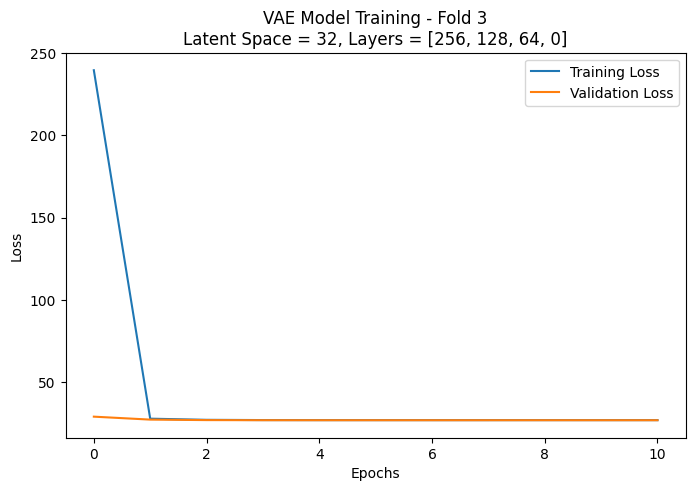

Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ encoder_input             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_89 (Flatten)      │ (None, 12288)          │              0 │ encoder_input[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_92 (Dense)          │ (None, 256)            │      3,145,984 │ flatten_89[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_93 (Dense)          │ (None, 128)            │         32,896 │ dense_92[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 32), (None,    │      3,191,296 │ encoder_input[0][0]    │
│                           │ 32), (None, 32)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_94 (Dense)          │ (None, 64)             │          8,256 │ dense_93[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 64, 64, 3)      │      3,199,424 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 32)             │          2,080 │ dense_94[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 32)             │          2,080 │ dense_94[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vae_loss_layer_11         │ (None, 64, 64, 3)      │              0 │ encoder_input[0][0],   │
│ (VAELossLayer)            │                        │                │ decoder[0][0],         │
│                           │                        │                │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 6,390,720 (24.38 MB)

 Trainable params: 6,390,720 (24.38 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step - loss: 351.4374 - val_loss: 28.2659
Epoch 2/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 27.8602 - val_loss: 27.0111
Epoch 3/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 26.8516 - val_loss: 26.7296
Epoch 4/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 26.7153 - val_loss: 26.6708
Epoch 5/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 26.5868 - val_loss: 26.6613
Epoch 6/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 26.8431 - val_loss: 26.6614
Epoch 7/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 26.6528 - val_loss: 26.6615
Epoch 8/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 26.6436 - val_loss: 26.6613
Epoch 9/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 26.7200 - val_loss: 26.6613
Epoch 10/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 26.5437 - val_loss: 26.6590
Epoch 11/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 26.5333 - val_loss: 26.6594
Epoch 12/500
355

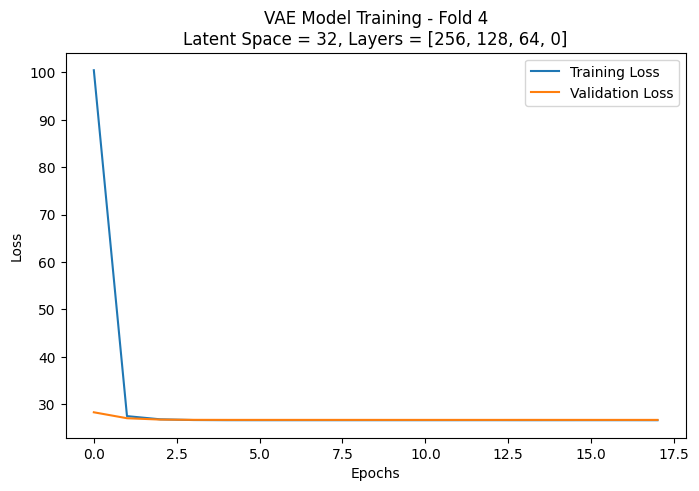

Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ encoder_input             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_98 (Flatten)      │ (None, 12288)          │              0 │ encoder_input[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_100 (Dense)         │ (None, 256)            │      3,145,984 │ flatten_98[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_101 (Dense)         │ (None, 128)            │         32,896 │ dense_100[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 32), (None,    │      3,191,296 │ encoder_input[0][0]    │
│                           │ 32), (None, 32)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_102 (Dense)         │ (None, 64)             │          8,256 │ dense_101[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 64, 64, 3)      │      3,199,424 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 32)             │          2,080 │ dense_102[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 32)             │          2,080 │ dense_102[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vae_loss_layer_12         │ (None, 64, 64, 3)      │              0 │ encoder_input[0][0],   │
│ (VAELossLayer)            │                        │                │ decoder[0][0],         │
│                           │                        │                │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 6,390,720 (24.38 MB)

 Trainable params: 6,390,720 (24.38 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 12s 17ms/step - loss: 504.6550 - val_loss: 34.2897
Epoch 2/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 33.0012 - val_loss: 29.9598
Epoch 3/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 29.4507 - val_loss: 27.6547
Epoch 4/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 27.4608 - val_loss: 26.4828
Epoch 5/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 26.5879 - val_loss: 26.4665
Epoch 6/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 26.7374 - val_loss: 26.4613
Epoch 7/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 26.6501 - val_loss: 26.4617
Epoch 8/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 26.6090 - val_loss: 26.4630
Epoch 9/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 26.7909 - val_loss: 26.4603
Epoch 10/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 26.6567 - val_loss: 26.4622
Epoch 11/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 26.6902 - val_loss: 26.4627
Epoch 12/500
355

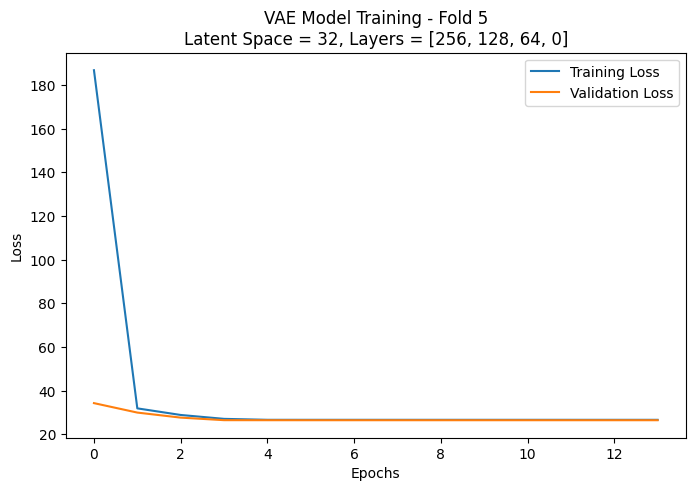

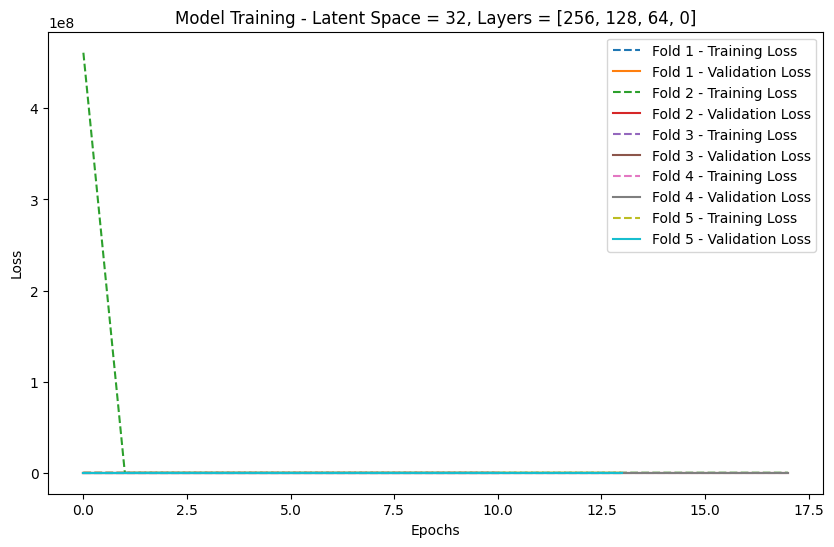

Average Validation Loss: 26.571109008789062
Testing configuration: Latent Space = 32, Layers = [512, 265, 128, 0]


Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ encoder_input             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_107 (Flatten)     │ (None, 12288)          │              0 │ encoder_input[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_108 (Dense)         │ (None, 512)            │      6,291,968 │ flatten_107[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_109 (Dense)         │ (None, 265)            │        135,945 │ dense_108[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 32), (None,    │      6,470,217 │ encoder_input[0][0]    │
│                           │ 32), (None, 32)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_110 (Dense)         │ (None, 128)            │         34,048 │ dense_109[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 64, 64, 3)      │      6,474,249 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 32)             │          4,128 │ dense_110[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 32)             │          4,128 │ dense_110[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vae_loss_layer_13         │ (None, 64, 64, 3)      │              0 │ encoder_input[0][0],   │
│ (VAELossLayer)            │                        │                │ decoder[0][0],         │
│                           │                        │                │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 12,944,466 (49.38 MB)

 Trainable params: 12,944,466 (49.38 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 307.3801 - val_loss: 28.1423
Epoch 2/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 13s 8ms/step - loss: 27.8636 - val_loss: 26.8177
Epoch 3/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 27.0130 - val_loss: 26.5004
Epoch 4/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 26.7305 - val_loss: 26.4274
Epoch 5/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 26.7734 - val_loss: 26.4123
Epoch 6/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 26.6662 - val_loss: 26.4100
Epoch 7/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 26.6801 - val_loss: 26.4095
Epoch 8/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 26.7025 - val_loss: 26.4079
Epoch 9/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - loss: 26.6620 - val_loss: 26.4095
Epoch 10/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 26.6695 - val_loss: 26.4127
Epoch 11/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 26.7438 - val_loss: 26.4113
Epoch 12/500
35

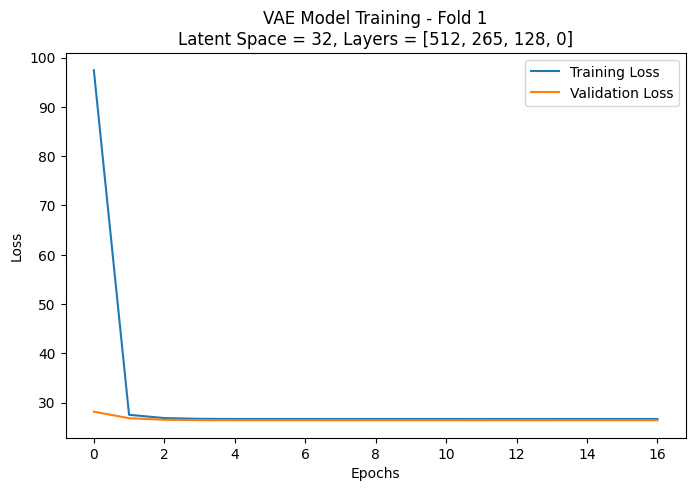

Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ encoder_input             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_116 (Flatten)     │ (None, 12288)          │              0 │ encoder_input[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_116 (Dense)         │ (None, 512)            │      6,291,968 │ flatten_116[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_117 (Dense)         │ (None, 265)            │        135,945 │ dense_116[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 32), (None,    │      6,470,217 │ encoder_input[0][0]    │
│                           │ 32), (None, 32)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_118 (Dense)         │ (None, 128)            │         34,048 │ dense_117[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 64, 64, 3)      │      6,474,249 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 32)             │          4,128 │ dense_118[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 32)             │          4,128 │ dense_118[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vae_loss_layer_14         │ (None, 64, 64, 3)      │              0 │ encoder_input[0][0],   │
│ (VAELossLayer)            │                        │                │ decoder[0][0],         │
│                           │                        │                │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 12,944,466 (49.38 MB)

 Trainable params: 12,944,466 (49.38 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step - loss: 13464.9072 - val_loss: 29.3045
Epoch 2/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 28.3001 - val_loss: 27.0968
Epoch 3/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 26.9544 - val_loss: 26.8157
Epoch 4/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 26.6064 - val_loss: 26.7599
Epoch 5/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 26.8197 - val_loss: 26.7561
Epoch 6/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 26.4744 - val_loss: 26.7538
Epoch 7/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 26.5612 - val_loss: 26.7537
Epoch 8/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 26.6327 - val_loss: 26.7579
Epoch 9/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 26.5513 - val_loss: 26.7563
Epoch 10/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 26.4970 - val_loss: 26.7525
Epoch 11/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 26.7009 - val_loss: 26.7574
Epoch 12/500
3

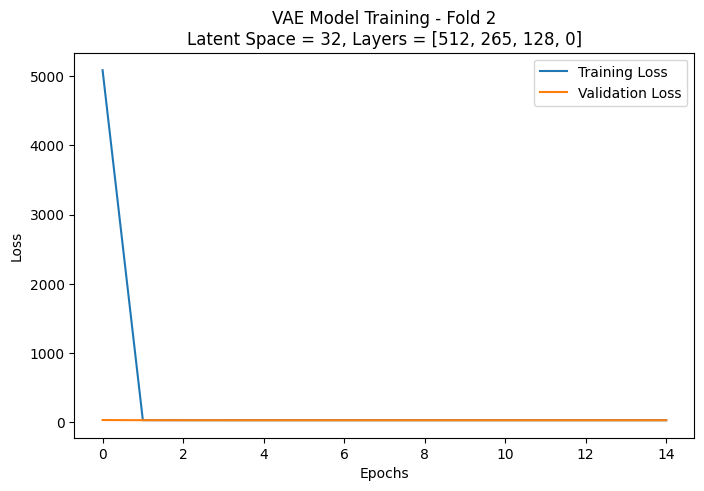

Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ encoder_input             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_125 (Flatten)     │ (None, 12288)          │              0 │ encoder_input[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_124 (Dense)         │ (None, 512)            │      6,291,968 │ flatten_125[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_125 (Dense)         │ (None, 265)            │        135,945 │ dense_124[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 32), (None,    │      6,470,217 │ encoder_input[0][0]    │
│                           │ 32), (None, 32)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_126 (Dense)         │ (None, 128)            │         34,048 │ dense_125[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 64, 64, 3)      │      6,474,249 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 32)             │          4,128 │ dense_126[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 32)             │          4,128 │ dense_126[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vae_loss_layer_15         │ (None, 64, 64, 3)      │              0 │ encoder_input[0][0],   │
│ (VAELossLayer)            │                        │                │ decoder[0][0],         │
│                           │                        │                │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 12,944,466 (49.38 MB)

 Trainable params: 12,944,466 (49.38 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step - loss: 130.9283 - val_loss: 28.1585
Epoch 2/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 27.7568 - val_loss: 26.9300
Epoch 3/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 26.9655 - val_loss: 26.6374
Epoch 4/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 26.7522 - val_loss: 26.5769
Epoch 5/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 26.6214 - val_loss: 26.5695
Epoch 6/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 26.5665 - val_loss: 26.5672
Epoch 7/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 26.5274 - val_loss: 26.5663
Epoch 8/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 26.5572 - val_loss: 26.5672
Epoch 9/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 26.6241 - val_loss: 26.5672
Epoch 10/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 26.4943 - val_loss: 26.5668
Epoch 11/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 26.6642 - val_loss: 26.5671
Epoch 12/500
355

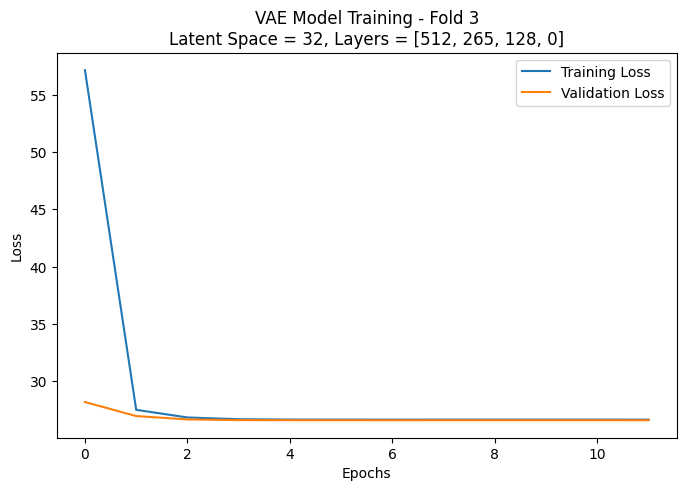

Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ encoder_input             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_134 (Flatten)     │ (None, 12288)          │              0 │ encoder_input[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_132 (Dense)         │ (None, 512)            │      6,291,968 │ flatten_134[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_133 (Dense)         │ (None, 265)            │        135,945 │ dense_132[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 32), (None,    │      6,470,217 │ encoder_input[0][0]    │
│                           │ 32), (None, 32)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_134 (Dense)         │ (None, 128)            │         34,048 │ dense_133[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 64, 64, 3)      │      6,474,249 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 32)             │          4,128 │ dense_134[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 32)             │          4,128 │ dense_134[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vae_loss_layer_16         │ (None, 64, 64, 3)      │              0 │ encoder_input[0][0],   │
│ (VAELossLayer)            │                        │                │ decoder[0][0],         │
│                           │                        │                │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 12,944,466 (49.38 MB)

 Trainable params: 12,944,466 (49.38 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 12s 18ms/step - loss: 44325.2695 - val_loss: 51.3468
Epoch 2/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 48.2319 - val_loss: 45.7188
Epoch 3/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 40.8153 - val_loss: 33.5679
Epoch 4/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 31.9510 - val_loss: 29.4715
Epoch 5/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 29.1838 - val_loss: 28.4353
Epoch 6/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 28.0867 - val_loss: 27.5994
Epoch 7/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 27.3568 - val_loss: 26.6912
Epoch 8/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 26.6532 - val_loss: 26.6682
Epoch 9/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 26.6652 - val_loss: 26.6640
Epoch 10/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 26.5235 - val_loss: 26.6639
Epoch 11/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 26.6623 - val_loss: 26.6617
Epoch 12/500
3

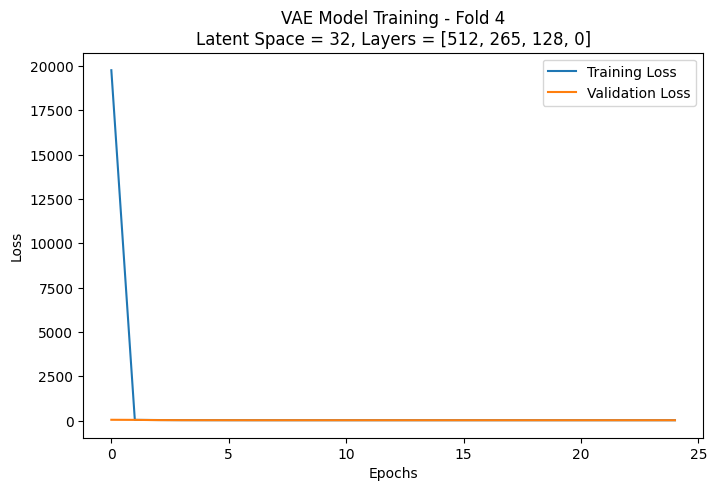

Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ encoder_input             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_143 (Flatten)     │ (None, 12288)          │              0 │ encoder_input[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_140 (Dense)         │ (None, 512)            │      6,291,968 │ flatten_143[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_141 (Dense)         │ (None, 265)            │        135,945 │ dense_140[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 32), (None,    │      6,470,217 │ encoder_input[0][0]    │
│                           │ 32), (None, 32)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_142 (Dense)         │ (None, 128)            │         34,048 │ dense_141[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 64, 64, 3)      │      6,474,249 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 32)             │          4,128 │ dense_142[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 32)             │          4,128 │ dense_142[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vae_loss_layer_17         │ (None, 64, 64, 3)      │              0 │ encoder_input[0][0],   │
│ (VAELossLayer)            │                        │                │ decoder[0][0],         │
│                           │                        │                │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 12,944,466 (49.38 MB)

 Trainable params: 12,944,466 (49.38 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 13s 18ms/step - loss: 2914.2825 - val_loss: 28.1465
Epoch 2/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 27.8052 - val_loss: 26.8571
Epoch 3/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 26.9710 - val_loss: 26.5413
Epoch 4/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 26.7350 - val_loss: 26.4738
Epoch 5/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 26.6826 - val_loss: 26.4627
Epoch 6/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 26.6728 - val_loss: 26.4612
Epoch 7/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 26.7961 - val_loss: 26.4601
Epoch 8/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 26.6148 - val_loss: 26.4616
Epoch 9/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 26.6439 - val_loss: 26.4614
Epoch 10/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 26.5299 - val_loss: 26.4605
Epoch 11/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 26.7527 - val_loss: 26.4625
Epoch 12/500
35

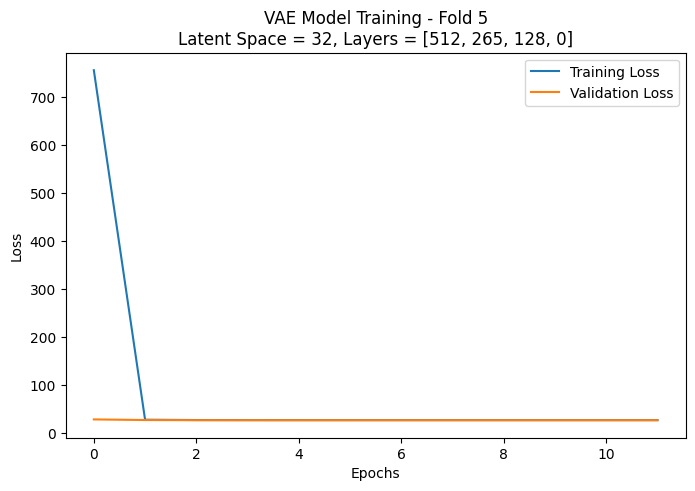

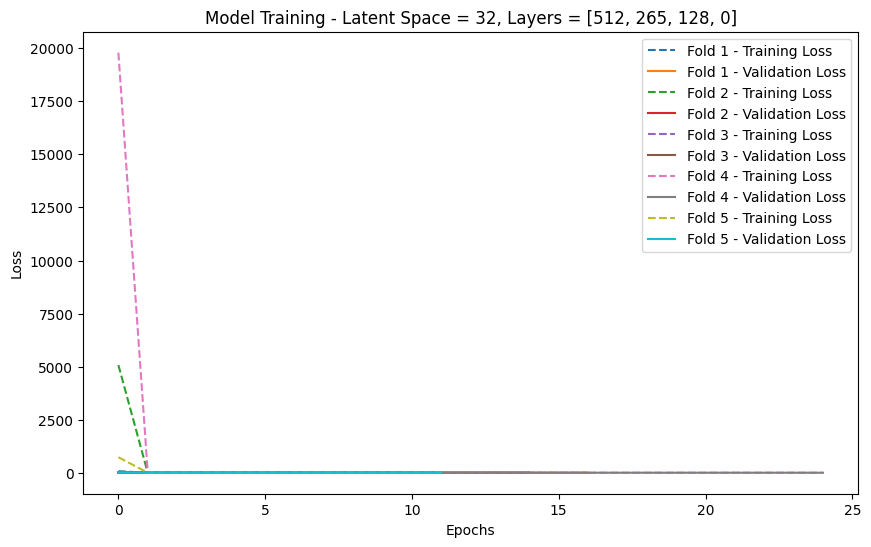

Average Validation Loss: 26.571296310424806
Testing configuration: Latent Space = 32, Layers = [128, 64, 0, 0]


Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ encoder_input             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_152 (Flatten)     │ (None, 12288)          │              0 │ encoder_input[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_148 (Dense)         │ (None, 128)            │      1,572,992 │ flatten_152[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 32), (None,    │      1,585,408 │ encoder_input[0][0]    │
│                           │ 32), (None, 32)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_149 (Dense)         │ (None, 64)             │          8,256 │ dense_148[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 64, 64, 3)      │      1,593,536 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 32)             │          2,080 │ dense_149[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 32)             │          2,080 │ dense_149[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vae_loss_layer_18         │ (None, 64, 64, 3)      │              0 │ encoder_input[0][0],   │
│ (VAELossLayer)            │                        │                │ decoder[0][0],         │
│                           │                        │                │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 3,178,944 (12.13 MB)

 Trainable params: 3,178,944 (12.13 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 9325.6934 - val_loss: 47.4218
Epoch 2/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 42.2779 - val_loss: 37.1820
Epoch 3/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 35.7240 - val_loss: 34.5647
Epoch 4/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 33.4224 - val_loss: 33.2265
Epoch 5/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 32.3557 - val_loss: 32.8161
Epoch 6/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 31.2262 - val_loss: 31.5427
Epoch 7/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 30.3872 - val_loss: 30.6885
Epoch 8/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 29.9290 - val_loss: 30.2392
Epoch 9/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 29.3443 - val_loss: 29.4937
Epoch 10/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 28.8924 - val_loss: 29.2826
Epoch 11/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 28.7979 - val_loss: 29.2806
Epoch 12/500
35

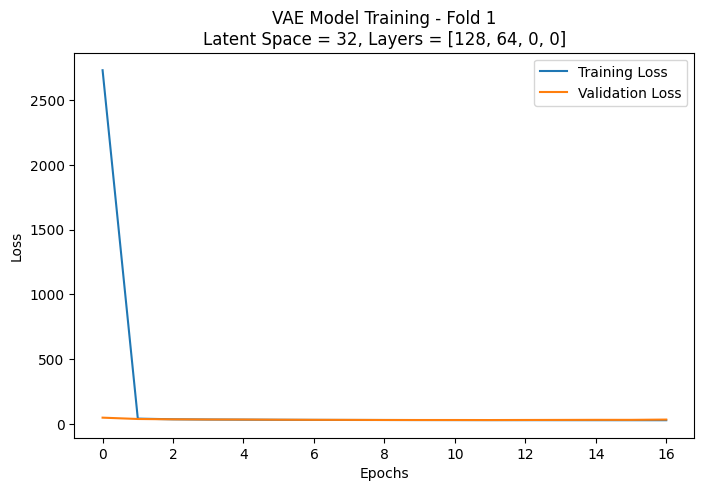

Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ encoder_input             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_161 (Flatten)     │ (None, 12288)          │              0 │ encoder_input[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_154 (Dense)         │ (None, 128)            │      1,572,992 │ flatten_161[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 32), (None,    │      1,585,408 │ encoder_input[0][0]    │
│                           │ 32), (None, 32)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_155 (Dense)         │ (None, 64)             │          8,256 │ dense_154[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 64, 64, 3)      │      1,593,536 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 32)             │          2,080 │ dense_155[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 32)             │          2,080 │ dense_155[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vae_loss_layer_19         │ (None, 64, 64, 3)      │              0 │ encoder_input[0][0],   │
│ (VAELossLayer)            │                        │                │ decoder[0][0],         │
│                           │                        │                │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 3,178,944 (12.13 MB)

 Trainable params: 3,178,944 (12.13 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 13s 16ms/step - loss: nan - val_loss: nan
Epoch 2/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: nan - val_loss: nan
Epoch 3/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: nan - val_loss: nan
Epoch 4/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: nan - val_loss: nan
Epoch 5/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: nan - val_loss: nan
Epoch 5: early stopping
Restoring model weights from the end of the best epoch: 1.


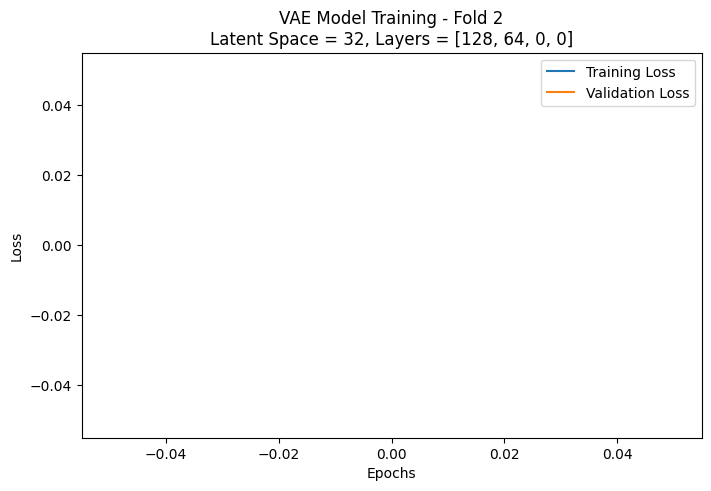

Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ encoder_input             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_170 (Flatten)     │ (None, 12288)          │              0 │ encoder_input[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_160 (Dense)         │ (None, 128)            │      1,572,992 │ flatten_170[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 32), (None,    │      1,585,408 │ encoder_input[0][0]    │
│                           │ 32), (None, 32)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_161 (Dense)         │ (None, 64)             │          8,256 │ dense_160[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 64, 64, 3)      │      1,593,536 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 32)             │          2,080 │ dense_161[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 32)             │          2,080 │ dense_161[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vae_loss_layer_20         │ (None, 64, 64, 3)      │              0 │ encoder_input[0][0],   │
│ (VAELossLayer)            │                        │                │ decoder[0][0],         │
│                           │                        │                │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 3,178,944 (12.13 MB)

 Trainable params: 3,178,944 (12.13 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 12s 17ms/step - loss: 224865904.0000 - val_loss: 118.1537
Epoch 2/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 60.0017 - val_loss: 48.8889
Epoch 3/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 46.2603 - val_loss: 43.7109
Epoch 4/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 41.7256 - val_loss: 41.1478
Epoch 5/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 39.3784 - val_loss: 39.6392
Epoch 6/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 38.0611 - val_loss: 38.4965
Epoch 7/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 37.2874 - val_loss: 37.4941
Epoch 8/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 36.4669 - val_loss: 36.3659
Epoch 9/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 35.6362 - val_loss: 35.7120
Epoch 10/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 35.1184 - val_loss: 34.9084
Epoch 11/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 34.5103 - val_loss: 34.1935
Epoch 12/

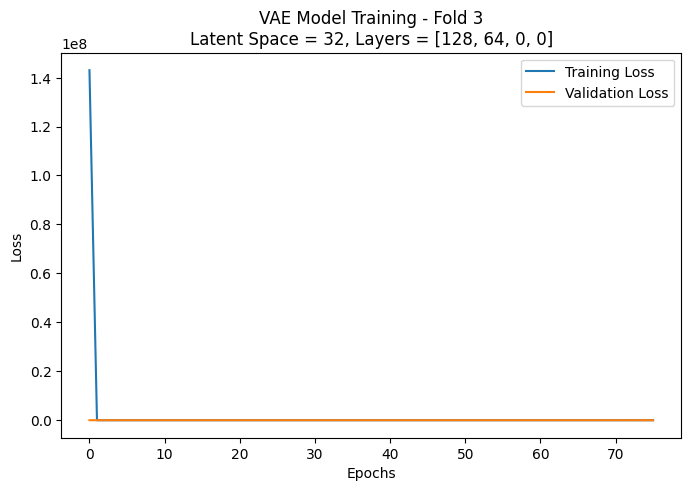

Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ encoder_input             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_179 (Flatten)     │ (None, 12288)          │              0 │ encoder_input[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_166 (Dense)         │ (None, 128)            │      1,572,992 │ flatten_179[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 32), (None,    │      1,585,408 │ encoder_input[0][0]    │
│                           │ 32), (None, 32)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_167 (Dense)         │ (None, 64)             │          8,256 │ dense_166[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 64, 64, 3)      │      1,593,536 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 32)             │          2,080 │ dense_167[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 32)             │          2,080 │ dense_167[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vae_loss_layer_21         │ (None, 64, 64, 3)      │              0 │ encoder_input[0][0],   │
│ (VAELossLayer)            │                        │                │ decoder[0][0],         │
│                           │                        │                │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 3,178,944 (12.13 MB)

 Trainable params: 3,178,944 (12.13 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 9s 13ms/step - loss: 4079.6538 - val_loss: 36.6596
Epoch 2/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 33.4145 - val_loss: 31.6716
Epoch 3/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 30.4740 - val_loss: 30.0086
Epoch 4/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 29.2181 - val_loss: 29.1840
Epoch 5/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 28.6419 - val_loss: 28.6678
Epoch 6/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 28.1585 - val_loss: 28.3275
Epoch 7/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 27.9029 - val_loss: 28.0594
Epoch 8/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 27.6571 - val_loss: 27.8373
Epoch 9/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 27.6107 - val_loss: 27.6581
Epoch 10/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 27.2325 - val_loss: 27.5155
Epoch 11/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 27.2865 - val_loss: 27.4016
Epoch 12/500
355

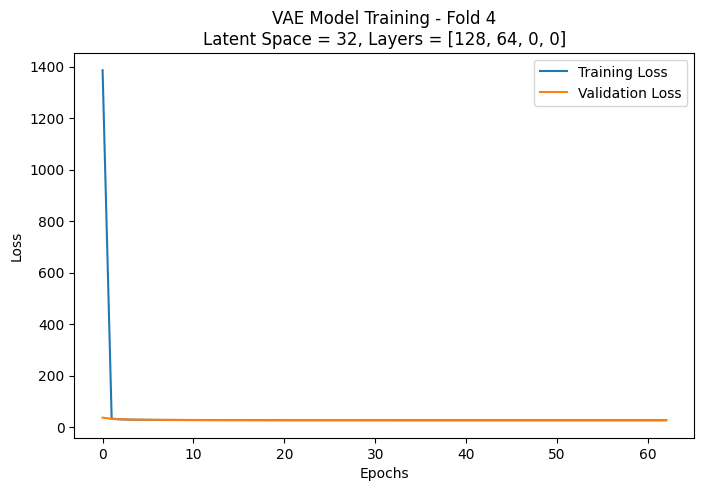

Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ encoder_input             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_188 (Flatten)     │ (None, 12288)          │              0 │ encoder_input[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_172 (Dense)         │ (None, 128)            │      1,572,992 │ flatten_188[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 32), (None,    │      1,585,408 │ encoder_input[0][0]    │
│                           │ 32), (None, 32)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_173 (Dense)         │ (None, 64)             │          8,256 │ dense_172[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 64, 64, 3)      │      1,593,536 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 32)             │          2,080 │ dense_173[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 32)             │          2,080 │ dense_173[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ vae_loss_layer_22         │ (None, 64, 64, 3)      │              0 │ encoder_input[0][0],   │
│ (VAELossLayer)            │                        │                │ decoder[0][0],         │
│                           │                        │                │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 3,178,944 (12.13 MB)

 Trainable params: 3,178,944 (12.13 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - loss: 8761.7666 - val_loss: 51.4410
Epoch 2/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 130543116288.0000 - val_loss: 1918.5939
Epoch 3/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 591034.4375 - val_loss: 1707.8019
Epoch 4/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 3065.5686 - val_loss: 3671.0671
Epoch 5/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 497646.9688 - val_loss: 53979.3711
Epoch 6/500
355/355 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 12349.1426 - val_loss: 364.7613
Epoch 6: early stopping
Restoring model weights from the end of the best epoch: 1.


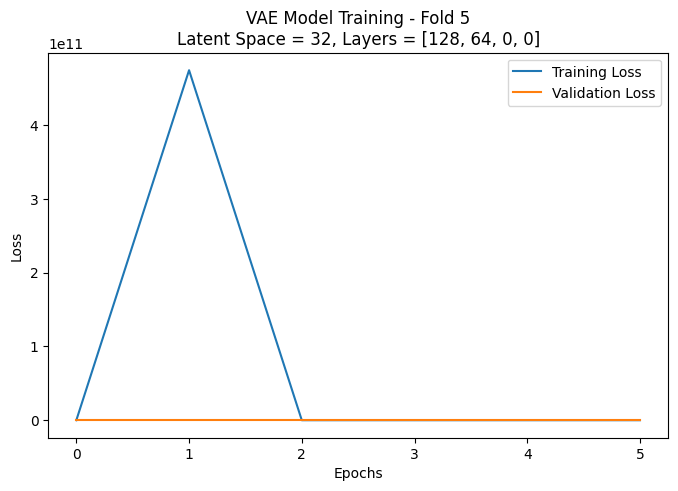

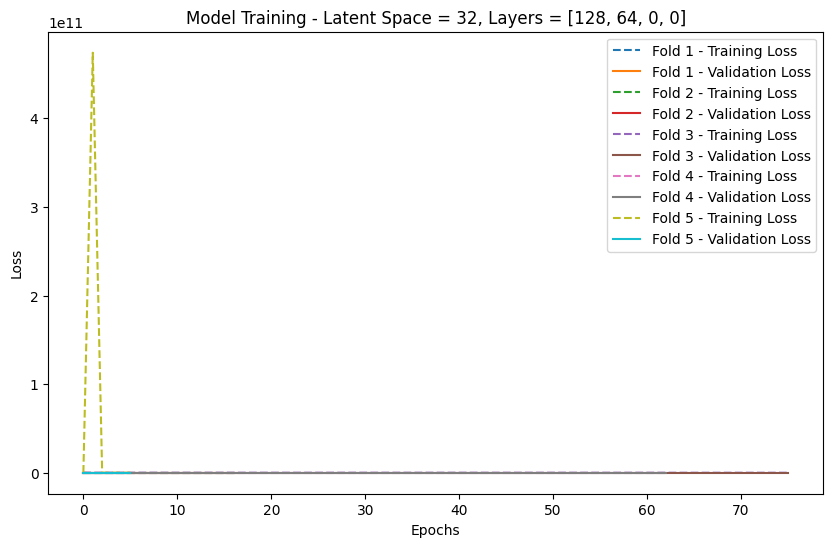

Average Validation Loss: 112.74618577957153
Cross-validation results: {(32, (512, 256, 128, 64)): 13.920614624023438, (32, (256, 128, 64, 0)): 26.571109008789062, (32, (512, 265, 128, 0)): 26.571296310424806, (32, (128, 64, 0, 0)): 112.74618577957153}


In [ ]:
# Example data and hyperparameters  # Example data, replace with actual data
latent_dim_options = [32]
layer_nodes_options =  [[512, 256, 128, 64] , [256, 128, 64, 0] , [512, 265, 128, 0] , [128,64,0,0]]

# Run cross-validation
results = VAE_cross_validate_model(TrainingImages, latent_dim_options, layer_nodes_options)
print("Cross-validation results:", results)


## CAE AutoEncoder Cross Validation










In [ ]:
# Define K-Fold parameters
n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

In [ ]:
def CAE_create_model(input_shape, latent_space_size, num_layers):
    """
    Function to create a Convolutional Autoencoder (CAE).
    Args:
        input_shape (tuple): Shape of the input image.
        latent_space_size (int): Size of the latent space.
        num_layers (int): Total number of encoder/decoder layers.

    Returns:
        model (tf.keras.Model): Compiled CAE model.
    """
    CAE_input = tf.keras.Input(shape=input_shape)

    # Encoder
    x = CAE_input
    for i in range(num_layers // 2):
        filters = latent_space_size * (2 ** i)
        x = tf.keras.layers.Conv2D(filters, (3, 3), activation='elu', padding='same')(x)
        x = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)

    # Latent space
    latent = tf.keras.layers.Conv2D(latent_space_size, (3, 3), activation='elu', padding='same')(x)

    # Decoder
    x = latent
    for i in range(num_layers // 2 - 1, -1, -1):
        filters = latent_space_size * (2 ** i)
        x = tf.keras.layers.Conv2D(filters, (3, 3), activation='elu', padding='same')(x)
        x = tf.keras.layers.UpSampling2D((2, 2))(x)

    CAE_output = tf.keras.layers.Conv2D(input_shape[-1], (3, 3), activation='linear', padding='same')(x)

    # Create the model
    model = tf.keras.Model(inputs=CAE_input, outputs=CAE_output)
    model.compile(optimizer='adam', loss='mse')
    return model

In [ ]:
def CAE_cross_validate_model(X, input_shape, latent_space_sizes, num_layers_options, k_folds=5, epochs=10, batch_size=32):
    """
    Perform cross-validation on the CAE model.

    Args:
        X (numpy.ndarray): Input data for training and validation.
        input_shape (tuple): Shape of the input images.
        latent_space_sizes (list): List of latent space sizes to test.
        num_layers_options (list): List of numbers of layers to test.
        k_folds (int): Number of folds for cross-validation.
        epochs (int): Number of epochs for training.
        batch_size (int): Batch size for training.

    Returns:
        dict: Dictionary containing the average validation loss for each configuration.
    """
    results = {}

    for latent_space_size in latent_space_sizes:
        for num_layers in num_layers_options:
            fold_val_losses = []
            all_train_losses = []
            all_val_losses = []
            print(f"\nTesting configuration: Latent Space = {latent_space_size}, Layers = {num_layers}")

            for fold, (train_index, val_index) in enumerate(kf.split(X)):
                print(f"\nTraining fold {fold + 1}/{k_folds}...")

                # Split data
                X_train, X_val = X[train_index], X[val_index]

                # Create the model
                model = CAE_create_model(input_shape, latent_space_size, num_layers)

                # Train the model
                history = model.fit(
                    X_train, X_train,
                    epochs=epochs,
                    batch_size=batch_size,
                    validation_data=(X_val, X_val),
                    verbose=1
                )


                # Record the validation loss for the last epoch
                fold_val_losses.append(history.history['val_loss'][-1])

                # Plot training and validation loss for this fold
                plt.figure(figsize=(8, 5))
                plt.plot(history.history['loss'], label='Training Loss')
                plt.plot(history.history['val_loss'], label='Validation Loss')
                plt.title(f'Model Training - Fold {fold + 1}\nLatent Space = {latent_space_size}, Layers = {num_layers}')
                plt.xlabel('Epochs')
                plt.ylabel('Loss')
                plt.legend()
                plt.grid()
                plt.show()


            # Average the losses across folds
            avg_val_loss = np.mean(fold_val_losses)
            results[(latent_space_size, num_layers)] = avg_val_loss

            print(f"Average Validation Loss for Latent Space = {latent_space_size}, Layers = {num_layers}: {avg_val_loss:.4f}")

    return results

Training dataset shape: (1000, 64, 64, 3)

Testing configuration: Latent Space = 32, Layers = 4

Training fold 1/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 176ms/step - loss: 0.2565 - val_loss: 0.1033
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0980 - val_loss: 0.0904
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0890 - val_loss: 0.0864
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0859 - val_loss: 0.0848
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0845 - val_loss: 0.0840
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0838 - val_loss: 0.0834
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0832 - val_loss: 0.0831
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0829 - val_loss: 0.0826
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0827 - val_loss: 0.0823
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0822 - val_loss: 0.0820


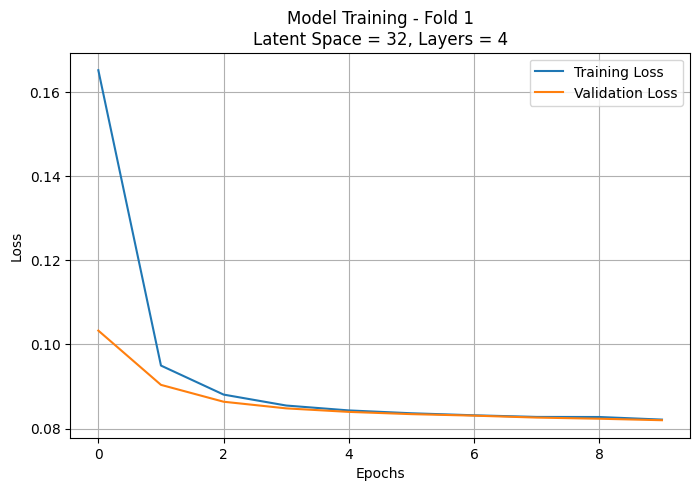


Training fold 2/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.2153 - val_loss: 0.1038
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0982 - val_loss: 0.0910
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0893 - val_loss: 0.0855
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0849 - val_loss: 0.0838
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0836 - val_loss: 0.0832
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0831 - val_loss: 0.0826
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0826 - val_loss: 0.0823
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0828 - val_loss: 0.0822
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0820 - val_loss: 0.0816
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0815 - val_loss: 0.0813


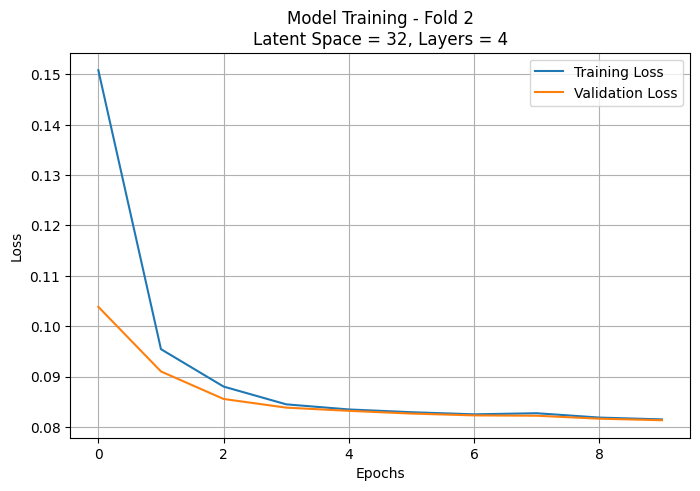


Training fold 3/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.2146 - val_loss: 0.0958
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0928 - val_loss: 0.0878
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0869 - val_loss: 0.0852
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0849 - val_loss: 0.0842
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0839 - val_loss: 0.0836
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0834 - val_loss: 0.0831
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0829 - val_loss: 0.0829
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0826 - val_loss: 0.0825
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0823 - val_loss: 0.0821
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0819 - val_loss: 0.0818


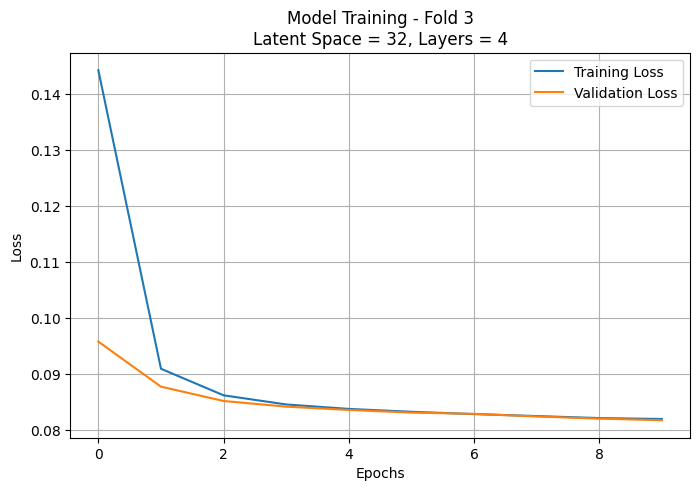


Training fold 4/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - loss: 0.1781 - val_loss: 0.0968
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0927 - val_loss: 0.0868
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0858 - val_loss: 0.0841
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0840 - val_loss: 0.0832
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0831 - val_loss: 0.0828
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0826 - val_loss: 0.0822
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0821 - val_loss: 0.0817
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0817 - val_loss: 0.0815
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0814 - val_loss: 0.0813
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0812 - val_loss: 0.0808


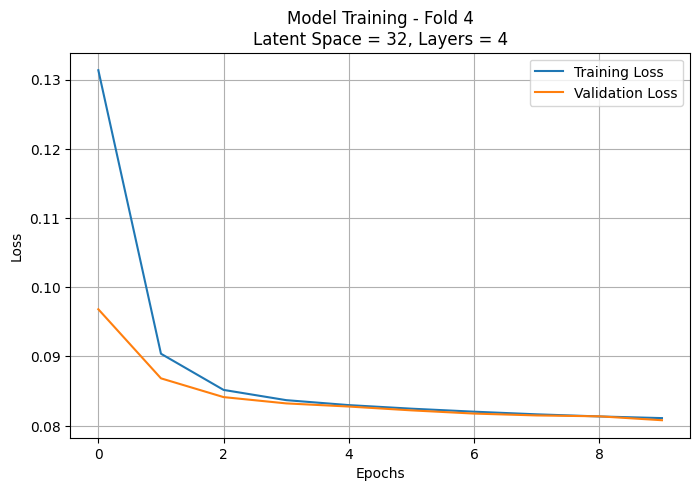


Training fold 5/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1634 - val_loss: 0.0898
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0885 - val_loss: 0.0844
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0843 - val_loss: 0.0835
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0834 - val_loss: 0.0829
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0827 - val_loss: 0.0823
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0822 - val_loss: 0.0818
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0816 - val_loss: 0.0813
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0812 - val_loss: 0.0808
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0807 - val_loss: 0.0804
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0804 - val_loss: 0.0801


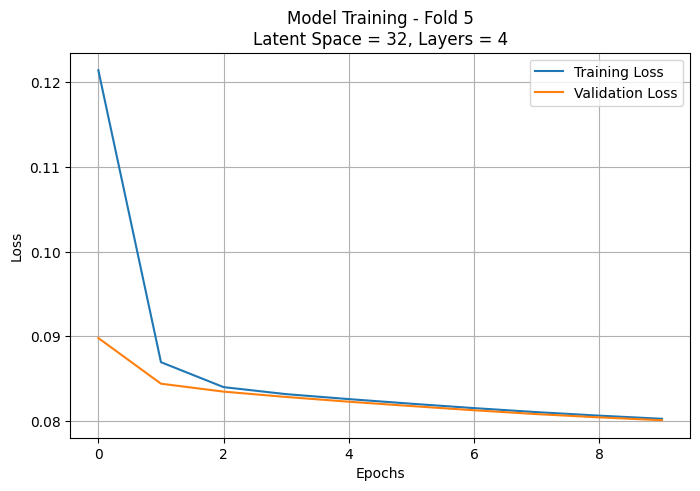

Average Validation Loss for Latent Space = 32, Layers = 4: 0.0812

Testing configuration: Latent Space = 32, Layers = 6

Training fold 1/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - loss: 0.2875 - val_loss: 0.0980
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0961 - val_loss: 0.0869
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0864 - val_loss: 0.0850
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0849 - val_loss: 0.0845
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0845 - val_loss: 0.0843
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0843 - val_loss: 0.0842
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0841 - val_loss: 0.0841
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0840 - val_loss: 0.0841
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0840 - val_loss: 0.0839
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0839 - val_loss: 0.0838


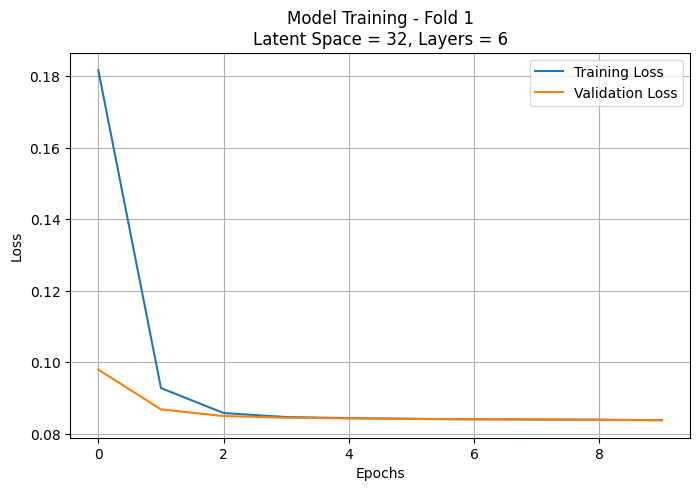


Training fold 2/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step - loss: 0.4609 - val_loss: 0.1003
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0941 - val_loss: 0.0870
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0864 - val_loss: 0.0854
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0852 - val_loss: 0.0850
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0849 - val_loss: 0.0846
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0846 - val_loss: 0.0844
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0845 - val_loss: 0.0843
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0848 - val_loss: 0.0842
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0843 - val_loss: 0.0841
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0841 - val_loss: 0.0841


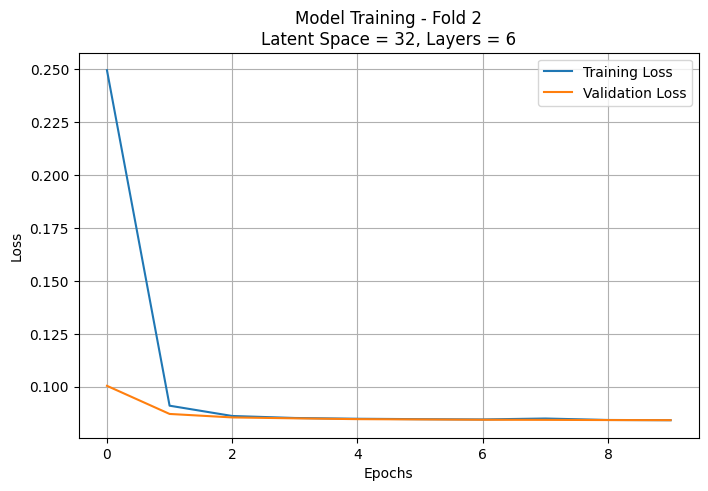


Training fold 3/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.3924 - val_loss: 0.1006
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0949 - val_loss: 0.0881
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0875 - val_loss: 0.0861
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0858 - val_loss: 0.0853
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0851 - val_loss: 0.0848
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0848 - val_loss: 0.0846
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0845 - val_loss: 0.0844
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0844 - val_loss: 0.0843
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0842 - val_loss: 0.0841
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0849 - val_loss: 0.0841


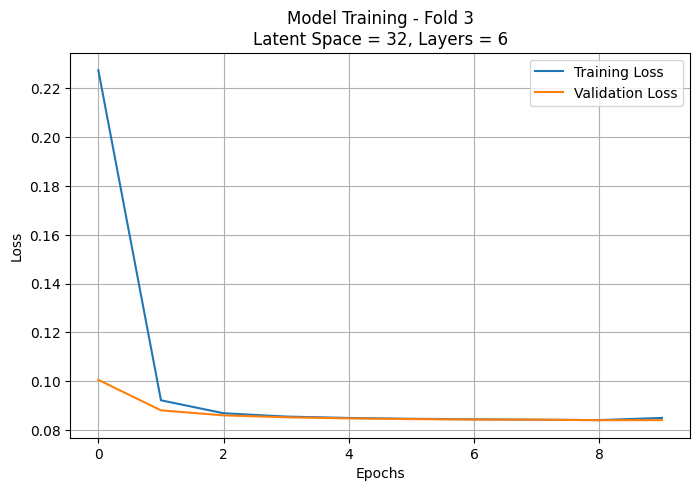


Training fold 4/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.3769 - val_loss: 0.0947
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0908 - val_loss: 0.0863
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0858 - val_loss: 0.0849
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0848 - val_loss: 0.0844
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0847 - val_loss: 0.0845
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0844 - val_loss: 0.0840
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0840 - val_loss: 0.0840
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0840 - val_loss: 0.0838
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0842 - val_loss: 0.0839
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0838 - val_loss: 0.0838


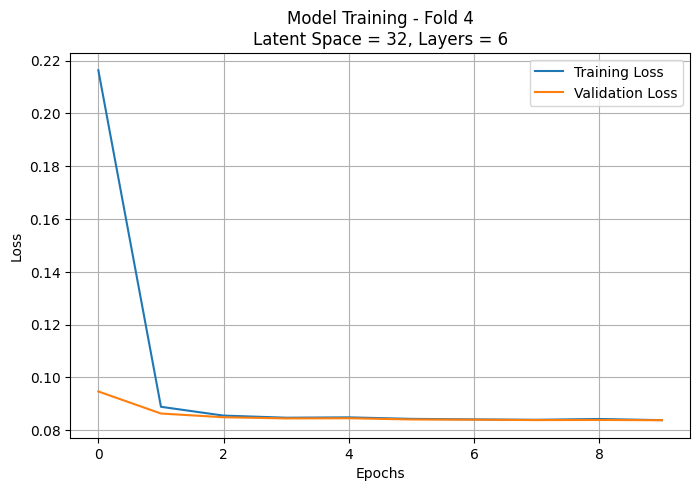


Training fold 5/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.3329 - val_loss: 0.0972
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0934 - val_loss: 0.0869
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0862 - val_loss: 0.0851
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0850 - val_loss: 0.0847
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0846 - val_loss: 0.0845
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0844 - val_loss: 0.0843
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0842 - val_loss: 0.0842
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0842 - val_loss: 0.0843
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0842 - val_loss: 0.0840
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0840 - val_loss: 0.0839


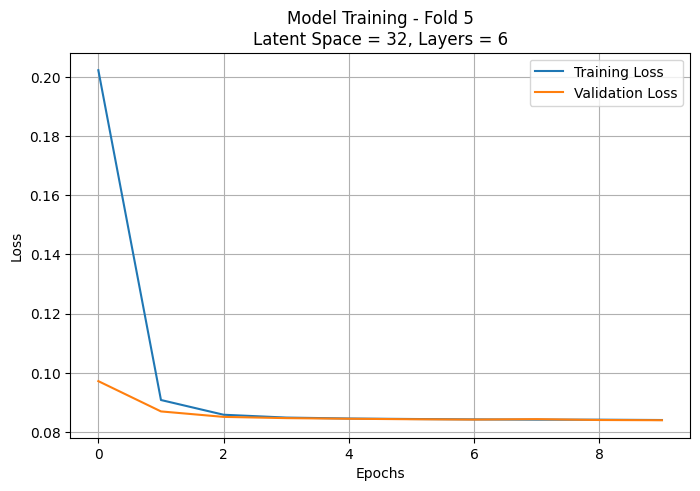

Average Validation Loss for Latent Space = 32, Layers = 6: 0.0840

Testing configuration: Latent Space = 32, Layers = 8

Training fold 1/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step - loss: 1.0877 - val_loss: 0.1232
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.1031 - val_loss: 0.0893
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0888 - val_loss: 0.0871
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0868 - val_loss: 0.0859
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0856 - val_loss: 0.0852
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0850 - val_loss: 0.0848
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0847 - val_loss: 0.0845
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0845 - val_loss: 0.0844
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0843 - val_loss: 0.0842
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0842 - val_loss: 0.0842


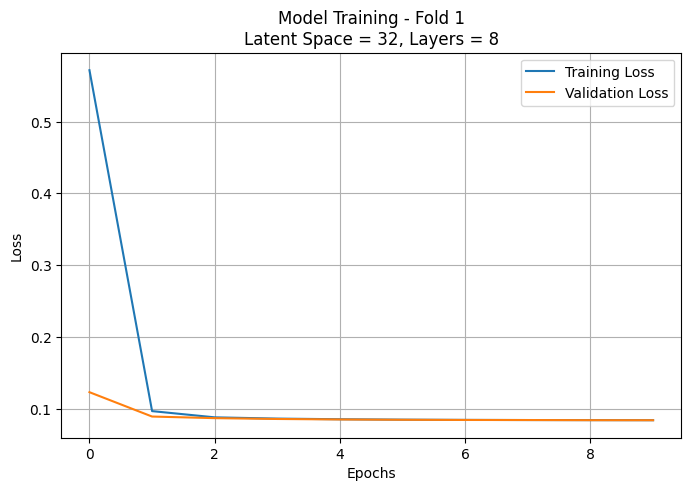


Training fold 2/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - loss: 0.4370 - val_loss: 0.0981
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0949 - val_loss: 0.0865
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0860 - val_loss: 0.0851
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0850 - val_loss: 0.0846
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0846 - val_loss: 0.0843
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0845 - val_loss: 0.0842
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0842 - val_loss: 0.0841
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0842 - val_loss: 0.0840
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0839 - val_loss: 0.0838
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0840 - val_loss: 0.0838


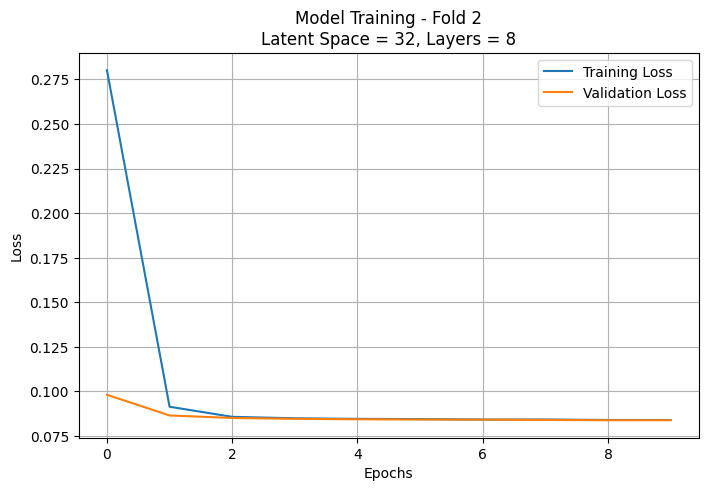


Training fold 3/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.6868 - val_loss: 0.1169
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.1006 - val_loss: 0.0881
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0873 - val_loss: 0.0856
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0853 - val_loss: 0.0849
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0848 - val_loss: 0.0846
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0845 - val_loss: 0.0844
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0843 - val_loss: 0.0843
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0842 - val_loss: 0.0842
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0841 - val_loss: 0.0840
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0840 - val_loss: 0.0840


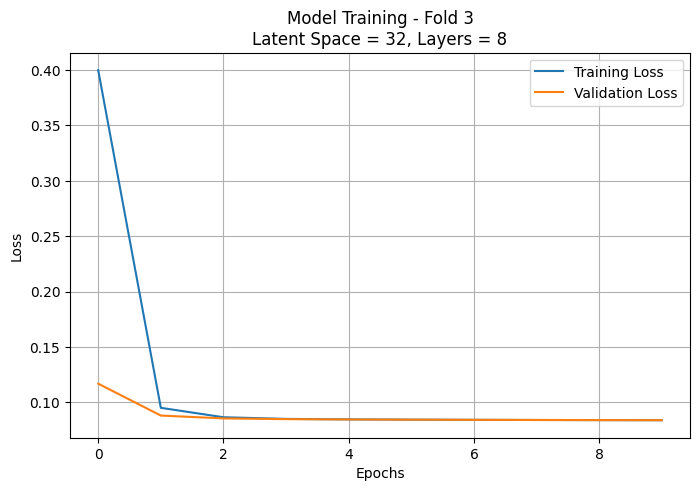


Training fold 4/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.9896 - val_loss: 0.1071
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0982 - val_loss: 0.0877
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0874 - val_loss: 0.0862
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0859 - val_loss: 0.0854
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0853 - val_loss: 0.0849
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0848 - val_loss: 0.0846
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0845 - val_loss: 0.0843
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0843 - val_loss: 0.0841
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0842 - val_loss: 0.0841
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0841 - val_loss: 0.0841


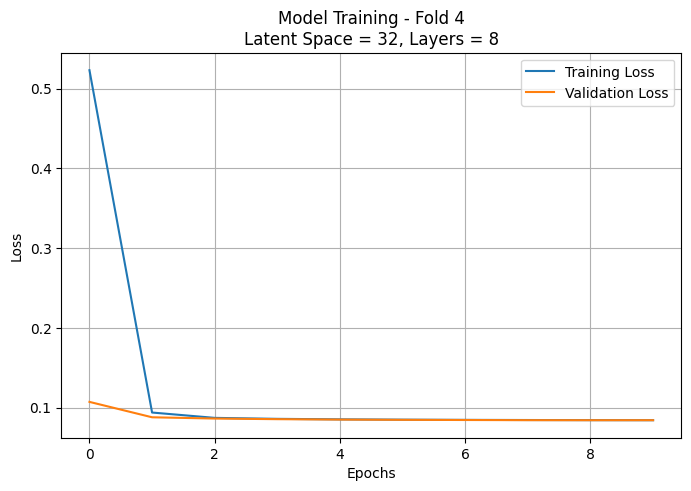


Training fold 5/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - loss: 0.8982 - val_loss: 0.1060
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0959 - val_loss: 0.0871
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0866 - val_loss: 0.0854
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0852 - val_loss: 0.0848
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0847 - val_loss: 0.0845
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0844 - val_loss: 0.0842
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0842 - val_loss: 0.0841
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0841 - val_loss: 0.0839
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0841 - val_loss: 0.0840
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0839 - val_loss: 0.0839


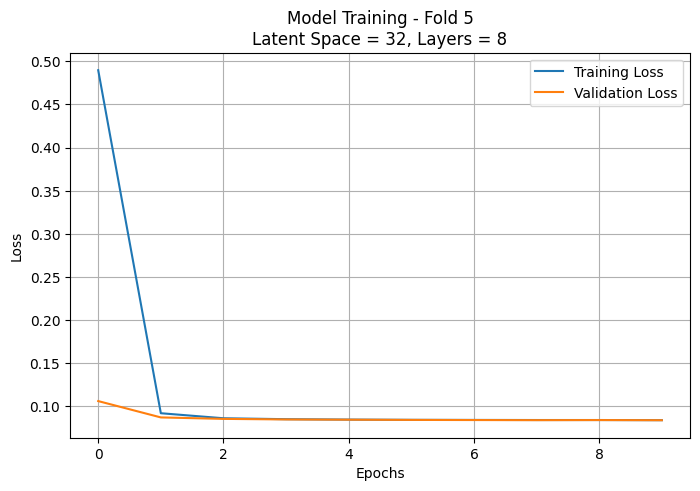

Average Validation Loss for Latent Space = 32, Layers = 8: 0.0840

Testing configuration: Latent Space = 64, Layers = 4

Training fold 1/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step - loss: 0.3523 - val_loss: 0.0938
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0910 - val_loss: 0.0848
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0863 - val_loss: 0.0852
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0843 - val_loss: 0.0832
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0829 - val_loss: 0.0826
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0824 - val_loss: 0.0821
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0820 - val_loss: 0.0817
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0815 - val_loss: 0.0813
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0812 - val_loss: 0.0808
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0808 - val_loss: 0.0805


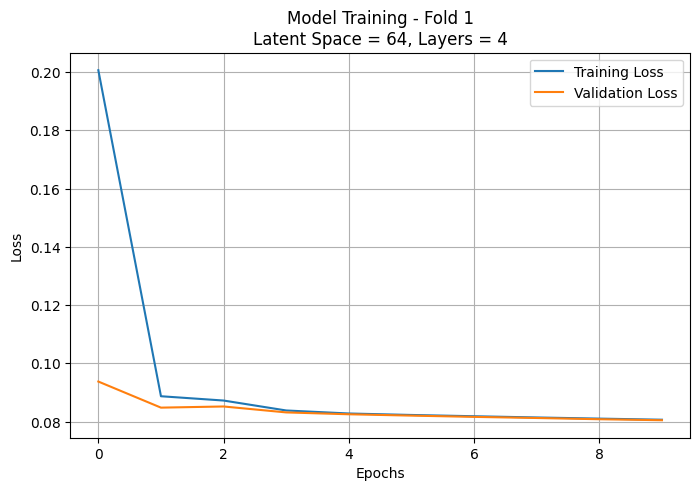


Training fold 2/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.3645 - val_loss: 0.0979
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0937 - val_loss: 0.0874
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0863 - val_loss: 0.0841
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0837 - val_loss: 0.0828
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0829 - val_loss: 0.0821
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0820 - val_loss: 0.0815
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0815 - val_loss: 0.0810
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0810 - val_loss: 0.0805
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0804 - val_loss: 0.0801
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0801 - val_loss: 0.0797


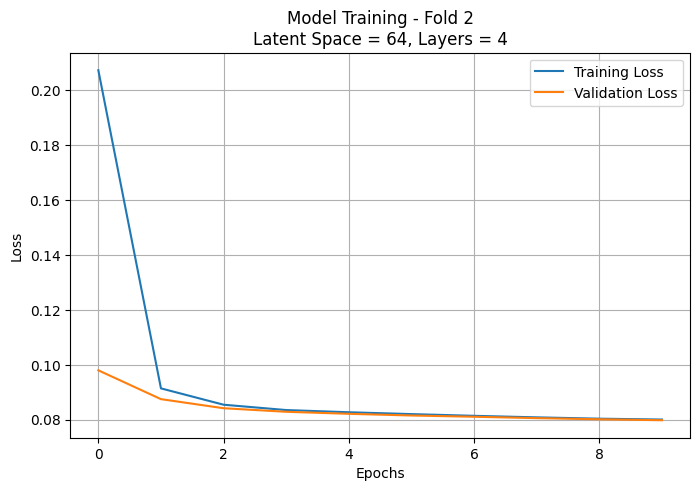


Training fold 3/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step - loss: 0.3282 - val_loss: 0.0947
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0935 - val_loss: 0.0881
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0902 - val_loss: 0.0846
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0839 - val_loss: 0.0829
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0826 - val_loss: 0.0822
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0820 - val_loss: 0.0817
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0815 - val_loss: 0.0812
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0810 - val_loss: 0.0807
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0805 - val_loss: 0.0811
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0804 - val_loss: 0.0799


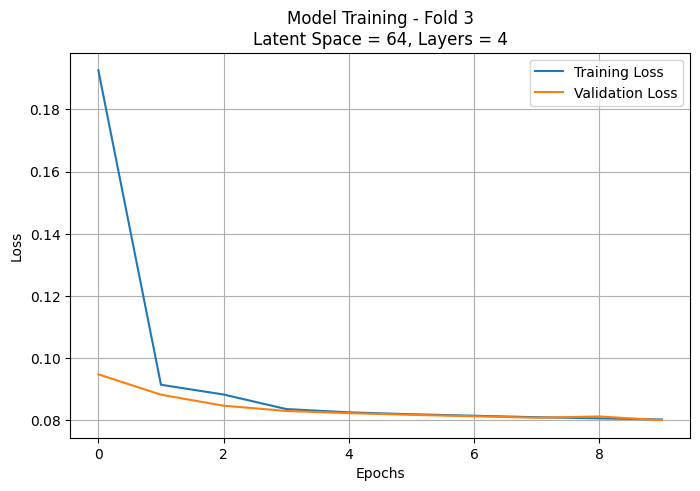


Training fold 4/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step - loss: 0.4548 - val_loss: 0.0942
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0908 - val_loss: 0.0862
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0857 - val_loss: 0.0841
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0840 - val_loss: 0.0834
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0833 - val_loss: 0.0830
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0830 - val_loss: 0.0825
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0824 - val_loss: 0.0831
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0826 - val_loss: 0.0820
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0817 - val_loss: 0.0812
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0811 - val_loss: 0.0808


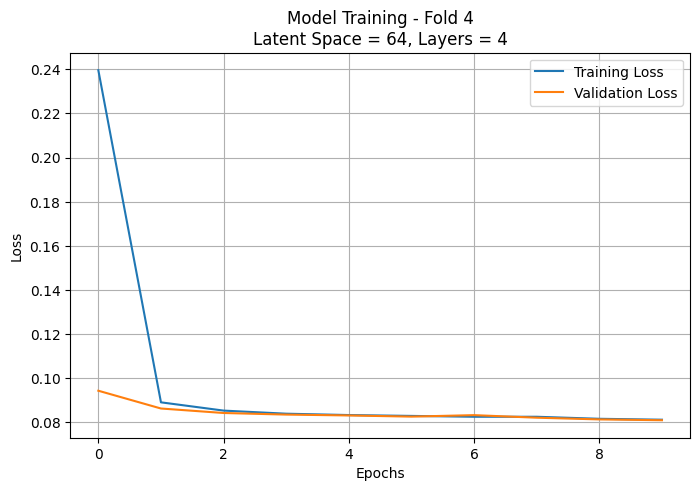


Training fold 5/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.2821 - val_loss: 0.0922
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0907 - val_loss: 0.0848
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0870 - val_loss: 0.0859
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0847 - val_loss: 0.0826
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0824 - val_loss: 0.0819
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0818 - val_loss: 0.0813
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0811 - val_loss: 0.0808
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0807 - val_loss: 0.0803
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0802 - val_loss: 0.0799
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0798 - val_loss: 0.0795


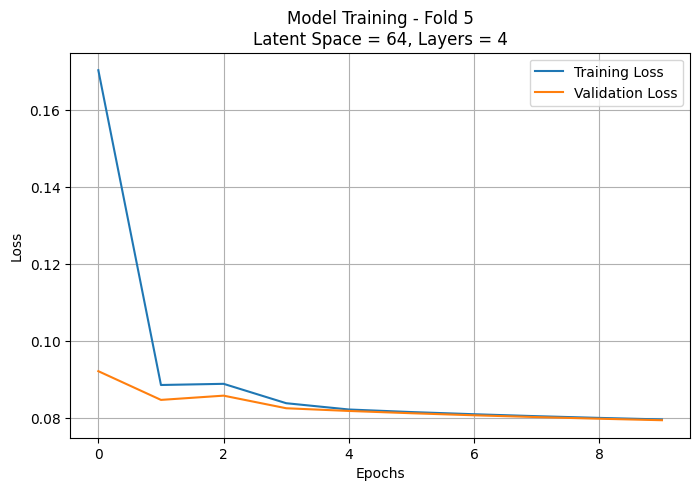

Average Validation Loss for Latent Space = 64, Layers = 4: 0.0801

Testing configuration: Latent Space = 64, Layers = 6

Training fold 1/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 1.4015 - val_loss: 0.1511
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1204 - val_loss: 0.0956
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0916 - val_loss: 0.0866
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0860 - val_loss: 0.0851
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0849 - val_loss: 0.0846
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0845 - val_loss: 0.0844
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0844 - val_loss: 0.0844
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0843 - val_loss: 0.0843
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0842 - val_loss: 0.0843
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0843 - val_loss: 0.0846


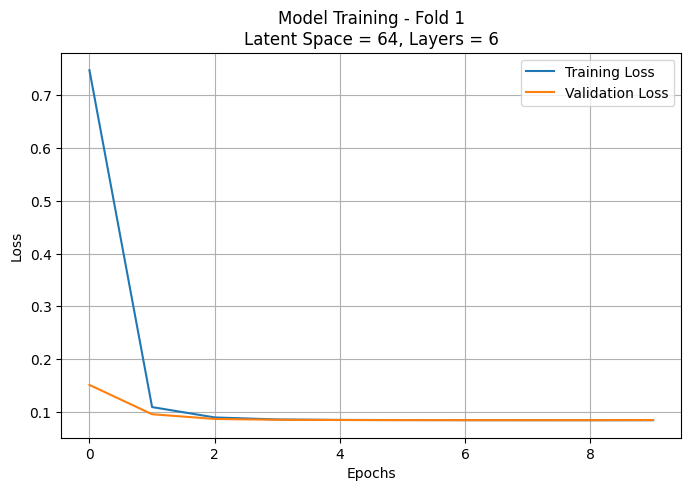


Training fold 2/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 1.7725 - val_loss: 0.1835
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1298 - val_loss: 0.0918
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0901 - val_loss: 0.0863
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0859 - val_loss: 0.0850
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0849 - val_loss: 0.0846
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0846 - val_loss: 0.0844
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0844 - val_loss: 0.0843
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0843 - val_loss: 0.0842
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0842 - val_loss: 0.0842
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0842 - val_loss: 0.0841


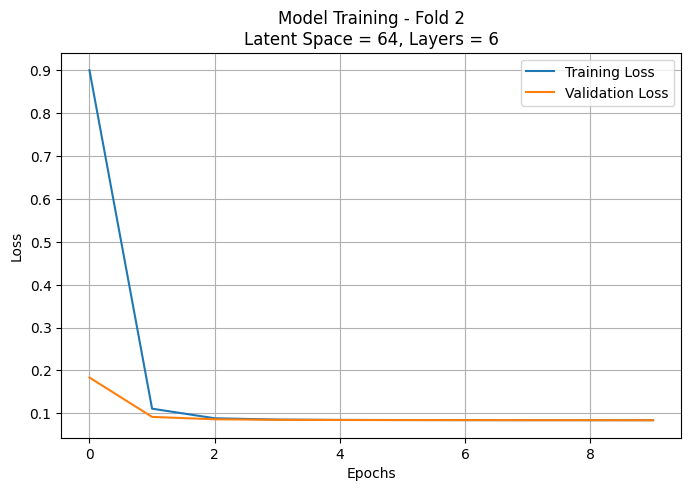


Training fold 3/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 2.6967 - val_loss: 0.1140
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1101 - val_loss: 0.0913
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0893 - val_loss: 0.0862
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0857 - val_loss: 0.0851
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0849 - val_loss: 0.0847
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0846 - val_loss: 0.0845
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0844 - val_loss: 0.0844
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0843 - val_loss: 0.0843
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0842 - val_loss: 0.0842
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0841 - val_loss: 0.0841


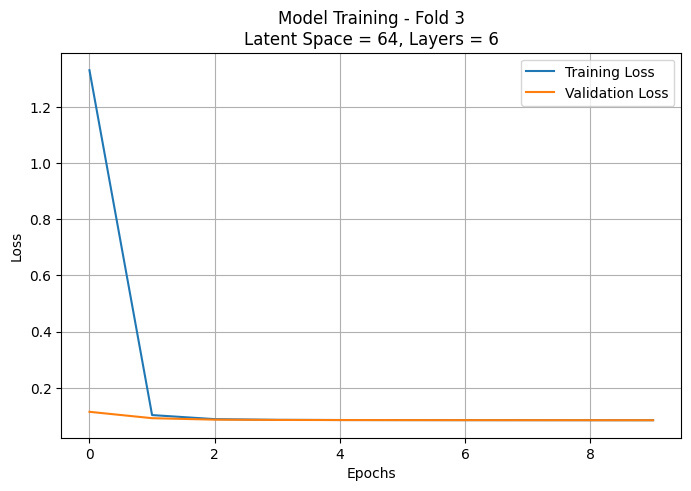


Training fold 4/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 1.5875 - val_loss: 0.1401
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1110 - val_loss: 0.0919
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0896 - val_loss: 0.0864
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0859 - val_loss: 0.0850
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0850 - val_loss: 0.0847
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0847 - val_loss: 0.0845
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0845 - val_loss: 0.0844
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0844 - val_loss: 0.0843
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0843 - val_loss: 0.0842
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0843 - val_loss: 0.0841


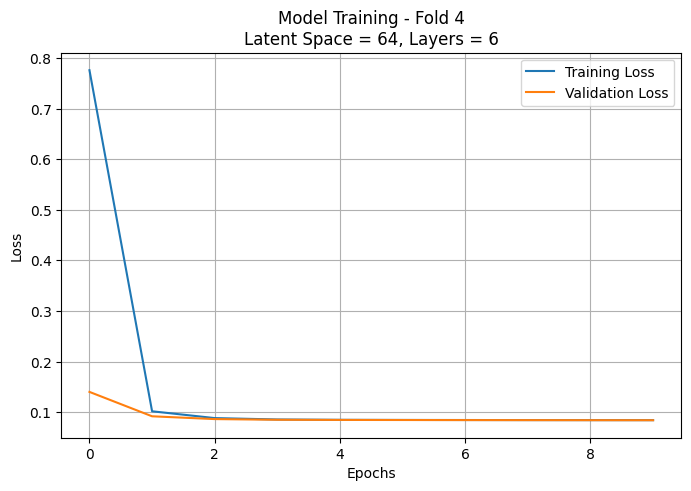


Training fold 5/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 1.4650 - val_loss: 0.1545
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.1365 - val_loss: 0.0930
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0897 - val_loss: 0.0860
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0858 - val_loss: 0.0852
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0851 - val_loss: 0.0849
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0848 - val_loss: 0.0847
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0846 - val_loss: 0.0845
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0845 - val_loss: 0.0844
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0844 - val_loss: 0.0843
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0843 - val_loss: 0.0842


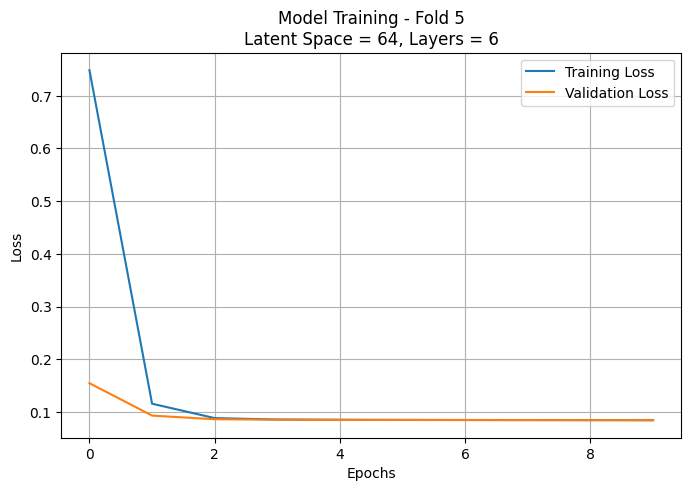

Average Validation Loss for Latent Space = 64, Layers = 6: 0.0842

Testing configuration: Latent Space = 64, Layers = 8

Training fold 1/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 14.9895 - val_loss: 0.9935
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 1.2306 - val_loss: 0.1132
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1226 - val_loss: 0.0944
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0919 - val_loss: 0.0887
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0884 - val_loss: 0.0873
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0871 - val_loss: 0.0865
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0863 - val_loss: 0.0859
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0858 - val_loss: 0.0855
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0854 - val_loss: 0.0851
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0851 - val_loss: 0.0849


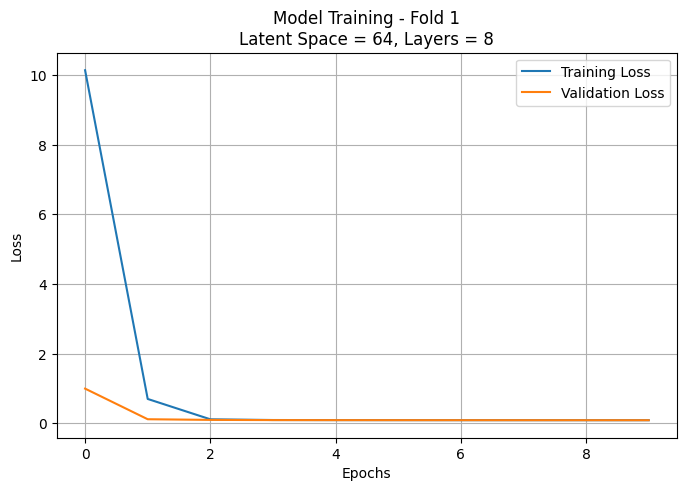


Training fold 2/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 15.6234 - val_loss: 0.6826
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.3698 - val_loss: 0.1193
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1118 - val_loss: 0.0969
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0959 - val_loss: 0.0918
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0911 - val_loss: 0.0894
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0890 - val_loss: 0.0880
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0878 - val_loss: 0.0879
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0870 - val_loss: 0.0862
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0866 - val_loss: 0.0861
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0860 - val_loss: 0.0859


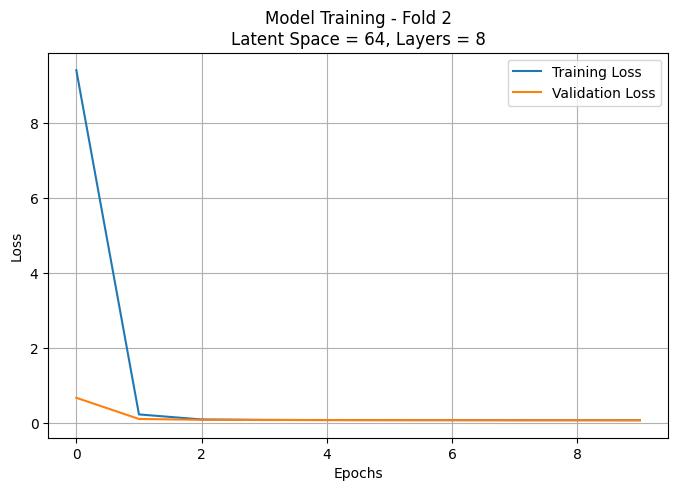


Training fold 3/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 9.3536 - val_loss: 0.2822
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.3312 - val_loss: 0.1308
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1280 - val_loss: 0.0990
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0963 - val_loss: 0.0913
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0905 - val_loss: 0.0889
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0885 - val_loss: 0.0878
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0874 - val_loss: 0.0870
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0868 - val_loss: 0.0864
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0862 - val_loss: 0.0860
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0859 - val_loss: 0.0857


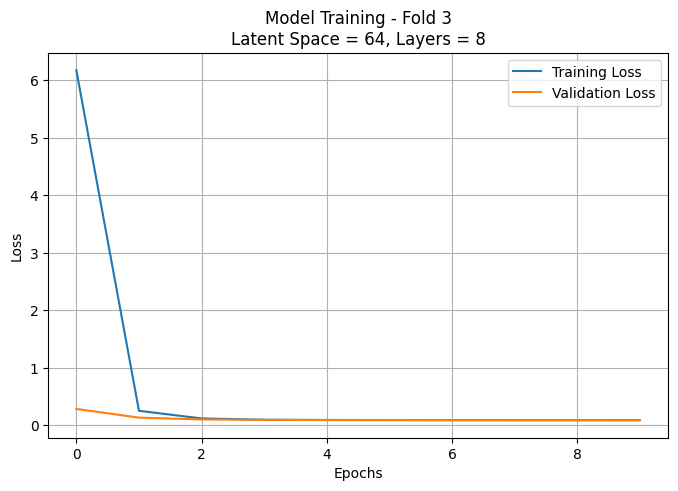


Training fold 4/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 7.4738 - val_loss: 0.4827
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.3132 - val_loss: 0.1045
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1017 - val_loss: 0.0921
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0908 - val_loss: 0.0886
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0881 - val_loss: 0.0871
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0868 - val_loss: 0.0862
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0861 - val_loss: 0.0857
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0856 - val_loss: 0.0853
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0852 - val_loss: 0.0850
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0850 - val_loss: 0.0848


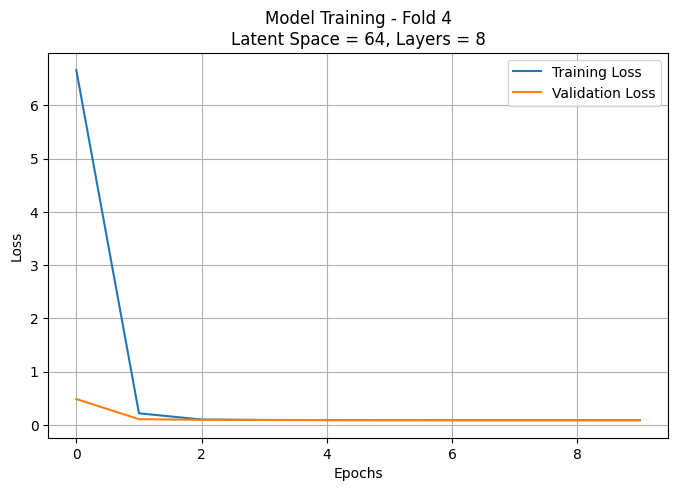


Training fold 5/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 7.4543 - val_loss: 0.4256
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 11.8975 - val_loss: 0.6682
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.3867 - val_loss: 0.1154
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1102 - val_loss: 0.0974
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0958 - val_loss: 0.0923
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0917 - val_loss: 0.0899
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0895 - val_loss: 0.0885
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0882 - val_loss: 0.0875
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0874 - val_loss: 0.0869
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0867 - val_loss: 0.0864


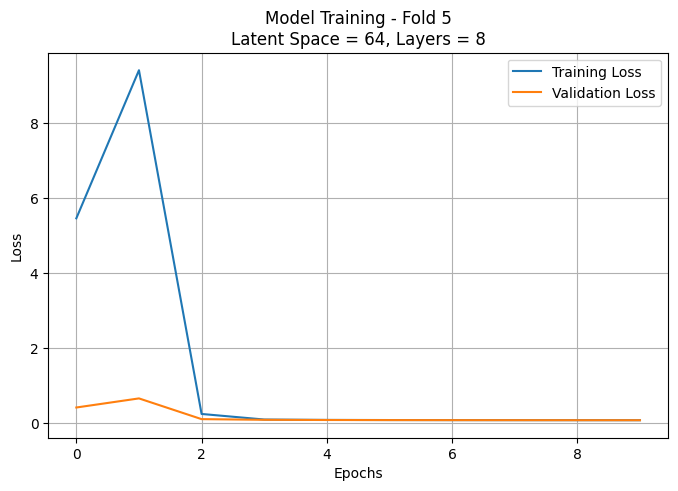

Average Validation Loss for Latent Space = 64, Layers = 8: 0.0855

Testing configuration: Latent Space = 128, Layers = 4

Training fold 1/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 2.4908 - val_loss: 0.3596
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.2060 - val_loss: 0.1000
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0958 - val_loss: 0.0890
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0879 - val_loss: 0.0857
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0853 - val_loss: 0.0845
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0843 - val_loss: 0.0839
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0837 - val_loss: 0.0835
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0834 - val_loss: 0.0831
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0830 - val_loss: 0.0829
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0827 - val_loss: 0.0829


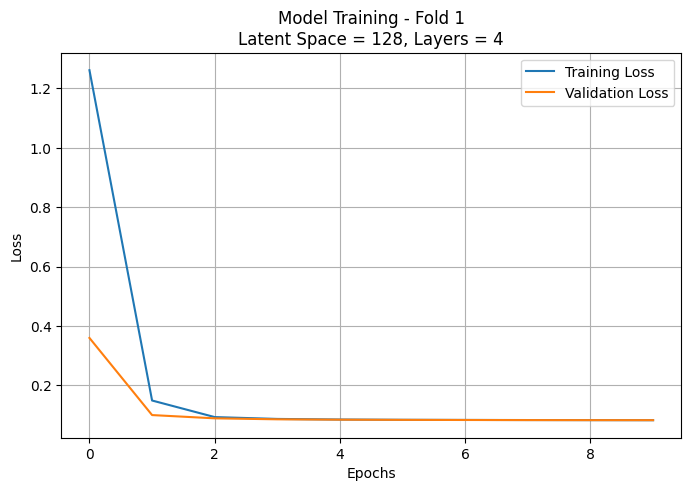


Training fold 2/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 2.4888 - val_loss: 0.1524
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1246 - val_loss: 0.0951
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0944 - val_loss: 0.0892
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0884 - val_loss: 0.0862
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0858 - val_loss: 0.0848
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0846 - val_loss: 0.0840
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0839 - val_loss: 0.0835
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0835 - val_loss: 0.0842
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0867 - val_loss: 0.0829
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0830 - val_loss: 0.0826


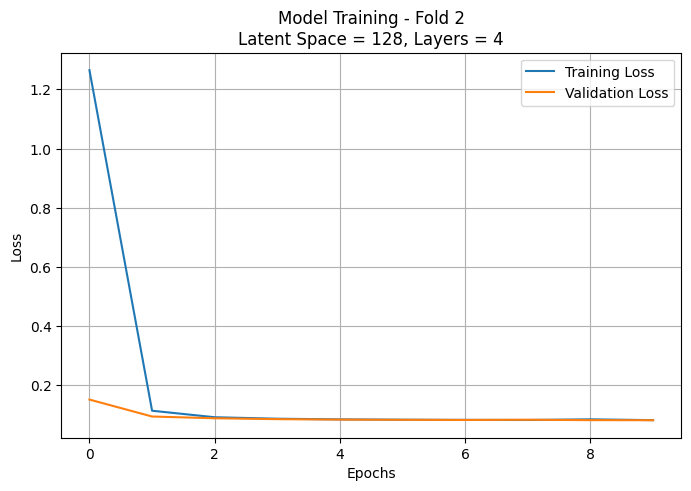


Training fold 3/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 2.0676 - val_loss: 0.1221
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1179 - val_loss: 0.0983
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0944 - val_loss: 0.0885
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0872 - val_loss: 0.0846
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0847 - val_loss: 0.0845
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0840 - val_loss: 0.0833
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0830 - val_loss: 0.0827
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0827 - val_loss: 0.0826
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0824 - val_loss: 0.0822
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0824 - val_loss: 0.0820


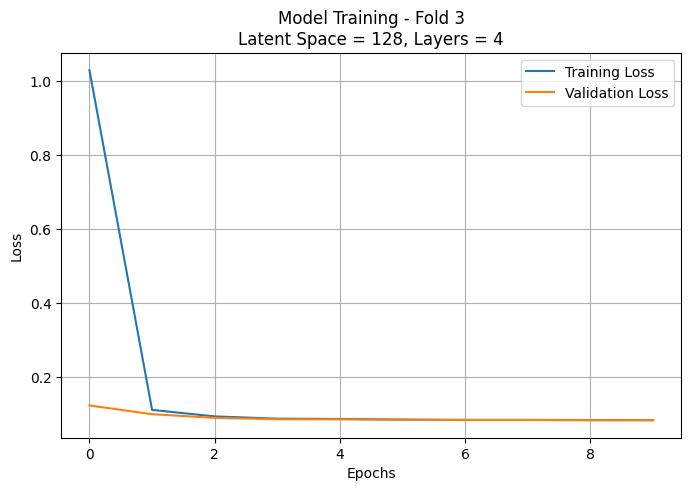


Training fold 4/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 2.6285 - val_loss: 0.1843
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1344 - val_loss: 0.1000
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0981 - val_loss: 0.0930
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0921 - val_loss: 0.0896
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0890 - val_loss: 0.0867
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0863 - val_loss: 0.0847
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0845 - val_loss: 0.0836
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0836 - val_loss: 0.0830
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0829 - val_loss: 0.0825
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0825 - val_loss: 0.0821


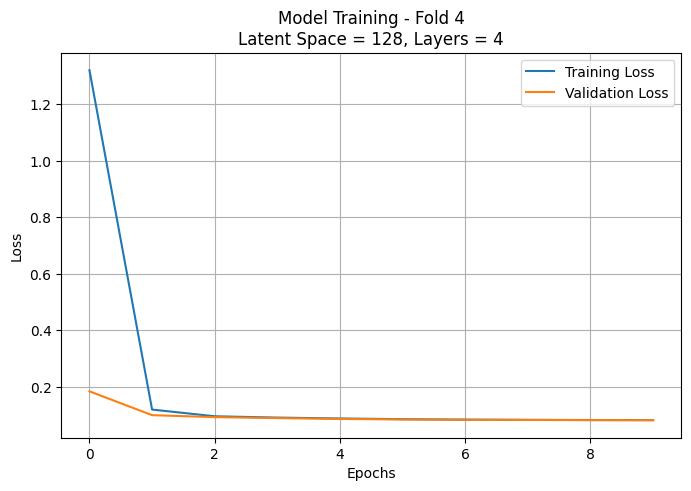


Training fold 5/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 2.7683 - val_loss: 0.1689
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1370 - val_loss: 0.0994
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0968 - val_loss: 0.0916
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0901 - val_loss: 0.0868
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0861 - val_loss: 0.0849
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0846 - val_loss: 0.0846
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.1087 - val_loss: 0.0941
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0903 - val_loss: 0.0849
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0840 - val_loss: 0.0828
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0826 - val_loss: 0.0822


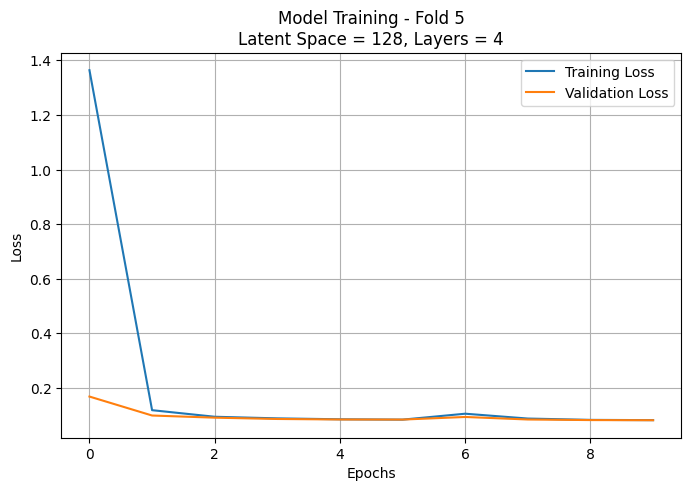

Average Validation Loss for Latent Space = 128, Layers = 4: 0.0824

Testing configuration: Latent Space = 128, Layers = 6

Training fold 1/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step - loss: 49.1076 - val_loss: 4.8632
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 1.8370 - val_loss: 0.2353
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.1969 - val_loss: 0.1261
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.1185 - val_loss: 0.1049
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - loss: 0.1023 - val_loss: 0.0969
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0956 - val_loss: 0.0926
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0919 - val_loss: 0.0903
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0899 - val_loss: 0.0889
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 0.0886 - val_loss: 0.0881
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0878 - val_loss: 0.0873


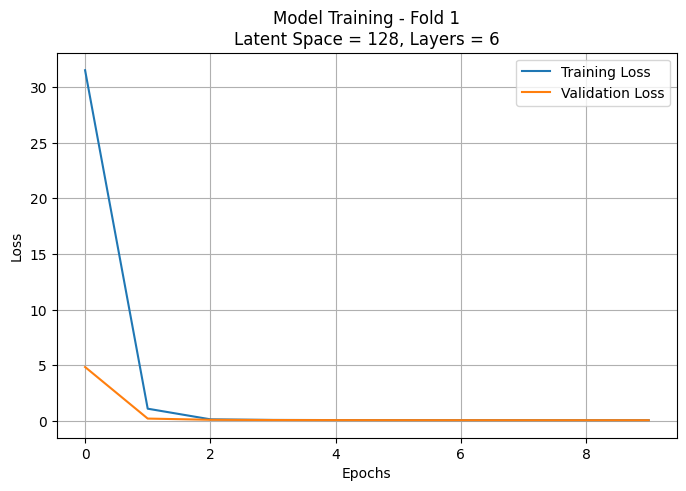


Training fold 2/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - loss: 70.1454 - val_loss: 1.9709
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.6225 - val_loss: 0.1415
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.1356 - val_loss: 0.1114
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.1087 - val_loss: 0.1013
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.0999 - val_loss: 0.0962
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0954 - val_loss: 0.0931
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0925 - val_loss: 0.0909
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0905 - val_loss: 0.0894
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0892 - val_loss: 0.0885
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 0.0884 - val_loss: 0.0878


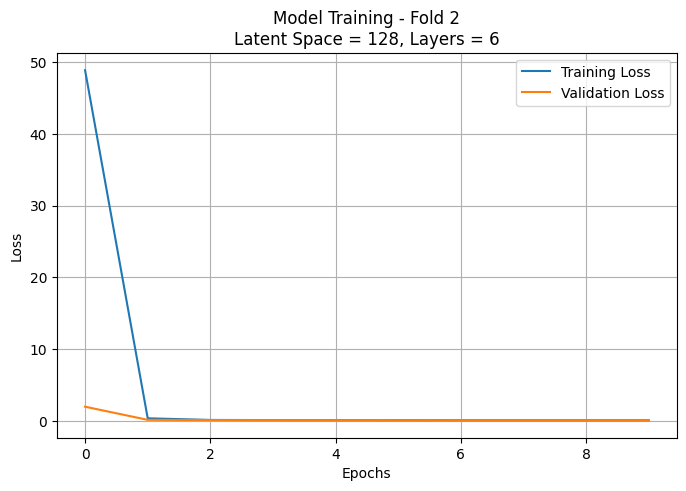


Training fold 3/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 126.7593 - val_loss: 0.8299
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.4831 - val_loss: 0.1454
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.1286 - val_loss: 0.1079
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.1045 - val_loss: 0.0981
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0966 - val_loss: 0.0933
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0924 - val_loss: 0.0905
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0899 - val_loss: 0.0887
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0882 - val_loss: 0.0874
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0871 - val_loss: 0.0866
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0863 - val_loss: 0.0860


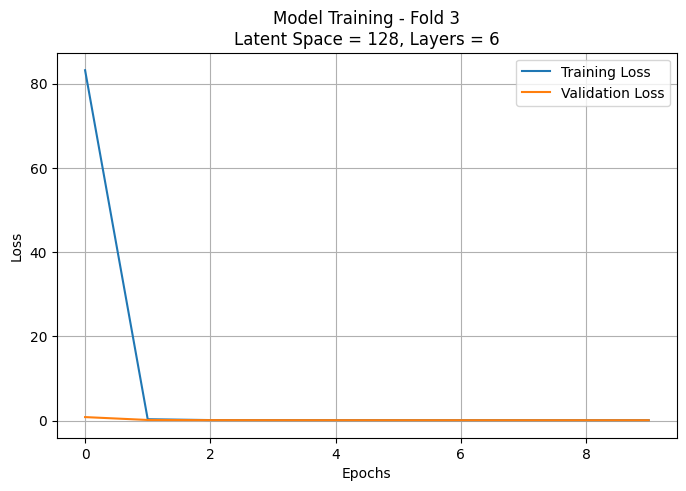


Training fold 4/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 264.0815 - val_loss: 0.6081
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.3495 - val_loss: 0.1664
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.1428 - val_loss: 0.1165
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.1127 - val_loss: 0.1055
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.1041 - val_loss: 0.1014
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 0.1004 - val_loss: 0.0984
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0977 - val_loss: 0.0962
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0956 - val_loss: 0.0945
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0940 - val_loss: 0.0930
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0926 - val_loss: 0.0918


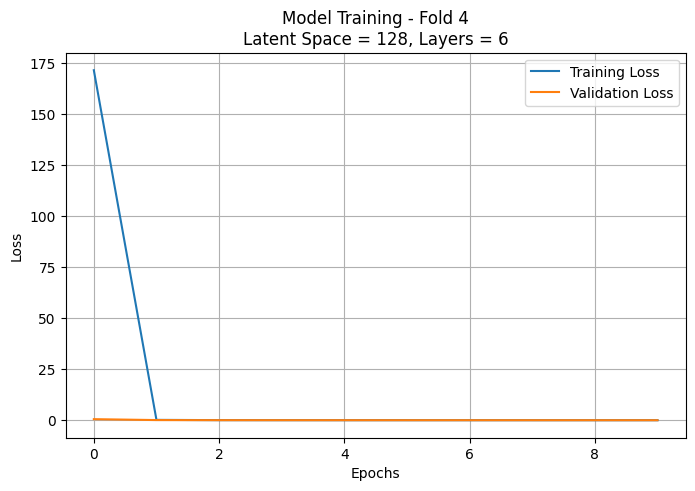


Training fold 5/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 62.2890 - val_loss: 1.0265
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.4663 - val_loss: 0.1344
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.1397 - val_loss: 0.1003
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0970 - val_loss: 0.0908
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - loss: 0.0902 - val_loss: 0.0884
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0881 - val_loss: 0.0872
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - loss: 0.0870 - val_loss: 0.0864
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0864 - val_loss: 0.0859
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 0.0858 - val_loss: 0.0855
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0855 - val_loss: 0.0852


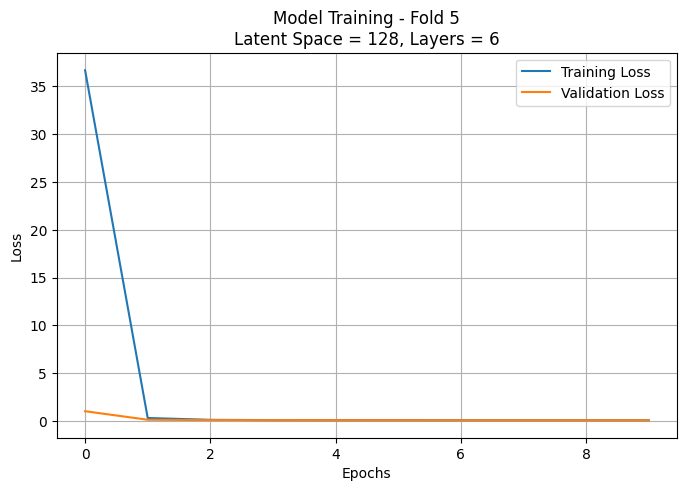

Average Validation Loss for Latent Space = 128, Layers = 6: 0.0876

Testing configuration: Latent Space = 128, Layers = 8

Training fold 1/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 14s 202ms/step - loss: 910.5248 - val_loss: 11.5691
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - loss: 12.6314 - val_loss: 0.7576
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.5687 - val_loss: 0.2477
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.2328 - val_loss: 0.2009
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1960 - val_loss: 0.1771
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step - loss: 0.1742 - val_loss: 0.1621
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.1592 - val_loss: 0.1474
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.1461 - val_loss: 0.1373
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step - loss: 0.1364 - val_loss: 0.1300
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.1291 - val_loss: 0.1243

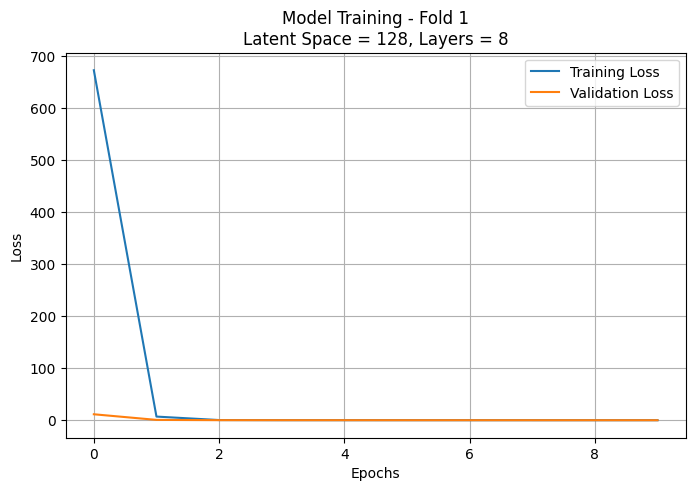


Training fold 2/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 866.6448 - val_loss: 1.3188
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 5.1170 - val_loss: 0.5421
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.3516 - val_loss: 0.1644
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - loss: 0.1497 - val_loss: 0.1242
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.1203 - val_loss: 0.1101
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.1085 - val_loss: 0.1036
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.1028 - val_loss: 0.1003
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0998 - val_loss: 0.0979
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0976 - val_loss: 0.0965
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.0961 - val_loss: 0.0950


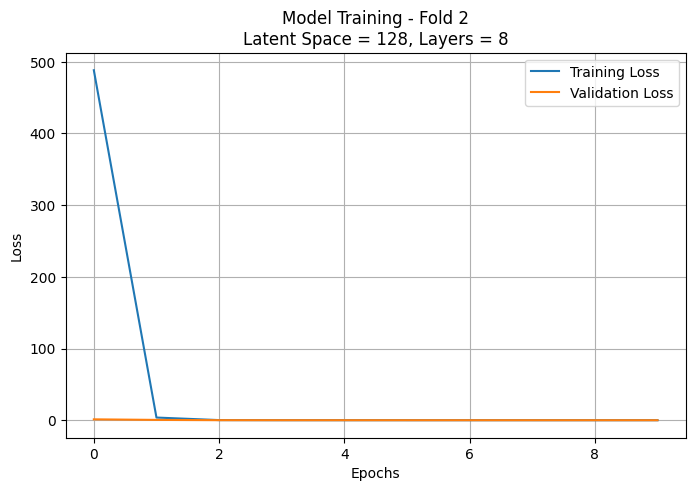


Training fold 3/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 3675.2883 - val_loss: 540.0330
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - loss: 179193.7812 - val_loss: 26.1599
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 9.3673 - val_loss: 1.2528
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - loss: 1.0338 - val_loss: 0.5772
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - loss: 0.5165 - val_loss: 0.3842
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.3600 - val_loss: 0.3013
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.2878 - val_loss: 0.2537
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2451 - val_loss: 0.2226
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step - loss: 0.2168 - val_loss: 0.2012
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1968 - val_loss: 0.1854


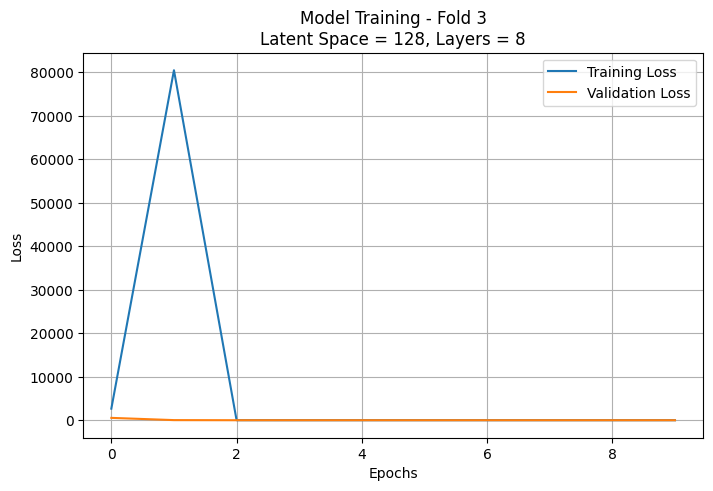


Training fold 4/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 1287.8397 - val_loss: 79.9583
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 26.5552 - val_loss: 1.3982
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.9436 - val_loss: 0.2811
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2436 - val_loss: 0.1745
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - loss: 0.1647 - val_loss: 0.1454
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.1417 - val_loss: 0.1317
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.1292 - val_loss: 0.1225
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step - loss: 0.1209 - val_loss: 0.1168
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.1157 - val_loss: 0.1130
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.1123 - val_loss: 0.1101


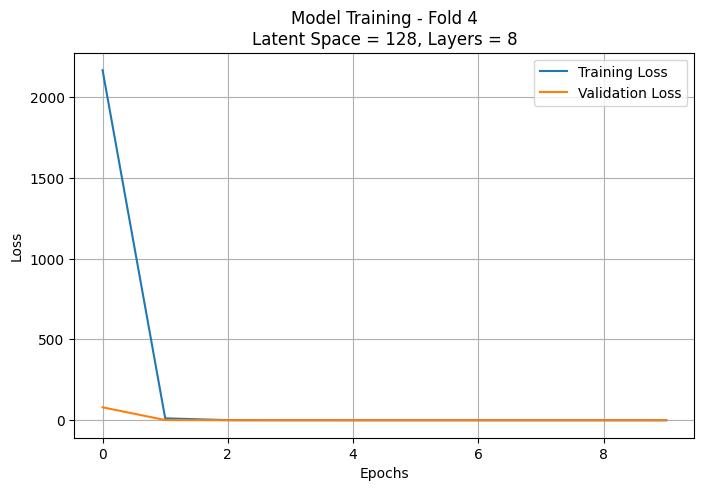


Training fold 5/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 1934.9077 - val_loss: 117.7687
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 94.1388 - val_loss: 0.5817
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.5002 - val_loss: 0.3913
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - loss: 0.3494 - val_loss: 0.2514
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2295 - val_loss: 0.1741
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.1620 - val_loss: 0.1330
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.1271 - val_loss: 0.1134
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.1108 - val_loss: 0.1048
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - loss: 0.1038 - val_loss: 0.1013
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.1008 - val_loss: 0.0998


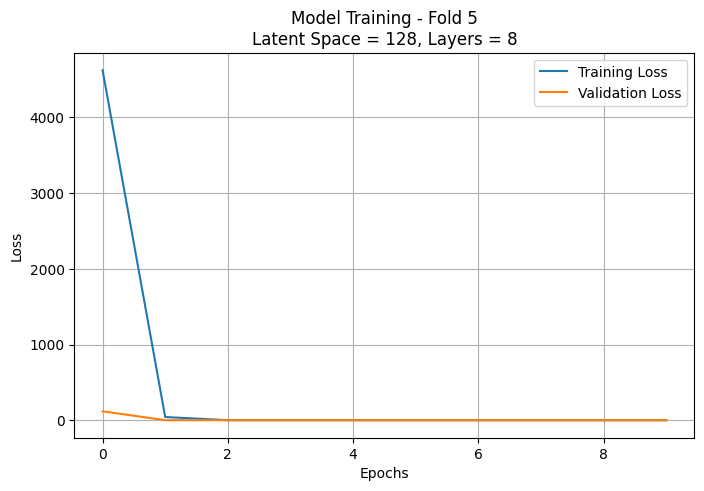

Average Validation Loss for Latent Space = 128, Layers = 8: 0.1229

Testing configuration: Latent Space = 256, Layers = 4

Training fold 1/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 19s 207ms/step - loss: 70.2708 - val_loss: 1.0157
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 1.5281 - val_loss: 0.2918
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.2665 - val_loss: 0.1480
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1272 - val_loss: 0.1004
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0975 - val_loss: 0.0926
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - loss: 0.0919 - val_loss: 0.0900
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0896 - val_loss: 0.0884
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0881 - val_loss: 0.0872
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0870 - val_loss: 0.0863
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.0861 - val_loss: 

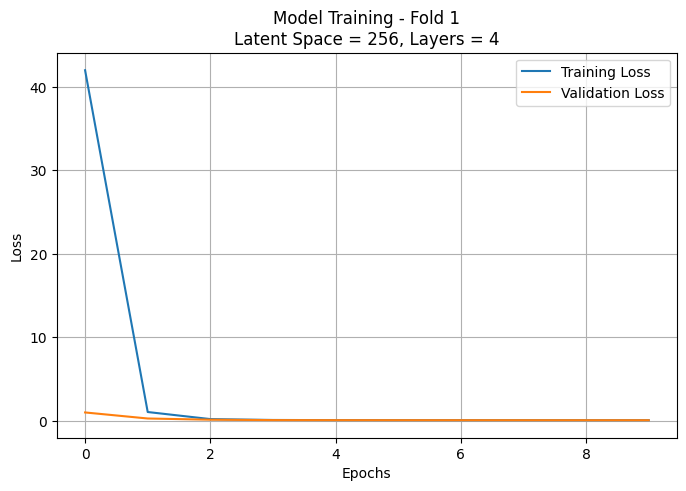


Training fold 2/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 156.3975 - val_loss: 1.7810
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step - loss: 1.3498 - val_loss: 0.1624
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1574 - val_loss: 0.1083
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - loss: 0.1017 - val_loss: 0.0954
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - loss: 0.0951 - val_loss: 0.0932
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0929 - val_loss: 0.0916
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.0914 - val_loss: 0.0905
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - loss: 0.0903 - val_loss: 0.0895
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0894 - val_loss: 0.0887
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.0885 - val_loss: 0.0879


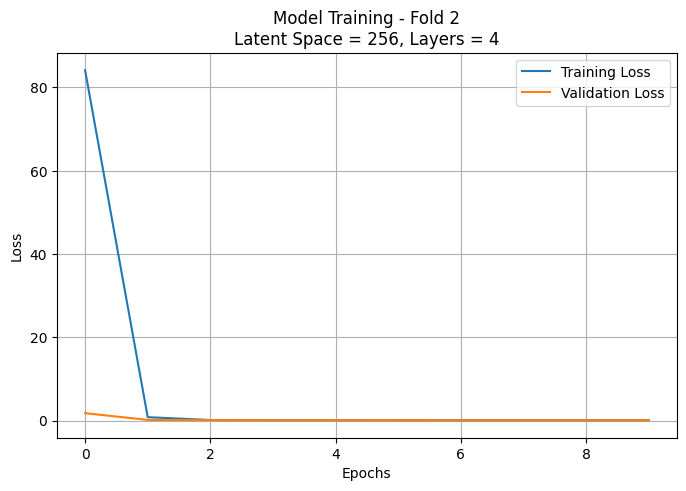


Training fold 3/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 146.1864 - val_loss: 4.6346
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 1.2284 - val_loss: 0.2700
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.2120 - val_loss: 0.1202
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1104 - val_loss: 0.0934
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - loss: 0.0916 - val_loss: 0.0887
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.0880 - val_loss: 0.0869
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.0865 - val_loss: 0.0860
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.0858 - val_loss: 0.0855
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - loss: 0.0854 - val_loss: 0.0852
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 105ms/step - loss: 0.0851 - val_loss: 0.0850


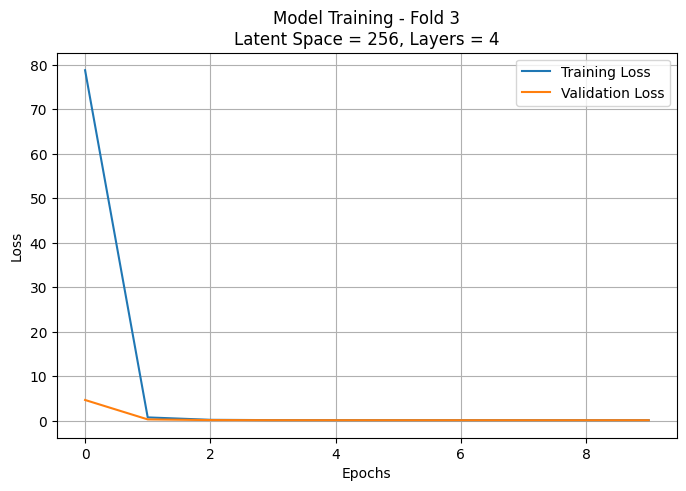


Training fold 4/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 104.9743 - val_loss: 1.4549
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.6077 - val_loss: 0.1321
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1176 - val_loss: 0.0929
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0908 - val_loss: 0.0877
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - loss: 0.0872 - val_loss: 0.0864
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.0862 - val_loss: 0.0857
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - loss: 0.0855 - val_loss: 0.0852
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.0851 - val_loss: 0.0848
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.0848 - val_loss: 0.0846
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - loss: 0.0846 - val_loss: 0.0844


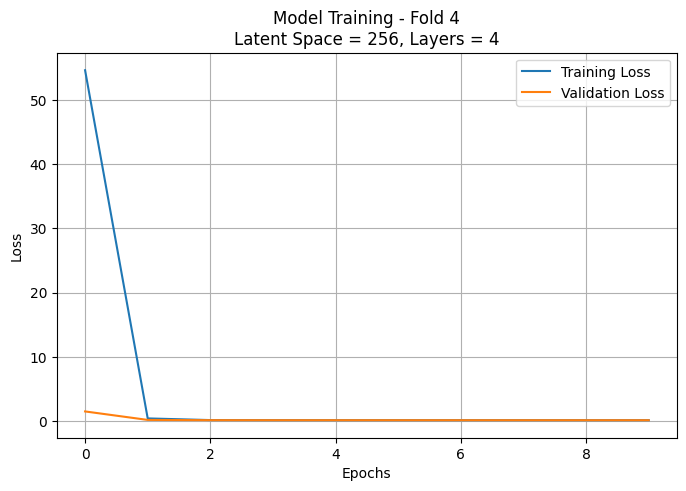


Training fold 5/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 81.2733 - val_loss: 0.7328
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.5227 - val_loss: 0.2364
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - loss: 0.1958 - val_loss: 0.1288
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 105ms/step - loss: 0.1210 - val_loss: 0.1050
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1023 - val_loss: 0.0971
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - loss: 0.0962 - val_loss: 0.0939
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0933 - val_loss: 0.0918
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0914 - val_loss: 0.0903
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - loss: 0.0900 - val_loss: 0.0891
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.0889 - val_loss: 0.0882


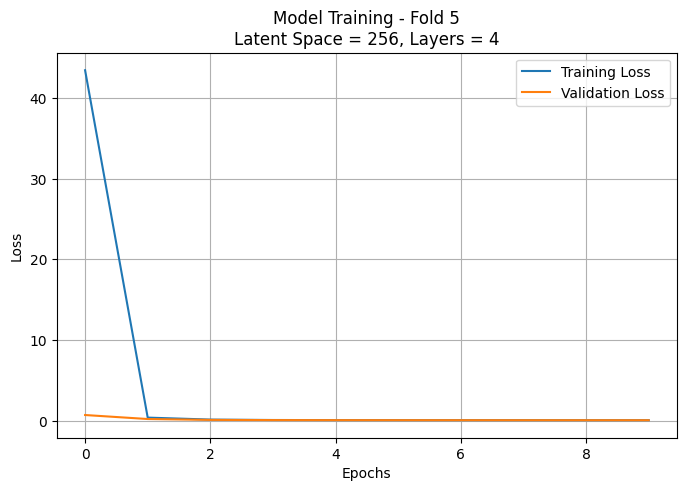

Average Validation Loss for Latent Space = 256, Layers = 4: 0.0862

Testing configuration: Latent Space = 256, Layers = 6

Training fold 1/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 19s 266ms/step - loss: 5762.1289 - val_loss: 229.4794
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 172ms/step - loss: 101.8384 - val_loss: 0.6909
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.5278 - val_loss: 0.2453
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.2240 - val_loss: 0.1800
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.1734 - val_loss: 0.1582
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 172ms/step - loss: 0.1548 - val_loss: 0.1460
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 171ms/step - loss: 0.1437 - val_loss: 0.1371
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 171ms/step - loss: 0.1353 - val_loss: 0.1299
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 172ms/step - loss: 0.1284 - val_loss: 0.1239
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.1226 - val_

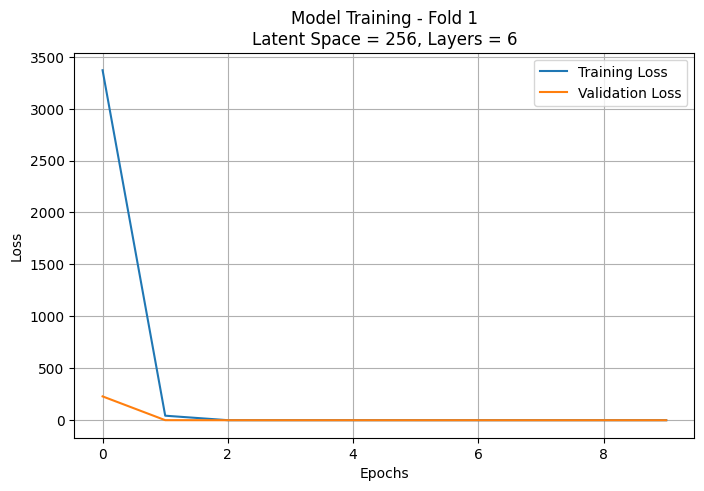


Training fold 2/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 212ms/step - loss: 5009.7573 - val_loss: 18.0100
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 169ms/step - loss: 20.1544 - val_loss: 0.7948
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.6296 - val_loss: 0.3227
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 169ms/step - loss: 0.2802 - val_loss: 0.2036
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.1937 - val_loss: 0.1700
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.1664 - val_loss: 0.1557
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.1535 - val_loss: 0.1462
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.1443 - val_loss: 0.1382
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 174ms/step - loss: 0.1370 - val_loss: 0.1323
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 172ms/step - loss: 0.1320 - val_loss: 0.1398


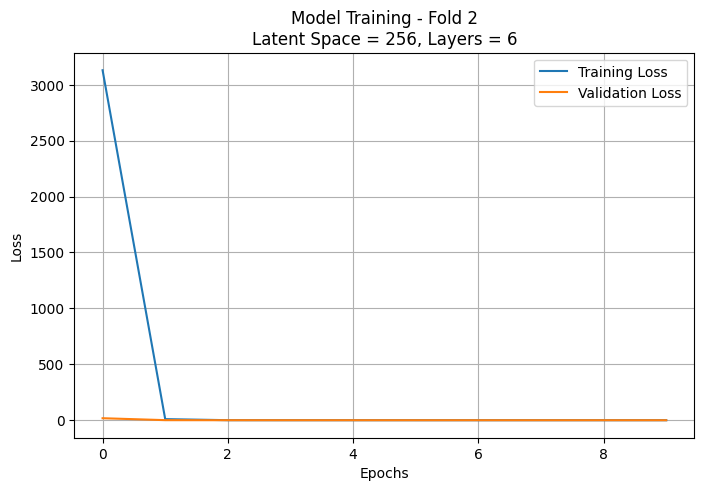


Training fold 3/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 210ms/step - loss: 25489.2734 - val_loss: 27.4485
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 45.3408 - val_loss: 5.0777
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 3.7847 - val_loss: 1.1442
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.7822 - val_loss: 0.3847
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 172ms/step - loss: 0.3479 - val_loss: 0.2723
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 172ms/step - loss: 0.2573 - val_loss: 0.2243
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.2174 - val_loss: 0.1981
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 172ms/step - loss: 0.1917 - val_loss: 0.1787
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.1739 - val_loss: 0.1653
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.1632 - val_loss: 0.1558


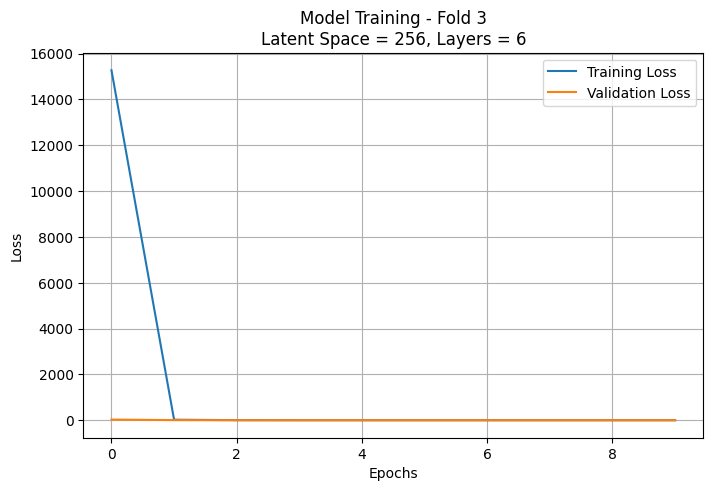


Training fold 4/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 193ms/step - loss: 3156.0164 - val_loss: 1680.9298
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 831.6411 - val_loss: 32.4169
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 17.0773 - val_loss: 3.4594
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 3.1303 - val_loss: 1.7599
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 169ms/step - loss: 1.5267 - val_loss: 1.0737
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 171ms/step - loss: 0.9986 - val_loss: 0.8290
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.7850 - val_loss: 0.6737
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.6458 - val_loss: 0.5716
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.5519 - val_loss: 0.5018
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.4878 - val_loss: 0.4504


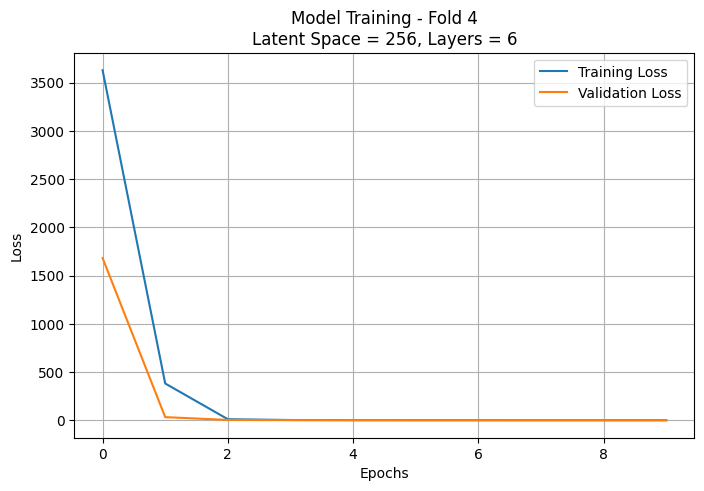


Training fold 5/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 201ms/step - loss: 1352.9315 - val_loss: 103.2851
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 169ms/step - loss: 13662.3174 - val_loss: 45.2143
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 45.1493 - val_loss: 37.2920
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 35.5044 - val_loss: 30.2705
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 28.6531 - val_loss: 23.9862
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 170ms/step - loss: 22.5848 - val_loss: 18.5951
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 169ms/step - loss: 17.4268 - val_loss: 14.1382
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 169ms/step - loss: 13.1938 - val_loss: 10.5617
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 170ms/step - loss: 9.8186 - val_loss: 7.7625
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 169ms/step - loss: 7.1912 - val_loss: 5.6189


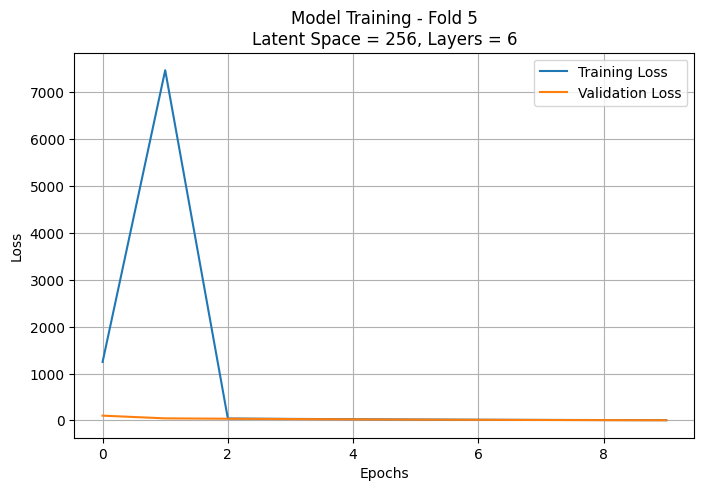

Average Validation Loss for Latent Space = 256, Layers = 6: 1.2967

Testing configuration: Latent Space = 256, Layers = 8

Training fold 1/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 25s 363ms/step - loss: 215890.4062 - val_loss: 273.9577
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 251ms/step - loss: 410.3861 - val_loss: 3.7821
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 249ms/step - loss: 3.8057 - val_loss: 3.8076
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 277ms/step - loss: 3.7869 - val_loss: 3.7214
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 250ms/step - loss: 3.6975 - val_loss: 3.6282
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 249ms/step - loss: 3.6041 - val_loss: 3.5328
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 3.5071 - val_loss: 3.4333
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 3.4067 - val_loss: 3.3298
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 250ms/step - loss: 3.3023 - val_loss: 3.2231
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 250ms/step - loss: 3.194

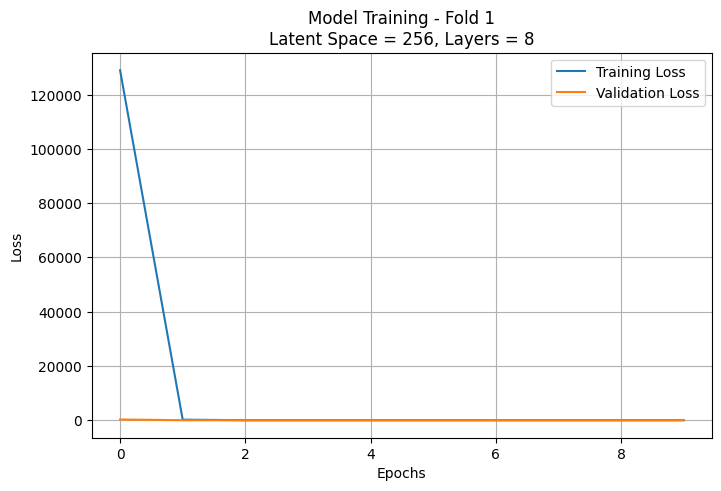


Training fold 2/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 12s 293ms/step - loss: 3151933.7500 - val_loss: 284591.8438
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 277ms/step - loss: 54629.0312 - val_loss: 59.1519
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 31.3396 - val_loss: 4.3054
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 3.4473 - val_loss: 2.3086
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 277ms/step - loss: 2.0983 - val_loss: 1.6010
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 278ms/step - loss: 1.4942 - val_loss: 1.2314
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 250ms/step - loss: 1.1683 - val_loss: 1.0084
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 251ms/step - loss: 0.9717 - val_loss: 0.8787
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 11s 276ms/step - loss: 0.8549 - val_loss: 0.7906
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 250ms/step - loss: 0.7732 - val_loss: 0.7248


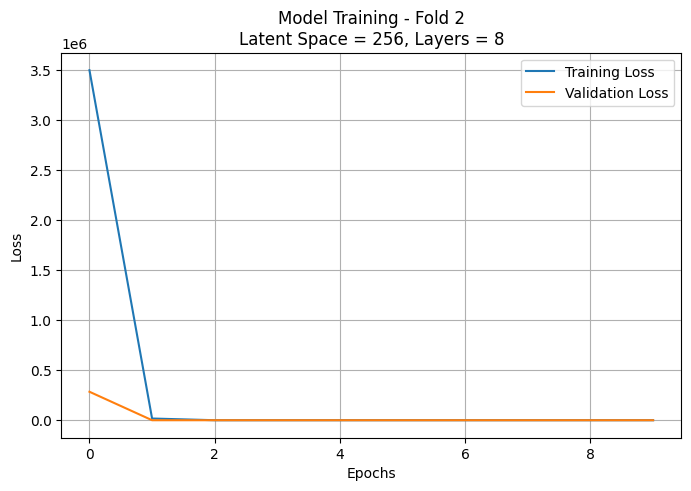


Training fold 3/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 12s 290ms/step - loss: 21221844.0000 - val_loss: 11673407.0000
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 251ms/step - loss: 12974313.0000 - val_loss: 6508.1035
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 3070.8484 - val_loss: 322.2471
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 192.1816 - val_loss: 50.3774
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 11s 278ms/step - loss: 45.2016 - val_loss: 37.9173
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 37.0150 - val_loss: 34.6991
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 11s 276ms/step - loss: 34.0070 - val_loss: 32.0349
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 278ms/step - loss: 31.4730 - val_loss: 29.7573
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 277ms/step - loss: 29.1769 - val_loss: 27.9111
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 254ms/step - loss: 27.4823 - val_loss: 26.2041


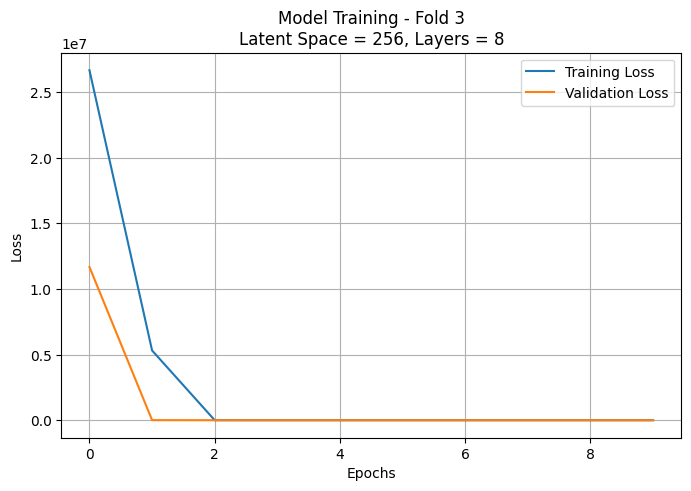


Training fold 4/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 12s 310ms/step - loss: 10121003.0000 - val_loss: 6374553.0000
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 251ms/step - loss: 85432080.0000 - val_loss: 422363.3750
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 67223.1953 - val_loss: 551.4731
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 251ms/step - loss: 281.0302 - val_loss: 50.4898
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 36.8908 - val_loss: 15.4665
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 277ms/step - loss: 14.0595 - val_loss: 11.8480
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 11.3706 - val_loss: 10.1397
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 9.8205 - val_loss: 8.8957
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 11s 277ms/step - loss: 8.6455 - val_loss: 8.0269
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 250ms/step - loss: 7.8758 - val_loss: 7.4656


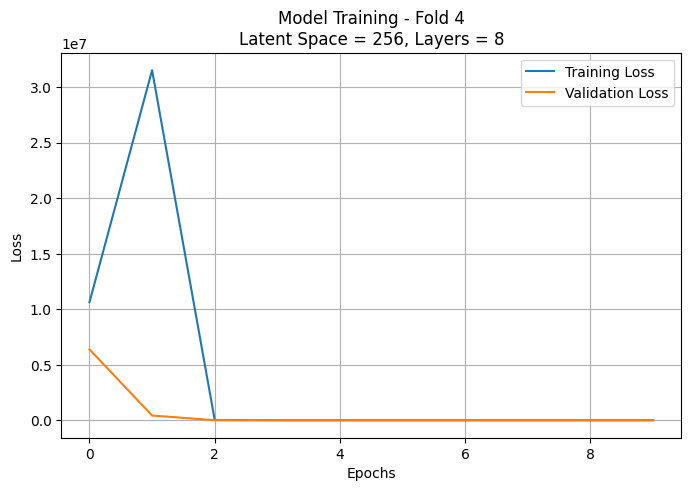


Training fold 5/5...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 13s 354ms/step - loss: 1193056.6250 - val_loss: 23329.3457
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 251ms/step - loss: 17390.7285 - val_loss: 363.4604
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - loss: 196.3430 - val_loss: 23.2035
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 279ms/step - loss: 18.5237 - val_loss: 10.2217
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 278ms/step - loss: 9.2261 - val_loss: 6.9463
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 277ms/step - loss: 6.4331 - val_loss: 5.1087
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 4.7800 - val_loss: 3.9140
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 11s 276ms/step - loss: 3.6874 - val_loss: 3.1024
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 251ms/step - loss: 2.9559 - val_loss: 2.5645
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 11s 279ms/step - loss: 2.4606 - val_loss: 2.1726


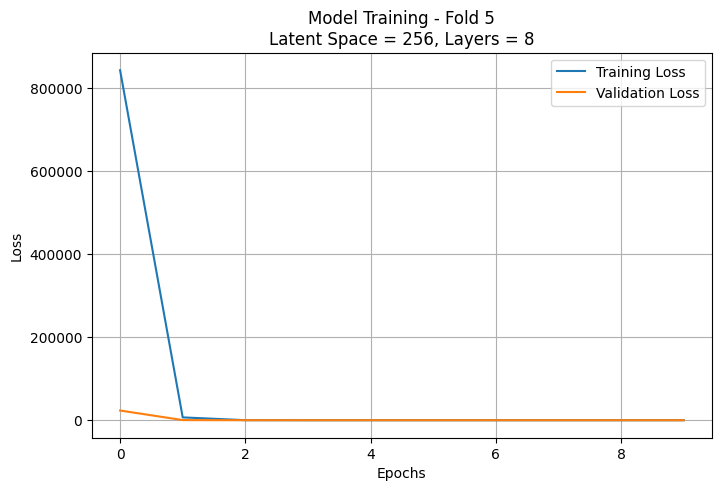

Average Validation Loss for Latent Space = 256, Layers = 8: 7.9362


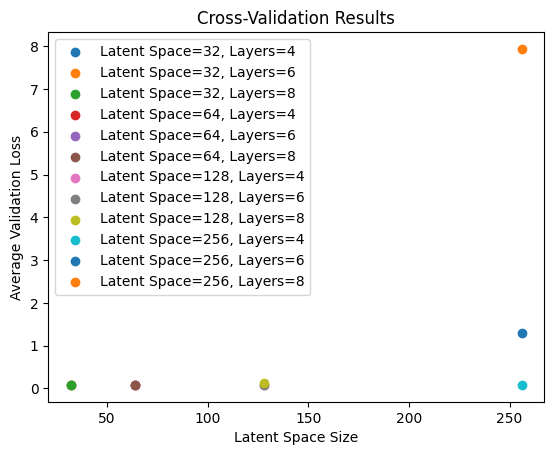

In [ ]:
# Example Usage
input_shape = (64, 64, 3)
CAE_epochs = 10
CAE_batch_size = 32
latent_space_sizes = [32, 64, 128, 256]  # List of latent space sizes to test
num_layers_options = [4, 6, 8]    # List of layer counts to test

# Ensure TrainingImages is a numpy array and properly shaped
TrainingImages = np.random.rand(1000, 64, 64, 3)  # Replace with your actual dataset
print(f"Training dataset shape: {TrainingImages.shape}")

# Perform cross-validation
results = CAE_cross_validate_model(
    TrainingImages,
    input_shape=input_shape,
    latent_space_sizes=latent_space_sizes,
    num_layers_options=num_layers_options,
    k_folds=n_splits,
    epochs=CAE_epochs,
    batch_size=CAE_batch_size
)

# Plotting results for each configuration
for config, loss in results.items():
    plt.scatter(config[0], loss, label=f"Latent Space={config[0]}, Layers={config[1]}")

plt.xlabel("Latent Space Size")
plt.ylabel("Average Validation Loss")
plt.legend()
plt.title("Cross-Validation Results")
plt.show()


# Euclidean distance classifier






In [ ]:
Combined_TrainingImages = np.concatenate((TrainingImages, ValidationImages), axis=0)
Combined_TrainingLabels = np.concatenate((TrainingLabels, ValidationLabels), axis=0)
# Flatten the Combined_TrainingImages array for Vanilla encoder
Flattened_Combined_TrainingImages = Combined_TrainingImages.reshape(Combined_TrainingImages.shape[0], -1)
Flattened_TestingImages = TestingImages.reshape(TestingImages.shape[0], -1)

In [ ]:
def euclidean_classifier(encoder_model, training_images, training_labels, testing_images, num_classes=200):
    # Ensure training_labels is a NumPy array
    training_labels = np.array(training_labels)

    # Get feature vectors (z) from the encoder for the training images
    encoder_output = encoder_model.predict(training_images)
    if isinstance(encoder_output, (list, tuple)):
        feature_vectors = encoder_output[2]  # Use z (latent vector)
    else:
        feature_vectors = encoder_output  # Handle case where encoder returns a single output

    # Convert feature_vectors to a NumPy array
    feature_vectors = np.array(feature_vectors)

    # Validate shapes
    if len(feature_vectors) != len(training_labels):
        raise ValueError(f"Mismatch in feature vector count ({len(feature_vectors)}) and training label count ({len(training_labels)})!")

    # Initialize a dictionary to store the centroids for each class
    class_centroids = {}

    # Calculate centroids for each class
    for class_id in range(num_classes):
        # Mask to select data belonging to the current class
        class_mask = (training_labels == class_id)

        if not np.any(class_mask):
            raise ValueError(f"No samples found for class {class_id} in training labels!")

        # Select feature vectors for the current class
        class_data = feature_vectors[class_mask]

        # Compute the centroid (mean of feature vectors)
        centroid = np.mean(class_data, axis=0)
        class_centroids[class_id] = centroid

    # Get encoder predictions for the test images
    encoder_output = encoder_model.predict(testing_images)
    if isinstance(encoder_output, (list, tuple)):
        encoder_predictions = encoder_output[2]  # Use z (latent vector)
    else:
        encoder_predictions = encoder_output  # Handle case where encoder returns a single output

    # Convert encoder_predictions to a NumPy array
    encoder_predictions = np.array(encoder_predictions)

    # Initialize an empty list to store the predicted class for each test image
    predicted_classes = []

    # Loop through each test image's encoder output
    for prediction in encoder_predictions:
        # Compute distances to all centroids
        distances = {class_id: np.linalg.norm(prediction - centroid) for class_id, centroid in class_centroids.items()}

        # Find the class with the minimum distance and append its label to predicted_classes[]
        predicted_class = min(distances, key=distances.get)
        predicted_classes.append(predicted_class)

    # Return the predicted classes
    return np.array(predicted_classes)

## Vanilla

In [ ]:
Vanilla_predictions = euclidean_classifier(Vanilla_encoder,Flattened_Combined_TrainingImages,Combined_TrainingLabels,Flattened_TestingImages , 200  )
# Calculate the accuracy
Vanilla_accuracy = accuracy_score(TestingLabels, Vanilla_predictions)
print(f"Vanilla autoencoder accuracy: {Vanilla_accuracy * 100:.2f}%")

539/539 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
95/95 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Vanilla autoencoder accuracy: 15.27%


## VAE

### First Trial

In [ ]:
VAE_predictions = euclidean_classifier(VAE_encoder,Combined_TrainingImages,Combined_TrainingLabels,TestingImages , 200  )
# Calculate the accuracy
VAE_accuracy = accuracy_score(TestingLabels, VAE_predictions)
print(f"VAE autoencoder accuracy: {VAE_accuracy * 100:.2f}%")

539/539 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
95/95 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
VAE autoencoder accuracy: 5.96%


### Second Trial

In [ ]:
VAE_predictions = euclidean_classifier(VAE_encoder,Combined_TrainingImages,Combined_TrainingLabels,TestingImages , 200  )
# Calculate the accuracy
VAE_accuracy = accuracy_score(TestingLabels, VAE_predictions)
print(f"VAE autoencoder accuracy: {VAE_accuracy * 100:.2f}%")

539/539 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
95/95 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
VAE autoencoder accuracy: 5.50%


## CAE

In [ ]:
CAE_predictions = euclidean_classifier(CAE_encoder,Combined_TrainingImages,Combined_TrainingLabels,TestingImages , 200  )
# Calculate the accuracy
CAE_accuracy = accuracy_score(TestingLabels, CAE_predictions)
print(f"CAE autoencoder accuracy: {CAE_accuracy * 100:.2f}%")

539/539 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
95/95 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
CAE autoencoder accuracy: 14.64%
